In [2]:
import torch

print("=" * 60)
print("GPU VERIFICATION")
print("=" * 60)

print(f"\nPyTorch version: {torch.__version__}")
print(f"CUDA available: {torch.cuda.is_available()}")

if torch.cuda.is_available():
    print(f"CUDA version: {torch.version.cuda}")
    print(f"GPU: {torch.cuda.get_device_name(0)}")
    print(f"GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1e9:.2f} GB")
    
    # Test GPU computation
    x = torch.randn(1000, 1000).cuda()
    y = torch.randn(1000, 1000).cuda()
    z = torch.matmul(x, y)
    print(f"\n✓ GPU computation: PASSED")
else:
    print(f"\n✗ CUDA not available")
    print(f"Your PyTorch version: {torch.__version__}")
    print(f"This appears to be PyTorch with CUDA 11.3 support")

print("=" * 60)

GPU VERIFICATION

PyTorch version: 1.12.1+cu113
CUDA available: True
CUDA version: 11.3
GPU: NVIDIA GeForce RTX 4060 Laptop GPU
GPU Memory: 8.59 GB

✓ GPU computation: PASSED


In [1]:
import albumentations as A
from glob import glob
import random
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from keras.utils import Sequence
from keras.layers import *
from keras.models import Model
from keras.optimizers import Adam
from keras.callbacks import ModelCheckpoint, EarlyStopping, ReduceLROnPlateau
from keras import backend as K
import matplotlib.pyplot as plt
import numpy as np
import cv2
from datetime import datetime
import os
import torch
from pathlib import Path
from collections import defaultdict
import pandas as pd
from PIL import Image
import seaborn as sns
import time
from typing import Dict, List, Tuple, Optional
import seaborn as sns
from collections import Counter
import warnings
import json
from tqdm import tqdm
import hashlib
import torch.nn.functional as F
import torch.optim as optim
from torch.optim.lr_scheduler import (
    CosineAnnealingLR,
    StepLR,
    ReduceLROnPlateau,
    LinearLR,
    SequentialLR,
    ChainedScheduler
)
from collections import OrderedDict
import math
from collections import OrderedDict
warnings.filterwarnings('ignore')
plt.style.use('seaborn-v0_8-darkgrid')
sns.set_palette("husl")

d:\Gpu-shit\nasa\lib\site-packages\albumentations\check_version.py:147: UserWarning: Error fetching version info The read operation timed out
  data = fetch_version_info()


1-Datapreprocessing

1.1:

In [4]:
DATASET_PATH = r"D:\NCT-CRC-HE-100K"

# 9 tissue classes in NCT-CRC-HE-100K
TISSUE_CLASSES = {
    'ADI': 'Adipose tissue',
    'BACK': 'Background (empty space)',
    'DEB': 'Debris',
    'LYM': 'Lymphocytes',
    'MUC': 'Mucus',
    'MUS': 'Smooth muscle',
    'NORM': 'Normal colon mucosa',
    'STR': 'Cancer-associated stroma',
    'TUM': 'Colorectal adenocarcinoma epithelium'
}

# Binary classification mapping
BINARY_MAPPING = {
    'TUM': 'Malignant',
    'ADI': 'Benign',
    'BACK': 'Benign',
    'DEB': 'Benign',
    'LYM': 'Benign',
    'MUC': 'Benign',
    'MUS': 'Benign',
    'NORM': 'Benign',
    'STR': 'Benign'
}

print("✓ Imports and configuration loaded")

print("=" * 70)
print("EXPLORING NCT-CRC-HE-100K DATASET STRUCTURE")
print("=" * 70)

dataset_path = Path(DATASET_PATH)

# Check if dataset exists
if not dataset_path.exists():
    print(f"❌ ERROR: Dataset not found at {dataset_path}")
    print("Please verify the path in the DATASET_PATH variable.")
else:
    print(f"\n✓ Dataset found at: {dataset_path}\n")
    
    # Initialize counters
    class_stats = defaultdict(lambda: {'count': 0, 'paths': []})
    total_images = 0
    
    # Scan each class directory
    print("Scanning class directories...\n")
    
    for class_name in TISSUE_CLASSES.keys():
        class_dir = dataset_path / class_name
        
        if not class_dir.exists():
            print(f"⚠️  Warning: Directory '{class_name}' not found")
            continue
        
        # Count images in this class
        image_files = list(class_dir.glob('*.tif')) + \
                     list(class_dir.glob('*.png')) + \
                     list(class_dir.glob('*.jpg'))
        
        count = len(image_files)
        class_stats[class_name]['count'] = count
        class_stats[class_name]['paths'] = image_files[:5]  # Store first 5 for sampling
        total_images += count
        
        print(f"  {class_name:8} | {TISSUE_CLASSES[class_name]:40} | {count:,} images")
    
    print("\n" + "=" * 70)
    print(f"TOTAL IMAGES: {total_images:,}")
    print("=" * 70)


print("\n" + "=" * 70)
print("CLASS DISTRIBUTION ANALYSIS")
print("=" * 70 + "\n")

# Create DataFrame
data = []
total = sum(stats['count'] for stats in class_stats.values())

for class_name, stats in sorted(class_stats.items()):
    count = stats['count']
    percentage = (count / total * 100) if total > 0 else 0
    binary_label = BINARY_MAPPING[class_name]
    
    data.append({
        'Class': class_name,
        'Description': TISSUE_CLASSES[class_name],
        'Count': count,
        'Percentage': f"{percentage:.2f}%",
        'Binary_Label': binary_label
    })

df_distribution = pd.DataFrame(data)
print(df_distribution.to_string(index=False))

# Binary distribution
print("\n" + "-" * 70)
print("BINARY CLASSIFICATION DISTRIBUTION (Malignant vs Benign)")
print("-" * 70 + "\n")

malignant = sum(stats['count'] for cls, stats in class_stats.items() 
                if BINARY_MAPPING[cls] == 'Malignant')
benign = sum(stats['count'] for cls, stats in class_stats.items() 
             if BINARY_MAPPING[cls] == 'Benign')

print(f"  Malignant (TUM):     {malignant:,} images ({malignant/total*100:.2f}%)")
print(f"  Benign (All others): {benign:,} images ({benign/total*100:.2f}%)")
print(f"  Class Balance Ratio: 1:{benign/malignant:.2f}")


print("\n" + "=" * 70)
print("SAMPLE IMAGE PROPERTIES")
print("=" * 70 + "\n")

# Find first available image
for class_name, stats in class_stats.items():
    if stats['count'] > 0 and stats['paths']:
        sample_path = stats['paths'][0]
        
        try:
            img = Image.open(sample_path)
            img_array = np.array(img)
            
            print(f"Sample from class: {class_name}")
            print(f"  Path: {sample_path.name}")
            print(f"  Image Size: {img.size} (width × height)")
            print(f"  Image Mode: {img.mode}")
            print(f"  Array Shape: {img_array.shape}")
            print(f"  Data Type: {img_array.dtype}")
            print(f"  Value Range: [{img_array.min()}, {img_array.max()}]")
            print(f"  Mean RGB: {img_array.mean(axis=(0,1))}")
            
            # Verify expected dimensions
            print("\n  Verification:")
            if img.size == (224, 224):
                print("  ✓ Image dimensions are correct (224×224)")
            else:
                print(f"  ⚠️  Unexpected dimensions: {img.size}")
            
            if img.mode == 'RGB':
                print("  ✓ Image is RGB format")
            else:
                print(f"  ⚠️  Unexpected format: {img.mode}")
            
            break
                
        except Exception as e:
            print(f"❌ Error loading image: {e}")
            continue




✓ Imports and configuration loaded
EXPLORING NCT-CRC-HE-100K DATASET STRUCTURE

✓ Dataset found at: D:\NCT-CRC-HE-100K

Scanning class directories...

  ADI      | Adipose tissue                           | 10,407 images
  BACK     | Background (empty space)                 | 10,566 images
  DEB      | Debris                                   | 11,512 images
  LYM      | Lymphocytes                              | 11,557 images
  MUC      | Mucus                                    | 8,896 images
  MUS      | Smooth muscle                            | 13,536 images
  NORM     | Normal colon mucosa                      | 8,763 images
  STR      | Cancer-associated stroma                 | 10,446 images
  TUM      | Colorectal adenocarcinoma epithelium     | 14,317 images

TOTAL IMAGES: 100,000

CLASS DISTRIBUTION ANALYSIS

Class                          Description  Count Percentage Binary_Label
  ADI                       Adipose tissue  10407     10.41%       Benign
 BACK             Ba

1.2:

In [5]:

sns.set_style("whitegrid")

DATASET_PATH = Path(r"D:\NCT-CRC-HE-100K")

# Define class names (9 tissue types)
CLASS_NAMES = ['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']

# Output file paths (these will be used by other tasks)
OUTPUT_METADATA_CSV = "dataset_metadata.csv"
OUTPUT_CLASS_MAPPING_CSV = "class_mapping.csv"
OUTPUT_DISTRIBUTION_PLOT = "class_distribution.png"

# ============================================================================
# STEP 1: CREATE CLASS MAPPING
# ============================================================================

def create_class_mapping(class_names):

    class_to_idx = {class_name: idx for idx, class_name in enumerate(class_names)}
    idx_to_class = {idx: class_name for class_name, idx in class_to_idx.items()}

    return class_to_idx, idx_to_class


# ============================================================================
# STEP 2: SCAN DATASET AND CREATE IMAGE PATH LISTS
# ============================================================================

def create_image_path_lists(dataset_path, class_names, class_to_idx):

    image_paths = []
    labels = []
    class_counts = {}

    print("=" * 70)
    print("SCANNING DATASET FOLDERS")
    print("=" * 70)
    print(f"Dataset path: {dataset_path}\n")

    for class_name in class_names:
        class_folder = dataset_path / class_name

        # Check if folder exists
        if not class_folder.exists():
            print(f"⚠️  WARNING: Folder '{class_name}' not found at {class_folder}")
            class_counts[class_name] = 0
            continue

        # Get all image files (NCT-CRC-HE-100K uses .tif format)
        image_files = list(class_folder.glob('*.tif'))

        # Remove duplicates (in case same file has multiple extensions)
        image_files = list(set(image_files))

        # Get class index
        class_idx = class_to_idx[class_name]

        # Add paths and labels
        for img_path in image_files:
            image_paths.append(str(img_path))
            labels.append(class_idx)

        class_counts[class_name] = len(image_files)
        print(f"✓ {class_name:6s}: {len(image_files):6,} images found")

    print("-" * 70)
    print(f"TOTAL IMAGES: {len(image_paths):,}")
    print("=" * 70)

    return image_paths, labels, class_counts


# ============================================================================
# STEP 3: CREATE METADATA DATAFRAME
# ============================================================================

def create_metadata_dataframe(image_paths, labels, idx_to_class):

    print("\nCreating metadata DataFrame...")

    metadata_df = pd.DataFrame({
        'image_path': image_paths,
        'label': labels,
        'class_name': [idx_to_class[label] for label in labels]
    })

    # Add binary classification column (TUM vs non-TUM)
    # This will be useful for binary classification task
    metadata_df['is_tumor'] = (metadata_df['class_name'] == 'TUM').astype(int)

    print(f"✓ Metadata DataFrame created")
    print(f"  Shape: {metadata_df.shape}")
    print(f"  Columns: {list(metadata_df.columns)}")

    return metadata_df


# ============================================================================
# STEP 4: VISUALIZE CLASS DISTRIBUTION
# ============================================================================

def visualize_class_distribution(class_counts, metadata_df, output_path):

    print("\nCreating class distribution visualization...")

    fig, axes = plt.subplots(1, 2, figsize=(16, 6))

    # Plot 1: Bar chart of class distribution (multi-class)
    ax1 = axes[0]
    class_counts_sorted = dict(sorted(class_counts.items()))
    colors = plt.cm.Set3(range(len(class_counts_sorted)))

    bars = ax1.bar(class_counts_sorted.keys(), class_counts_sorted.values(),
                   color=colors, edgecolor='black', linewidth=1.5)

    ax1.set_xlabel('Tissue Class', fontsize=13, fontweight='bold')
    ax1.set_ylabel('Number of Images', fontsize=13, fontweight='bold')
    ax1.set_title('Multi-Class Distribution (9 Classes)', fontsize=15, fontweight='bold', pad=15)
    ax1.tick_params(axis='x', rotation=45, labelsize=11)
    ax1.tick_params(axis='y', labelsize=11)
    ax1.grid(axis='y', alpha=0.3, linestyle='--')

    # Add count labels on bars
    for i, (class_name, count) in enumerate(class_counts_sorted.items()):
        height = bars[i].get_height()
        ax1.text(bars[i].get_x() + bars[i].get_width()/2., height,
                f'{count:,}',
                ha='center', va='bottom', fontsize=9, fontweight='bold')

    # Plot 2: Pie chart for binary classification
    ax2 = axes[1]
    binary_counts = metadata_df['is_tumor'].value_counts().sort_index()
    labels_binary = ['Benign\n(Non-TUM)', 'Malignant\n(TUM)']
    colors_binary = ['#90EE90', '#FF6B6B']

    wedges, texts, autotexts = ax2.pie(
        binary_counts.values,
        labels=labels_binary,
        autopct='%1.1f%%',
        colors=colors_binary,
        startangle=90,
        textprops={'fontsize': 12, 'fontweight': 'bold'},
        explode=(0.05, 0.05)
    )

    # Make percentage text larger
    for autotext in autotexts:
        autotext.set_color('white')
        autotext.set_fontsize(14)
        autotext.set_fontweight('bold')

    ax2.set_title('Binary Classification Distribution', fontsize=15, fontweight='bold', pad=15)

    # Add counts to legend
    legend_labels = [f'{labels_binary[i]}: {binary_counts.values[i]:,}'
                     for i in range(len(labels_binary))]
    ax2.legend(legend_labels, loc='upper left', bbox_to_anchor=(0.85, 1), fontsize=10)

    plt.tight_layout()
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    print(f"✓ Visualization saved to: {output_path}")

    return fig


# ============================================================================
# STEP 5: SAVE OUTPUTS
# ============================================================================

def save_metadata(metadata_df, class_to_idx,
                  metadata_csv_path, class_mapping_csv_path):

    print("\nSaving outputs...")

    # Save metadata
    metadata_df.to_csv(metadata_csv_path, index=False)
    print(f"✓ Metadata saved to: {metadata_csv_path}")

    # Save class mapping
    class_mapping_df = pd.DataFrame([
        {'class_idx': idx, 'class_name': name}
        for name, idx in class_to_idx.items()
    ]).sort_values('class_idx')

    class_mapping_df.to_csv(class_mapping_csv_path, index=False)
    print(f"✓ Class mapping saved to: {class_mapping_csv_path}")

    return class_mapping_df


# ============================================================================
# STEP 6: PRINT SUMMARY STATISTICS
# ============================================================================

def print_summary_statistics(metadata_df, class_counts):
    print("\n" + "=" * 70)
    print("SUMMARY STATISTICS")
    print("=" * 70)

    # Overall statistics
    print(f"\nTotal images: {len(metadata_df):,}")
    print(f"Number of classes: {metadata_df['class_name'].nunique()}")

    # Class distribution
    print(f"\nClass Distribution:")
    print("-" * 70)
    for class_name in sorted(class_counts.keys()):
        count = class_counts[class_name]
        percentage = (count / len(metadata_df)) * 100 if len(metadata_df) > 0 else 0
        print(f"  {class_name:6s}: {count:7,} images ({percentage:6.2f}%)")

    # Binary classification statistics
    print(f"\nBinary Classification:")
    print("-" * 70)
    tumor_count = metadata_df['is_tumor'].sum()
    non_tumor_count = len(metadata_df) - tumor_count
    tumor_pct = (tumor_count / len(metadata_df)) * 100 if len(metadata_df) > 0 else 0
    non_tumor_pct = (non_tumor_count / len(metadata_df)) * 100 if len(metadata_df) > 0 else 0

    print(f"  Malignant (TUM):  {tumor_count:7,} images ({tumor_pct:6.2f}%)")
    print(f"  Benign (non-TUM): {non_tumor_count:7,} images ({non_tumor_pct:6.2f}%)")

    # Data balance
    print(f"\nData Balance:")
    print("-" * 70)
    min_count = min(class_counts.values()) if class_counts else 0
    max_count = max(class_counts.values()) if class_counts else 0
    balance_ratio = min_count / max_count if max_count > 0 else 0

    print(f"  Min class size: {min_count:,}")
    print(f"  Max class size: {max_count:,}")
    print(f"  Balance ratio: {balance_ratio:.2f}")

    if balance_ratio < 0.5:
        print(f"  ⚠️  WARNING: Dataset is imbalanced (ratio < 0.5)")
        print(f"  → Consider using class weights or data augmentation during training")
    else:
        print(f"  ✓ Dataset is reasonably balanced")

    print("=" * 70)


def main():
    print("\n" + "=" * 70)
    print("TASK 1.3: CREATE CLASS MAPPING")
    print("=" * 70 + "\n")

    # Step 1: Create class mapping
    print("Step 1: Creating class mapping...")
    class_to_idx, idx_to_class = create_class_mapping(CLASS_NAMES)
    print(f"✓ Class mapping created for {len(CLASS_NAMES)} classes\n")

    # Save ONLY class mapping (skip metadata creation)
    class_mapping_df = pd.DataFrame([
        {'class_idx': idx, 'class_name': name}
        for name, idx in class_to_idx.items()
    ]).sort_values('class_idx')

    class_mapping_df.to_csv(OUTPUT_CLASS_MAPPING_CSV, index=False)
    print(f"✓ Class mapping saved to: {OUTPUT_CLASS_MAPPING_CSV}")
    
    print("\n" + "=" * 70)
    print("✅ TASK 1.3 COMPLETE!")
    print("=" * 70 + "\n")

main()


TASK 1.3: CREATE CLASS MAPPING

Step 1: Creating class mapping...
✓ Class mapping created for 9 classes

✓ Class mapping saved to: class_mapping.csv

✅ TASK 1.3 COMPLETE!



1.3:


🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥
COLORECTAL CANCER CLASSIFICATION - STEP 1.4
Multi-Class Classification Strategy Definition
🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥

🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬
INITIALIZING MULTI-CLASS CLASSIFICATION STRATEGY
🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬

🔍 Step 1: Analyzing dataset distribution...
Scanning dataset directories...
  ✓ ADI   : 10,407 images found
  ✓ BACK  : 10,566 images found
  ✓ DEB   : 11,512 images found
  ✓ LYM   : 11,557 images found
  ✓ MUC   : 8,896 images found
  ✓ MUS   : 13,536 images found
  ✓ NORM  : 8,763 images found
  ✓ STR   : 10,446 images found
  ✓ TUM   : 14,317 images found

CLASS DISTRIBUTION ANALYSIS

Total Images: 100,000
Number of Classes: 9

Class Distribution:

Class  Count  Percentage                                         Description
  TUM  14317       14.32   Tumor - malignant colorectal adenocarcinoma cells
  MUS  13536       13.54       Smooth muscle - muscular tissue of colon wall
  LYM

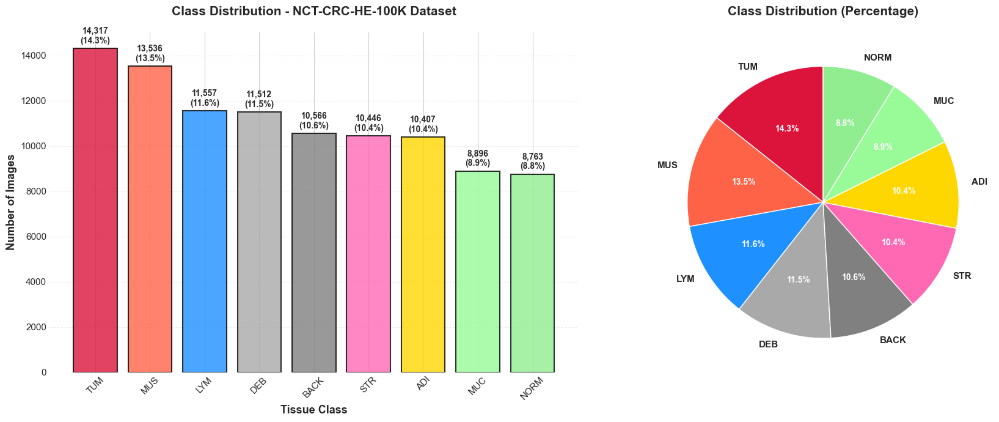


✅ Strategy initialization complete!

MULTI-CLASS CLASSIFICATION STRATEGY SUMMARY

📋 Configuration:
  Dataset path: D:\NCT-CRC-HE-100K
  Number of classes: 9
  Class names: ADI, BACK, DEB, LYM, MUC, MUS, NORM, STR, TUM
  Total images: 100,000

🎯 Priority classes (most clinically important):
  • TUM: Tumor - malignant colorectal adenocarcinoma cells
  • STR: Stroma - cancer-associated connective tissue
  • LYM: Lymphocytes - immune cells, important for prognosis
  • NORM: Normal colon mucosa - healthy epithelial tissue

🏥 Clinical grouping:
  • Malignant: TUM
  • Benign: NORM, MUS
  • Reactive: LYM, STR
  • Non_tissue: BACK, DEB, ADI, MUC

⚖️  Class imbalance handling:
  ✓ Weighted loss function (balances rare classes)
  ✓ Balanced sampling during training
  ✓ Stratified train/val/test splits

📊 Recommended evaluation metrics:
  • Accuracy - overall performance
  • Macro F1-score - balanced across all classes
  • Weighted F1-score - accounting for class size
  • Per-class precision/reca

In [6]:
class ClassificationConfig:

    CLASS_NAMES = [
        'ADI',   # Adipose (fat) tissue
        'BACK',  # Background (no tissue)
        'DEB',   # Debris
        'LYM',   # Lymphocytes (immune cells)
        'MUC',   # Mucus
        'MUS',   # Smooth muscle
        'NORM',  # Normal colon mucosa
        'STR',   # Cancer-associated stroma
        'TUM'    # Colorectal adenocarcinoma epithelium (MALIGNANT)
    ]

    CLASS_DESCRIPTIONS = {
        'ADI': 'Adipose tissue - fatty tissue surrounding the colon',
        'BACK': 'Background - areas with no tissue present',
        'DEB': 'Debris - cellular debris and artifacts',
        'LYM': 'Lymphocytes - immune cells, important for prognosis',
        'MUC': 'Mucus - mucus-producing areas',
        'MUS': 'Smooth muscle - muscular tissue of colon wall',
        'NORM': 'Normal colon mucosa - healthy epithelial tissue',
        'STR': 'Stroma - cancer-associated connective tissue',
        'TUM': 'Tumor - malignant colorectal adenocarcinoma cells'
    }

    # Create label to index mapping
    LABEL_TO_IDX = {name: idx for idx, name in enumerate(CLASS_NAMES)}

    # Create index to label mapping
    IDX_TO_LABEL = {idx: name for name, idx in LABEL_TO_IDX.items()}

    # Number of classes
    NUM_CLASSES = len(CLASS_NAMES)

    # Clinical significance grouping
    CLINICAL_GROUPS = {
        'malignant': ['TUM'],
        'benign': ['NORM', 'MUS'],
        'reactive': ['LYM', 'STR'],
        'non_tissue': ['BACK', 'DEB', 'ADI', 'MUC']
    }

    # Priority classes for diagnosis (most clinically important)
    PRIORITY_CLASSES = ['TUM', 'STR', 'LYM', 'NORM']

    # Classes to exclude from training (optional - usually kept)
    EXCLUDE_CLASSES = []  # Empty for full 9-class classification

    # Color coding for visualization
    CLASS_COLORS = {
        'ADI': '#FFD700',   # Gold
        'BACK': '#808080',  # Gray
        'DEB': '#A9A9A9',   # Dark Gray
        'LYM': '#1E90FF',   # Dodger Blue
        'MUC': '#98FB98',   # Pale Green
        'MUS': '#FF6347',   # Tomato
        'NORM': '#90EE90',  # Light Green
        'STR': '#FF69B4',   # Hot Pink
        'TUM': '#DC143C'    # Crimson (RED - most important!)
    }


# ═══════════════════════════════════════════════════════════
# 2. CLASS IMBALANCE ANALYSIS
# ═══════════════════════════════════════════════════════════

def analyze_class_distribution(data_dir: str) -> pd.DataFrame:

    data_path = Path(data_dir)

    if not data_path.exists():
        raise FileNotFoundError(f"Dataset directory not found: {data_dir}")

    class_counts = {}

    print("Scanning dataset directories...")
    for class_name in ClassificationConfig.CLASS_NAMES:
        class_path = data_path / class_name
        if class_path.exists():
            # Count .tif files in each class directory
            tif_files = list(class_path.glob('*.tif'))
            count = len(tif_files)
            class_counts[class_name] = count
            print(f"  ✓ {class_name:6s}: {count:,} images found")
        else:
            print(f"  ✗ Warning: Class directory {class_name} not found!")
            class_counts[class_name] = 0

    # Create detailed statistics
    df = pd.DataFrame({
        'Class': list(class_counts.keys()),
        'Count': list(class_counts.values())
    })

    df['Percentage'] = (df['Count'] / df['Count'].sum() * 100).round(2)
    df['Class_ID'] = df['Class'].map(ClassificationConfig.LABEL_TO_IDX)
    df['Description'] = df['Class'].map(ClassificationConfig.CLASS_DESCRIPTIONS)

    # Sort by count descending
    df = df.sort_values('Count', ascending=False).reset_index(drop=True)

    print("\n" + "=" * 80)
    print("CLASS DISTRIBUTION ANALYSIS")
    print("=" * 80)
    print(f"\nTotal Images: {df['Count'].sum():,}")
    print(f"Number of Classes: {len(df)}")
    print(f"\nClass Distribution:\n")
    print(df[['Class', 'Count', 'Percentage', 'Description']].to_string(index=False))

    # Calculate imbalance ratio
    max_count = df['Count'].max()
    min_count = df['Count'].min()
    imbalance_ratio = max_count / min_count if min_count > 0 else float('inf')
    print(f"\nImbalance Ratio (max/min): {imbalance_ratio:.2f}x")

    print("=" * 80 + "\n")

    return df


def calculate_class_weights(class_distribution: pd.DataFrame,
                           method: str = 'balanced') -> Dict[int, float]:

    counts = class_distribution.set_index('Class_ID')['Count'].to_dict()
    total_samples = sum(counts.values())
    n_classes = len(counts)

    if method == 'balanced':
        # sklearn's balanced approach: n_samples / (n_classes * n_samples_per_class)
        weights = {
            class_id: total_samples / (n_classes * count)
            for class_id, count in counts.items()
        }
    elif method == 'inverse':
        # Simple inverse frequency
        weights = {
            class_id: total_samples / count
            for class_id, count in counts.items()
        }
    elif method == 'sqrt_inverse':
        # Square root of inverse (less aggressive)
        weights = {
            class_id: np.sqrt(total_samples / count)
            for class_id, count in counts.items()
        }
    else:
        raise ValueError(f"Unknown method: {method}")

    # Normalize weights to sum to number of classes
    total_weight = sum(weights.values())
    weights = {k: v * n_classes / total_weight for k, v in weights.items()}

    print(f"\nClass Weights (method='{method}'):")
    print("-" * 40)
    for class_id in sorted(weights.keys()):
        class_name = ClassificationConfig.IDX_TO_LABEL[class_id]
        count = counts[class_id]
        print(f"  {class_name:6s} (ID {class_id}): {weights[class_id]:.4f}  [{count:,} samples]")
    print("-" * 40)

    return weights


# ═══════════════════════════════════════════════════════════
# 3. LOSS FUNCTION STRATEGY
# ═══════════════════════════════════════════════════════════

try:
    import torch
    import torch.nn as nn
    TORCH_AVAILABLE = True
except ImportError:
    TORCH_AVAILABLE = False
    print("Warning: PyTorch not installed. Loss functions will not be available.")


if TORCH_AVAILABLE:
    class MultiClassLossStrategy:

        @staticmethod
        def get_weighted_cross_entropy(class_weights: Dict[int, float],
                                       device: str = 'cuda') -> nn.Module:

            # Convert to tensor in correct order
            weight_tensor = torch.tensor([
                class_weights[i] for i in range(len(class_weights))
            ], dtype=torch.float32).to(device)

            print(f"\n✓ Weighted CrossEntropyLoss configured with weights on {device}")
            return nn.CrossEntropyLoss(weight=weight_tensor)

        @staticmethod
        def get_focal_loss(alpha: float = 0.25, gamma: float = 2.0) -> nn.Module:

            class FocalLoss(nn.Module):
                def __init__(self, alpha=0.25, gamma=2.0):
                    super().__init__()
                    self.alpha = alpha
                    self.gamma = gamma

                def forward(self, inputs, targets):
                    ce_loss = nn.functional.cross_entropy(inputs, targets, reduction='none')
                    pt = torch.exp(-ce_loss)
                    focal_loss = self.alpha * (1 - pt) ** self.gamma * ce_loss
                    return focal_loss.mean()

            print(f"\n✓ Focal Loss configured (α={alpha}, γ={gamma})")
            return FocalLoss(alpha, gamma)

        @staticmethod
        def get_label_smoothing_loss(smoothing: float = 0.1) -> nn.Module:

            print(f"\n✓ Label Smoothing CrossEntropyLoss configured (ε={smoothing})")
            return nn.CrossEntropyLoss(label_smoothing=smoothing)


# ═══════════════════════════════════════════════════════════
# 4. EVALUATION METRICS STRATEGY
# ═══════════════════════════════════════════════════════════

try:
    from sklearn.metrics import (
        accuracy_score, precision_recall_fscore_support,
        confusion_matrix, classification_report, cohen_kappa_score
    )
    SKLEARN_AVAILABLE = True
except ImportError:
    SKLEARN_AVAILABLE = False
    print("Warning: scikit-learn not installed. Evaluation metrics will be limited.")


if SKLEARN_AVAILABLE:
    class EvaluationMetrics:
        """
        Comprehensive evaluation metrics for multi-class classification.
        """

        @staticmethod
        def calculate_all_metrics(y_true: np.ndarray,
                                 y_pred: np.ndarray,
                                 y_prob: Optional[np.ndarray] = None) -> Dict:

            # Overall metrics
            accuracy = accuracy_score(y_true, y_pred)

            # Per-class metrics (macro and weighted averages)
            precision_macro, recall_macro, f1_macro, _ = precision_recall_fscore_support(
                y_true, y_pred, average='macro', zero_division=0
            )
            precision_weighted, recall_weighted, f1_weighted, _ = precision_recall_fscore_support(
                y_true, y_pred, average='weighted', zero_division=0
            )

            # Per-class detailed metrics
            precision_per_class, recall_per_class, f1_per_class, support = precision_recall_fscore_support(
                y_true, y_pred, average=None, zero_division=0
            )

            # Cohen's Kappa (agreement beyond chance)
            kappa = cohen_kappa_score(y_true, y_pred)

            # Confusion matrix
            conf_matrix = confusion_matrix(y_true, y_pred)

            metrics = {
                'accuracy': accuracy,
                'precision_macro': precision_macro,
                'recall_macro': recall_macro,
                'f1_macro': f1_macro,
                'precision_weighted': precision_weighted,
                'recall_weighted': recall_weighted,
                'f1_weighted': f1_weighted,
                'cohen_kappa': kappa,
                'confusion_matrix': conf_matrix,
                'per_class': {
                    ClassificationConfig.IDX_TO_LABEL[i]: {
                        'precision': precision_per_class[i],
                        'recall': recall_per_class[i],
                        'f1': f1_per_class[i],
                        'support': int(support[i])
                    }
                    for i in range(len(ClassificationConfig.CLASS_NAMES))
                }
            }

            return metrics

        @staticmethod
        def print_metrics(metrics: Dict):
            """Pretty print all metrics."""
            print("\n" + "=" * 80)
            print("EVALUATION METRICS")
            print("=" * 80)

            print(f"\nOverall Metrics:")
            print(f"  Accuracy:           {metrics['accuracy']:.4f}")
            print(f"  Precision (Macro):  {metrics['precision_macro']:.4f}")
            print(f"  Recall (Macro):     {metrics['recall_macro']:.4f}")
            print(f"  F1-Score (Macro):   {metrics['f1_macro']:.4f}")
            print(f"  Precision (Wtd):    {metrics['precision_weighted']:.4f}")
            print(f"  Recall (Wtd):       {metrics['recall_weighted']:.4f}")
            print(f"  F1-Score (Wtd):     {metrics['f1_weighted']:.4f}")
            print(f"  Cohen's Kappa:      {metrics['cohen_kappa']:.4f}")

            print(f"\nPer-Class Metrics:")
            print(f"{'Class':<6} {'Precision':<10} {'Recall':<10} {'F1-Score':<10} {'Support':<10}")
            print("-" * 60)
            for class_name, class_metrics in metrics['per_class'].items():
                print(f"{class_name:<6} "
                      f"{class_metrics['precision']:<10.4f} "
                      f"{class_metrics['recall']:<10.4f} "
                      f"{class_metrics['f1']:<10.4f} "
                      f"{class_metrics['support']:<10}")

            print("=" * 80)


# ═══════════════════════════════════════════════════════════
# 5. VISUALIZATION FUNCTIONS
# ═══════════════════════════════════════════════════════════

def plot_class_distribution(class_distribution: pd.DataFrame,
                           save_path: Optional[str] = None):

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))

    # Bar plot with counts
    colors = [ClassificationConfig.CLASS_COLORS[c] for c in class_distribution['Class']]
    bars = ax1.bar(class_distribution['Class'], class_distribution['Count'],
                   color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)

    ax1.set_xlabel('Tissue Class', fontsize=13, fontweight='bold')
    ax1.set_ylabel('Number of Images', fontsize=13, fontweight='bold')
    ax1.set_title('Class Distribution - NCT-CRC-HE-100K Dataset',
                  fontsize=15, fontweight='bold', pad=20)
    ax1.tick_params(axis='x', rotation=45, labelsize=11)
    ax1.tick_params(axis='y', labelsize=11)
    ax1.grid(axis='y', alpha=0.3, linestyle='--')

    # Add count labels on bars
    for i, (idx, row) in enumerate(class_distribution.iterrows()):
        height = row['Count']
        ax1.text(i, height + max(class_distribution['Count']) * 0.01,
                f"{row['Count']:,}\n({row['Percentage']:.1f}%)",
                ha='center', va='bottom', fontsize=10, fontweight='bold')

    # Pie chart
    wedges, texts, autotexts = ax2.pie(
        class_distribution['Count'],
        labels=class_distribution['Class'],
        colors=colors,
        autopct='%1.1f%%',
        startangle=90,
        textprops={'fontsize': 11, 'fontweight': 'bold'}
    )

    # Make percentage text more visible
    for autotext in autotexts:
        autotext.set_color('white')
        autotext.set_fontsize(10)

    ax2.set_title('Class Distribution (Percentage)',
                  fontsize=15, fontweight='bold', pad=20)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"✓ Plot saved to {save_path}")

    plt.show()


def plot_confusion_matrix(conf_matrix: np.ndarray,
                         normalize: bool = True,
                         save_path: Optional[str] = None):

    if normalize:
        # Normalize by row (true labels)
        conf_matrix_norm = conf_matrix.astype('float')
        row_sums = conf_matrix_norm.sum(axis=1)[:, np.newaxis]
        # Avoid division by zero
        row_sums[row_sums == 0] = 1
        conf_matrix_norm = conf_matrix_norm / row_sums
        fmt = '.2f'
        title = 'Normalized Confusion Matrix (Row-wise)'
        data_to_plot = conf_matrix_norm
    else:
        fmt = 'd'
        title = 'Confusion Matrix (Counts)'
        data_to_plot = conf_matrix

    plt.figure(figsize=(14, 12))

    # Create heatmap
    sns.heatmap(data_to_plot, annot=True, fmt=fmt, cmap='Blues',
                xticklabels=ClassificationConfig.CLASS_NAMES,
                yticklabels=ClassificationConfig.CLASS_NAMES,
                cbar_kws={'label': 'Proportion' if normalize else 'Count'},
                linewidths=0.5, linecolor='gray',
                annot_kws={'fontsize': 10, 'fontweight': 'bold'})

    plt.xlabel('Predicted Label', fontsize=13, fontweight='bold')
    plt.ylabel('True Label', fontsize=13, fontweight='bold')
    plt.title(title, fontsize=15, fontweight='bold', pad=20)

    # Rotate labels for better readability
    plt.xticks(rotation=45, ha='right')
    plt.yticks(rotation=0)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"✓ Confusion matrix saved to {save_path}")

    plt.show()


# ═══════════════════════════════════════════════════════════
# 6. SAMPLING STRATEGY
# ═══════════════════════════════════════════════════════════

if TORCH_AVAILABLE:
    class SamplingStrategy:

        @staticmethod
        def get_balanced_sampler(labels: List[int],
                                dataset_size: int):

            import torch.utils.data as data

            # Count samples per class
            class_counts = Counter(labels)

            # Calculate weight for each sample (inverse frequency)
            sample_weights = [1.0 / class_counts[label] for label in labels]

            sampler = data.WeightedRandomSampler(
                weights=sample_weights,
                num_samples=dataset_size,
                replacement=True
            )

            print(f"\n✓ Balanced sampler created for {dataset_size:,} samples")
            return sampler


if SKLEARN_AVAILABLE:
    class StratifiedSplitter:

        @staticmethod
        def get_stratified_split(labels: np.ndarray,
                               train_size: float = 0.7,
                               val_size: float = 0.15,
                               test_size: float = 0.15,
                               random_state: int = 42) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:

            from sklearn.model_selection import train_test_split

            assert abs(train_size + val_size + test_size - 1.0) < 1e-6, \
                "Split sizes must sum to 1.0"

            indices = np.arange(len(labels))

            # First split: train vs (val + test)
            train_idx, temp_idx = train_test_split(
                indices,
                train_size=train_size,
                stratify=labels,
                random_state=random_state
            )

            # Second split: val vs test
            val_ratio = val_size / (val_size + test_size)
            val_idx, test_idx = train_test_split(
                temp_idx,
                train_size=val_ratio,
                stratify=labels[temp_idx],
                random_state=random_state
            )

            print(f"\n✓ Stratified Split Results:")
            print(f"  Train: {len(train_idx):,} samples ({len(train_idx)/len(labels)*100:.1f}%)")
            print(f"  Val:   {len(val_idx):,} samples ({len(val_idx)/len(labels)*100:.1f}%)")
            print(f"  Test:  {len(test_idx):,} samples ({len(test_idx)/len(labels)*100:.1f}%)")

            # Verify stratification
            print(f"\n  Class distribution verification:")
            for class_name in ClassificationConfig.CLASS_NAMES:
                class_idx = ClassificationConfig.LABEL_TO_IDX[class_name]
                train_pct = (labels[train_idx] == class_idx).sum() / len(train_idx) * 100
                val_pct = (labels[val_idx] == class_idx).sum() / len(val_idx) * 100
                test_pct = (labels[test_idx] == class_idx).sum() / len(test_idx) * 100
                print(f"    {class_name}: Train={train_pct:.1f}%, Val={val_pct:.1f}%, Test={test_pct:.1f}%")

            return train_idx, val_idx, test_idx


# ═══════════════════════════════════════════════════════════
# 7. COMPLETE STRATEGY CONFIGURATION
# ═══════════════════════════════════════════════════════════

class MultiClassStrategy:

    def __init__(self, data_dir: str):

        self.config = ClassificationConfig()
        self.data_dir = data_dir

        print("\n" + "🔬" * 40)
        print("INITIALIZING MULTI-CLASS CLASSIFICATION STRATEGY")
        print("🔬" * 40)

        # Analyze dataset
        print("\n🔍 Step 1: Analyzing dataset distribution...")
        self.class_distribution = analyze_class_distribution(data_dir)

        # Calculate class weights
        print("\n⚖️  Step 2: Calculating class weights...")
        self.class_weights = calculate_class_weights(
            self.class_distribution,
            method='balanced'
        )

        # Visualize
        print("\n📊 Step 3: Creating visualizations...")
        plot_class_distribution(self.class_distribution)

        print("\n✅ Strategy initialization complete!")

    def get_loss_function(self,
                         strategy: str = 'weighted_ce',
                         device: str = 'cuda') -> nn.Module:

        if not TORCH_AVAILABLE:
            raise RuntimeError("PyTorch not installed. Cannot create loss function.")

        loss_strategy = MultiClassLossStrategy()

        if strategy == 'weighted_ce':
            return loss_strategy.get_weighted_cross_entropy(self.class_weights, device)
        elif strategy == 'focal':
            return loss_strategy.get_focal_loss(alpha=0.25, gamma=2.0)
        elif strategy == 'label_smoothing':
            return loss_strategy.get_label_smoothing_loss(smoothing=0.1)
        else:
            raise ValueError(f"Unknown strategy: {strategy}")

    def get_sampler(self, labels: List[int], dataset_size: int):
        """Get balanced sampler for training."""
        if not TORCH_AVAILABLE:
            raise RuntimeError("PyTorch not installed. Cannot create sampler.")
        return SamplingStrategy.get_balanced_sampler(labels, dataset_size)

    def create_splits(self, labels: np.ndarray):
        """Create stratified train/val/test splits."""
        if not SKLEARN_AVAILABLE:
            raise RuntimeError("scikit-learn not installed. Cannot create splits.")
        return StratifiedSplitter.get_stratified_split(labels)

    def evaluate(self, y_true: np.ndarray, y_pred: np.ndarray) -> Dict:
        """Evaluate predictions and print results."""
        if not SKLEARN_AVAILABLE:
            raise RuntimeError("scikit-learn not installed. Cannot evaluate.")
        metrics = EvaluationMetrics.calculate_all_metrics(y_true, y_pred)
        EvaluationMetrics.print_metrics(metrics)
        plot_confusion_matrix(metrics['confusion_matrix'])
        return metrics

    def summary(self):
        """Print complete strategy summary."""
        print("\n" + "=" * 80)
        print("MULTI-CLASS CLASSIFICATION STRATEGY SUMMARY")
        print("=" * 80)
        print(f"\n📋 Configuration:")
        print(f"  Dataset path: {self.data_dir}")
        print(f"  Number of classes: {self.config.NUM_CLASSES}")
        print(f"  Class names: {', '.join(self.config.CLASS_NAMES)}")
        print(f"  Total images: {self.class_distribution['Count'].sum():,}")

        print(f"\n🎯 Priority classes (most clinically important):")
        for cls in self.config.PRIORITY_CLASSES:
            desc = self.config.CLASS_DESCRIPTIONS[cls]
            print(f"  • {cls}: {desc}")

        print(f"\n🏥 Clinical grouping:")
        for group, classes in self.config.CLINICAL_GROUPS.items():
            print(f"  • {group.capitalize()}: {', '.join(classes)}")

        print(f"\n⚖️  Class imbalance handling:")
        print(f"  ✓ Weighted loss function (balances rare classes)")
        print(f"  ✓ Balanced sampling during training")
        print(f"  ✓ Stratified train/val/test splits")

        print(f"\n📊 Recommended evaluation metrics:")
        print(f"  • Accuracy - overall performance")
        print(f"  • Macro F1-score - balanced across all classes")
        print(f"  • Weighted F1-score - accounting for class size")
        print(f"  • Per-class precision/recall - especially for TUM (tumor)")
        print(f"  • Confusion matrix - identify common misclassifications")
        print(f"  • Cohen's Kappa - agreement beyond chance")

        print(f"\n🔧 Available methods:")
        print(f"  • strategy.get_loss_function() - Get configured loss")
        print(f"  • strategy.get_sampler() - Get balanced sampler")
        print(f"  • strategy.create_splits() - Create stratified splits")
        print(f"  • strategy.evaluate() - Evaluate model predictions")

        print("=" * 80 + "\n")

    def export_config(self, save_path: str):

        config_dict = {
            'dataset_path': self.data_dir,
            'num_classes': self.config.NUM_CLASSES,
            'class_names': self.config.CLASS_NAMES,
            'label_to_idx': self.config.LABEL_TO_IDX,
            'idx_to_label': self.config.IDX_TO_LABEL,
            'class_descriptions': self.config.CLASS_DESCRIPTIONS,
            'class_weights': self.class_weights,
            'class_distribution': self.class_distribution.to_dict('records'),
            'clinical_groups': self.config.CLINICAL_GROUPS,
            'priority_classes': self.config.PRIORITY_CLASSES
        }

        import json
        with open(save_path, 'w') as f:
            json.dump(config_dict, f, indent=2)

        print(f"✓ Configuration exported to {save_path}")


# ═══════════════════════════════════════════════════════════
# 8. MAIN EXECUTION
# ═══════════════════════════════════════════════════════════

if __name__ == "__main__":

    DATASET_PATH = r"D:\NCT-CRC-HE-100K"

    print("\n" + "🏥" * 40)
    print("COLORECTAL CANCER CLASSIFICATION - STEP 1.4")
    print("Multi-Class Classification Strategy Definition")
    print("🏥" * 40)

    try:

        strategy = MultiClassStrategy(DATASET_PATH)
        strategy.summary()
        config_save_path = "classification_config.json"
        strategy.export_config(config_save_path)

        print("\n" + "✅" * 40)
        print("STEP 1.4 COMPLETE!")
        print("✅" * 40)

        print("\n📝 What's been accomplished:")
        print("  ✓ Dataset analyzed and class distribution calculated")
        print("  ✓ Class weights computed for imbalance handling")
        print("  ✓ Visualization of class distribution created")
        print("  ✓ Configuration exported for team sharing")

        print("\n🚀 Next steps:")
        print("  1. Review the class distribution plot")
        print("  2. Confirm the classification strategy with your team")
        print("  3. Proceed to Step 1.5: Data Loading & Augmentation")

        print("\n💡 Key objects available for next steps:")
        print("  • strategy.config - ClassificationConfig instance")
        print("  • strategy.class_distribution - DataFrame with class stats")
        print("  • strategy.class_weights - Dictionary of class weights")
        print("  • strategy.get_loss_function() - Get loss for training")

    except Exception as e:
        print(f"\n❌ Error occurred: {str(e)}")
        print("\nPlease check:")
        print("  1. Dataset path is correct")
        print("  2. Dataset is extracted and structured properly")
        print("  3. All required libraries are installed")
        raise


1.4:

In [7]:
# Trained file is available in the folder

1.5:

In [8]:


class ClassificationConfig:
    CLASS_NAMES = ['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']
    LABEL_TO_IDX = {name: idx for idx, name in enumerate(CLASS_NAMES)}
    IDX_TO_LABEL = {idx: name for name, idx in LABEL_TO_IDX.items()}
    NUM_CLASSES = len(CLASS_NAMES)
    CLASS_DESCRIPTIONS = {
        'ADI': 'Adipose tissue',
        'BACK': 'Background',
        'DEB': 'Debris',
        'LYM': 'Lymphocytes',
        'MUC': 'Mucus',
        'MUS': 'Smooth muscle',
        'NORM': 'Normal colon mucosa',
        'STR': 'Stroma',
        'TUM': 'Tumor'
    }


# ═══════════════════════════════════════════════════════════
# 1. METADATA CREATION FUNCTIONS
# ═══════════════════════════════════════════════════════════

def collect_image_paths(data_dir: str,
                       file_extension: str = '*.tif',
                       verbose: bool = True) -> List[Dict]:

    data_path = Path(data_dir)

    if not data_path.exists():
        raise FileNotFoundError(f"Dataset directory not found: {data_dir}")

    image_records = []

    if verbose:
        print("Collecting image paths from dataset...")
        print(f"Dataset directory: {data_path}")
        print(f"File pattern: {file_extension}\n")

    # Iterate through each class directory
    for class_name in tqdm(ClassificationConfig.CLASS_NAMES,
                           desc="Scanning classes",
                           disable=not verbose):

        class_path = data_path / class_name

        if not class_path.exists():
            print(f"⚠️  Warning: Class directory '{class_name}' not found!")
            continue

        # Get all image files in this class
        image_files = list(class_path.glob(file_extension))

        # Create record for each image
        for img_path in image_files:
            record = {
                'image_path': str(img_path),
                'relative_path': str(img_path.relative_to(data_path)),
                'filename': img_path.name,
                'class_name': class_name,
                'class_id': ClassificationConfig.LABEL_TO_IDX[class_name],
                'file_size_bytes': img_path.stat().st_size,
            }
            image_records.append(record)

    if verbose:
        print(f"\n✓ Collected {len(image_records):,} images from {len(ClassificationConfig.CLASS_NAMES)} classes")

    return image_records


def create_metadata_dataframe(image_records: List[Dict],
                              add_hash: bool = False,
                              verbose: bool = True) -> pd.DataFrame:
    if verbose:
        print("\nCreating metadata DataFrame...")

    # Create initial DataFrame
    df = pd.DataFrame(image_records)

    # Add human-readable file size
    df['file_size_mb'] = (df['file_size_bytes'] / (1024 * 1024)).round(4)

    # Add class description
    df['class_description'] = df['class_name'].map(ClassificationConfig.CLASS_DESCRIPTIONS)

    # Add dataset split placeholder (will be filled in step 1.7)
    df['split'] = None  # Will be 'train', 'val', or 'test'

    # Add index for tracking
    df['image_id'] = range(len(df))

    # Add metadata timestamp
    df['metadata_created'] = datetime.now().strftime('%Y-%m-%d %H:%M:%S')

    # Optionally add file hash for verification
    if add_hash:
        if verbose:
            print("Computing file hashes (this may take a while)...")
        df['file_hash'] = df['image_path'].progress_apply(_compute_file_hash) if verbose else df['image_path'].apply(_compute_file_hash)

    # Reorder columns for better readability
    column_order = [
        'image_id',
        'filename',
        'image_path',
        'relative_path',
        'class_name',
        'class_id',
        'class_description',
        'split',
        'file_size_bytes',
        'file_size_mb',
        'metadata_created'
    ]

    if add_hash:
        column_order.append('file_hash')

    df = df[column_order]

    if verbose:
        print(f"✓ Metadata DataFrame created with {len(df):,} rows and {len(df.columns)} columns")

    return df


def _compute_file_hash(filepath: str, algorithm: str = 'md5') -> str:
    hash_func = hashlib.new(algorithm)

    try:
        with open(filepath, 'rb') as f:
            # Read file in chunks to handle large files
            for chunk in iter(lambda: f.read(4096), b''):
                hash_func.update(chunk)
        return hash_func.hexdigest()
    except Exception as e:
        return f"ERROR: {str(e)}"


# ═══════════════════════════════════════════════════════════
# 2. METADATA ANALYSIS & VALIDATION
# ═══════════════════════════════════════════════════════════

def analyze_metadata(df: pd.DataFrame, verbose: bool = True) -> Dict:
    analysis = {}

    # Basic statistics
    analysis['total_images'] = len(df)
    analysis['num_classes'] = df['class_id'].nunique()
    analysis['class_distribution'] = df['class_name'].value_counts().to_dict()

    # File size statistics
    analysis['total_size_gb'] = (df['file_size_bytes'].sum() / (1024**3))
    analysis['avg_file_size_mb'] = df['file_size_mb'].mean()
    analysis['min_file_size_mb'] = df['file_size_mb'].min()
    analysis['max_file_size_mb'] = df['file_size_mb'].max()

    # Check for duplicates
    analysis['duplicate_filenames'] = df['filename'].duplicated().sum()
    analysis['duplicate_paths'] = df['image_path'].duplicated().sum()

    # Check for missing values
    analysis['missing_values'] = df.isnull().sum().to_dict()

    # Validate class IDs
    expected_class_ids = set(range(ClassificationConfig.NUM_CLASSES))
    actual_class_ids = set(df['class_id'].unique())
    analysis['missing_class_ids'] = list(expected_class_ids - actual_class_ids)
    analysis['unexpected_class_ids'] = list(actual_class_ids - expected_class_ids)

    if verbose:
        print("\n" + "=" * 80)
        print("METADATA ANALYSIS")
        print("=" * 80)

        print(f"\n📊 Basic Statistics:")
        print(f"  Total images: {analysis['total_images']:,}")
        print(f"  Number of classes: {analysis['num_classes']}")
        print(f"  Total dataset size: {analysis['total_size_gb']:.2f} GB")
        print(f"  Average file size: {analysis['avg_file_size_mb']:.4f} MB")
        print(f"  File size range: {analysis['min_file_size_mb']:.4f} - {analysis['max_file_size_mb']:.4f} MB")

        print(f"\n📈 Class Distribution:")
        for class_name, count in sorted(analysis['class_distribution'].items()):
            percentage = (count / analysis['total_images']) * 100
            print(f"  {class_name:6s}: {count:6,} images ({percentage:5.2f}%)")

        print(f"\n🔍 Data Quality Checks:")
        print(f"  Duplicate filenames: {analysis['duplicate_filenames']}")
        print(f"  Duplicate paths: {analysis['duplicate_paths']}")

        if analysis['missing_class_ids']:
            print(f"  ⚠️  Missing class IDs: {analysis['missing_class_ids']}")
        else:
            print(f"  ✓ All class IDs present")

        if analysis['unexpected_class_ids']:
            print(f"  ⚠️  Unexpected class IDs: {analysis['unexpected_class_ids']}")
        else:
            print(f"  ✓ No unexpected class IDs")

        # Check missing values
        has_missing = False
        for col, count in analysis['missing_values'].items():
            if count > 0 and col != 'split':  # 'split' is expected to be None initially
                print(f"  ⚠️  Missing values in '{col}': {count}")
                has_missing = True

        if not has_missing:
            print(f"  ✓ No unexpected missing values")

        print("=" * 80 + "\n")

    return analysis


def validate_metadata(df: pd.DataFrame) -> Tuple[bool, List[str]]:
    issues = []

    # Check required columns
    required_columns = ['image_id', 'image_path', 'filename', 'class_name', 'class_id']
    missing_columns = [col for col in required_columns if col not in df.columns]
    if missing_columns:
        issues.append(f"Missing required columns: {missing_columns}")

    # Check for empty DataFrame
    if len(df) == 0:
        issues.append("DataFrame is empty")

    # Check for duplicate image IDs
    if df['image_id'].duplicated().any():
        issues.append("Duplicate image IDs found")

    # Check for duplicate paths
    if df['image_path'].duplicated().any():
        issues.append("Duplicate image paths found")

    # Check class IDs are in valid range
    if 'class_id' in df.columns:
        invalid_ids = df[~df['class_id'].isin(range(ClassificationConfig.NUM_CLASSES))]
        if len(invalid_ids) > 0:
            issues.append(f"Found {len(invalid_ids)} invalid class IDs")

    # Check if files exist
    if 'image_path' in df.columns:
        missing_files = df[~df['image_path'].apply(lambda x: Path(x).exists())]
        if len(missing_files) > 0:
            issues.append(f"Found {len(missing_files)} missing files")

    is_valid = len(issues) == 0

    return is_valid, issues


# ═══════════════════════════════════════════════════════════
# 3. METADATA EXPORT & IMPORT
# ═══════════════════════════════════════════════════════════

def save_metadata(df: pd.DataFrame,
                 save_path: str,
                 format: str = 'csv',
                 verbose: bool = True):
    save_path = Path(save_path)

    if format == 'csv':
        df.to_csv(save_path, index=False)
    elif format == 'json':
        df.to_json(save_path, orient='records', indent=2)
    elif format == 'parquet':
        df.to_parquet(save_path, index=False)
    else:
        raise ValueError(f"Unsupported format: {format}")

    file_size_mb = save_path.stat().st_size / (1024 * 1024)

    if verbose:
        print(f"✓ Metadata saved to: {save_path}")
        print(f"  Format: {format}")
        print(f"  Size: {file_size_mb:.2f} MB")
        print(f"  Rows: {len(df):,}")


def load_metadata(load_path: str,
                 format: str = 'csv',
                 verbose: bool = True) -> pd.DataFrame:
    load_path = Path(load_path)

    if not load_path.exists():
        raise FileNotFoundError(f"Metadata file not found: {load_path}")

    if format == 'csv':
        df = pd.read_csv(load_path)
    elif format == 'json':
        df = pd.read_json(load_path, orient='records')
    elif format == 'parquet':
        df = pd.read_parquet(load_path)
    else:
        raise ValueError(f"Unsupported format: {format}")

    if verbose:
        print(f"✓ Metadata loaded from: {load_path}")
        print(f"  Rows: {len(df):,}")
        print(f"  Columns: {len(df.columns)}")

    return df


# ═══════════════════════════════════════════════════════════
# 4. UTILITY FUNCTIONS
# ═══════════════════════════════════════════════════════════

def get_class_subset(df: pd.DataFrame, class_names: List[str]) -> pd.DataFrame:
    return df[df['class_name'].isin(class_names)].copy()


def get_balanced_sample(df: pd.DataFrame,
                       n_per_class: int,
                       random_state: int = 42) -> pd.DataFrame:
    sampled_dfs = []

    for class_name in ClassificationConfig.CLASS_NAMES:
        class_df = df[df['class_name'] == class_name]

        if len(class_df) < n_per_class:
            print(f"⚠️  Warning: Class '{class_name}' has only {len(class_df)} images, less than {n_per_class}")
            sampled = class_df
        else:
            sampled = class_df.sample(n=n_per_class, random_state=random_state)

        sampled_dfs.append(sampled)

    return pd.concat(sampled_dfs, ignore_index=True)


def print_metadata_summary(df: pd.DataFrame):
    print("\n" + "=" * 80)
    print("METADATA SUMMARY")
    print("=" * 80)

    print(f"\n📁 Dataset Information:")
    print(f"  Total images: {len(df):,}")
    print(f"  Number of classes: {df['class_id'].nunique()}")

    if 'split' in df.columns and df['split'].notna().any():
        print(f"\n🔀 Data Splits:")
        split_counts = df['split'].value_counts()
        for split_name, count in split_counts.items():
            percentage = (count / len(df)) * 100
            print(f"  {split_name.capitalize():6s}: {count:6,} images ({percentage:5.2f}%)")

    print(f"\n📊 Per-Class Statistics:")
    print(f"  {'Class':<6} {'Count':<8} {'Percentage':<12} {'Description':<40}")
    print("  " + "-" * 75)

    for class_name in ClassificationConfig.CLASS_NAMES:
        class_df = df[df['class_name'] == class_name]
        count = len(class_df)
        percentage = (count / len(df)) * 100
        description = ClassificationConfig.CLASS_DESCRIPTIONS[class_name]
        print(f"  {class_name:<6} {count:<8,} {percentage:<11.2f}% {description:<40}")

    print("\n" + "=" * 80 + "\n")


# ═══════════════════════════════════════════════════════════
# 5. METADATA MANAGER CLASS
# ═══════════════════════════════════════════════════════════

class MetadataManager:
    def __init__(self, data_dir: str, verbose: bool = True):
        self.data_dir = data_dir
        self.verbose = verbose
        self.df = None
        self.analysis = None

    def create(self,
              file_extension: str = '*.tif',
              add_hash: bool = False) -> pd.DataFrame:
        print("\n" + "📝" * 40)
        print("CREATING METADATA DATAFRAME")
        print("📝" * 40)

        # Collect image paths
        image_records = collect_image_paths(
            self.data_dir,
            file_extension=file_extension,
            verbose=self.verbose
        )

        # Create DataFrame
        self.df = create_metadata_dataframe(
            image_records,
            add_hash=add_hash,
            verbose=self.verbose
        )

        # Analyze
        self.analysis = analyze_metadata(self.df, verbose=self.verbose)

        # Validate
        is_valid, issues = validate_metadata(self.df)

        if is_valid:
            print("✅ Metadata validation PASSED - No issues found!")
        else:
            print("⚠️  Metadata validation FAILED - Issues found:")
            for issue in issues:
                print(f"   • {issue}")

        return self.df

    def save(self,
            save_path: str = "metadata.csv",
            format: str = 'csv'):

        if self.df is None:
            raise ValueError("No metadata to save. Call create() first.")

        save_metadata(self.df, save_path, format, verbose=self.verbose)

    def load(self,
            load_path: str,
            format: str = 'csv') -> pd.DataFrame:

        self.df = load_metadata(load_path, format, verbose=self.verbose)
        return self.df

    def summary(self):
        """Print metadata summary."""
        if self.df is None:
            raise ValueError("No metadata available. Call create() or load() first.")

        print_metadata_summary(self.df)

    def get_stats(self) -> Dict:
        """Get metadata statistics."""
        if self.df is None:
            raise ValueError("No metadata available. Call create() or load() first.")

        if self.analysis is None:
            self.analysis = analyze_metadata(self.df, verbose=False)

        return self.analysis

    def export_summary_report(self, save_path: str = "metadata_report.txt"):

        if self.df is None:
            raise ValueError("No metadata available. Call create() or load() first.")

        with open(save_path, 'w') as f:
            f.write("=" * 80 + "\n")
            f.write("METADATA SUMMARY REPORT\n")
            f.write("=" * 80 + "\n\n")

            f.write(f"Dataset Directory: {self.data_dir}\n")
            f.write(f"Report Generated: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}\n\n")

            f.write(f"Total Images: {len(self.df):,}\n")
            f.write(f"Number of Classes: {self.df['class_id'].nunique()}\n")
            f.write(f"Total Size: {self.analysis['total_size_gb']:.2f} GB\n\n")

            f.write("Class Distribution:\n")
            f.write("-" * 80 + "\n")
            for class_name in ClassificationConfig.CLASS_NAMES:
                count = self.analysis['class_distribution'].get(class_name, 0)
                percentage = (count / len(self.df)) * 100
                f.write(f"{class_name:6s}: {count:6,} images ({percentage:5.2f}%)\n")

            f.write("\n" + "=" * 80 + "\n")

        print(f"✓ Summary report saved to: {save_path}")


# ═══════════════════════════════════════════════════════════
# 6. MAIN EXECUTION
# ═══════════════════════════════════════════════════════════

if __name__ == "__main__":
    # Configuration
    DATASET_PATH = r"D:\NCT-CRC-HE-100K"
    METADATA_SAVE_PATH = "dataset_metadata.csv"

    print("\n" + "🏥" * 40)
    print("COLORECTAL CANCER CLASSIFICATION - STEP 1.6")
    print("Create Metadata DataFrame")
    print("🏥" * 40)

    try:
        # Initialize metadata manager
        manager = MetadataManager(DATASET_PATH, verbose=True)

        # Create metadata
        metadata_df = manager.create(
            file_extension='*.tif',
            add_hash=False  # Set to True if you want file verification (slower)
        )

        # Print summary
        manager.summary()

        # Save metadata
        print("\n💾 Saving metadata...")
        manager.save(METADATA_SAVE_PATH, format='csv')

        # Export summary report
        manager.export_summary_report("metadata_report.txt")

        print("\n" + "✅" * 40)
        print("STEP 1.6 COMPLETE!")
        print("✅" * 40)

        print("\n📝 What's been accomplished:")
        print(f"  ✓ Collected {len(metadata_df):,} image paths")
        print(f"  ✓ Created comprehensive metadata DataFrame")
        print(f"  ✓ Validated data quality and completeness")
        print(f"  ✓ Saved metadata to: {METADATA_SAVE_PATH}")
        print(f"  ✓ Generated summary report")

        print("\n🚀 Next steps:")
        print("  1. Review metadata_report.txt")
        print("  2. Proceed to Step 1.7: Train/Val/Test Split")

        print("\n💡 How to use the metadata:")
        print("  # Load metadata")
        print("  import pandas as pd")
        print(f"  df = pd.read_csv('{METADATA_SAVE_PATH}')")
        print("  ")
        print("  # Get images for a specific class")
        print("  tumor_images = df[df['class_name'] == 'TUM']")
        print("  ")
        print("  # Get file paths and labels")
        print("  image_paths = df['image_path'].values")
        print("  labels = df['class_id'].values")

    except Exception as e:
        print(f"\n❌ Error occurred: {str(e)}")
        print("\nPlease check:")
        print("  1. Dataset path is correct")
        print("  2. Dataset structure is correct")
        print("  3. You have read permissions")
        raise



🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥
COLORECTAL CANCER CLASSIFICATION - STEP 1.6
Create Metadata DataFrame
🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥

📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝
CREATING METADATA DATAFRAME
📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝📝
Dataset directory: D:\NCT-CRC-HE-100K
File pattern: *.tif



Scanning classes: 100%|██████████| 9/9 [00:02<00:00,  3.53it/s]



✓ Collected 100,000 images from 9 classes

Creating metadata DataFrame...
✓ Metadata DataFrame created with 100,000 rows and 11 columns

METADATA ANALYSIS

📊 Basic Statistics:
  Total images: 100,000
  Number of classes: 9
  Total dataset size: 14.18 GB
  Average file size: 0.1452 MB
  File size range: 0.0253 - 0.1452 MB

📈 Class Distribution:
  ADI   : 10,407 images (10.41%)
  BACK  : 10,566 images (10.57%)
  DEB   : 11,512 images (11.51%)
  LYM   : 11,557 images (11.56%)
  MUC   :  8,896 images ( 8.90%)
  MUS   : 13,536 images (13.54%)
  NORM  :  8,763 images ( 8.76%)
  STR   : 10,446 images (10.45%)
  TUM   : 14,317 images (14.32%)

🔍 Data Quality Checks:
  Duplicate filenames: 0
  Duplicate paths: 0
  ✓ All class IDs present
  ✓ No unexpected class IDs
  ✓ No unexpected missing values

✅ Metadata validation PASSED - No issues found!

METADATA SUMMARY

📁 Dataset Information:
  Total images: 100,000
  Number of classes: 9

📊 Per-Class Statistics:
  Class  Count    Percentage   Descr

1.6:


🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥
COLORECTAL CANCER CLASSIFICATION - STEP 1.7
Train/Validation/Test Split
🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥

📂 Loading metadata from: dataset_metadata.csv
✓ Loaded 100,000 samples

🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀
CREATING STRATIFIED SPLITS
🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀🔀

Split Configuration:
  Train:      70.0% (70,000 images)
  Validation: 15.0% (15,000 images)
  Test:       15.0% (15,000 images)
  Random Seed: 42

🔄 Performing first split (train vs. temp)...
🔄 Performing second split (val vs. test)...

✅ Split assignment complete!
  Train samples: 70,000
  Val samples:   15,000
  Test samples:  15,000

🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍
VERIFYING STRATIFICATION
🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍🔍

Checking class distribution across splits (tolerance: 2.0%)...

✓ ADI   : Train=70.00% Val=15.00% Test=15.00% (max diff: 0.00%)
✓ BACK  : Train=70.00% Val=15.00% Test=15.00% (max diff: 0.00%)
✓ DEB   : Train=70.01%

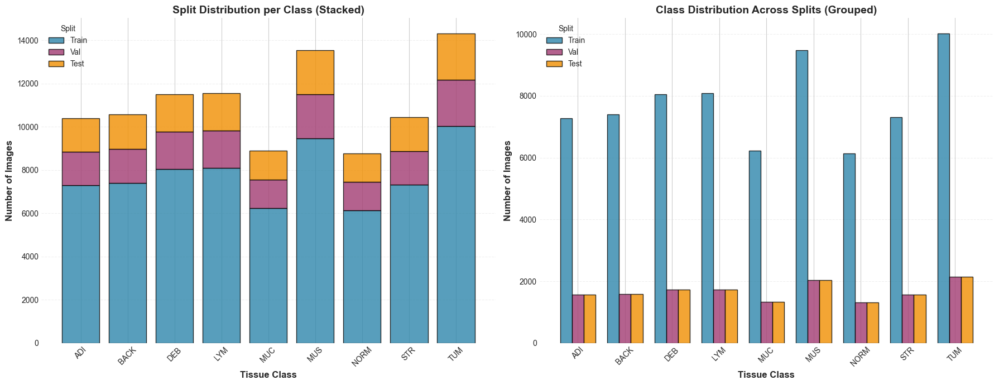

✓ Split proportions plot saved to: plots\split_proportions.png


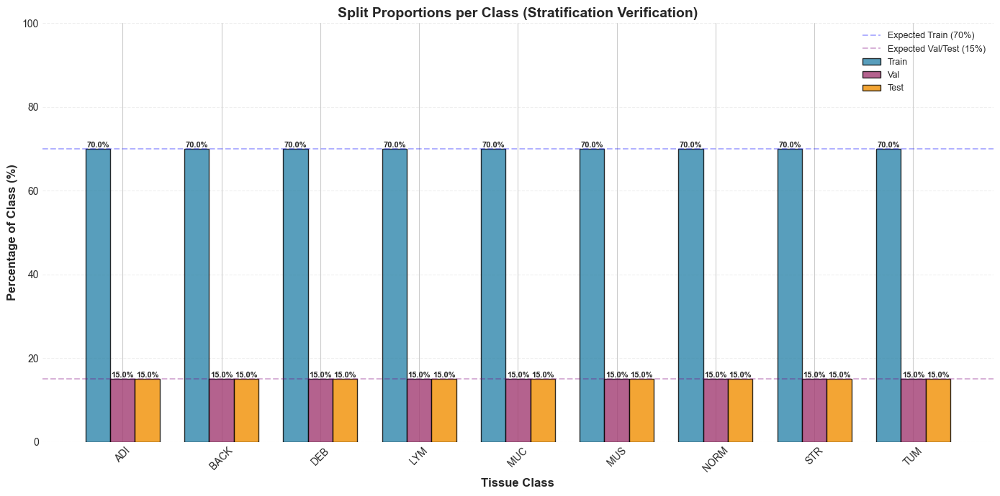


💾 Saving results...
✓ Metadata with splits saved to: dataset_metadata_with_splits.csv
✓ Saved train split to: splits\train.csv (70,000 samples)
✓ Saved val split to: splits\val.csv (15,000 samples)
✓ Saved test split to: splits\test.csv (15,000 samples)
✓ Split summary saved to: split_summary.txt

✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅
STEP 1.7 COMPLETE!
✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅

📝 What's been accomplished:
  ✓ Created stratified train/val/test splits
  ✓ Verified stratification across all classes
  ✓ Generated distribution visualizations
  ✓ Saved updated metadata with split assignments
  ✓ Exported individual split files

📊 Split Summary:
  Train: 70,000 samples (70.0%)
  Val:   15,000 samples (15.0%)
  Test:  15,000 samples (15.0%)

🚀 Next steps:
  1. Review split_summary.txt
  2. Check visualization plots in plots/
  3. Proceed to Step 1.9: Visualize Sample Images

💡 How to use the splits:
  import pandas as pd
  df = pd.read_csv('dataset_metadata_with_splits.csv

In [9]:



# Inline configuration
class ClassificationConfig:
    CLASS_NAMES = ['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']
    LABEL_TO_IDX = {name: idx for idx, name in enumerate(CLASS_NAMES)}
    IDX_TO_LABEL = {idx: name for name, idx in LABEL_TO_IDX.items()}
    NUM_CLASSES = len(CLASS_NAMES)

try:
    from sklearn.model_selection import train_test_split
    SKLEARN_AVAILABLE = True
except ImportError:
    SKLEARN_AVAILABLE = False
    print("ERROR: scikit-learn is required for this step!")
    print("Install with: pip install scikit-learn")


# ═══════════════════════════════════════════════════════════
# 1. STRATIFIED SPLIT FUNCTIONS
# ═══════════════════════════════════════════════════════════

def create_stratified_split(df: pd.DataFrame,
                           train_size: float = 0.70,
                           val_size: float = 0.15,
                           test_size: float = 0.15,
                           random_state: int = 42,
                           label_column: str = 'class_id') -> pd.DataFrame:

    if not SKLEARN_AVAILABLE:
        raise RuntimeError("scikit-learn is required for stratified splitting")

    # Validate split sizes
    total = train_size + val_size + test_size
    assert abs(total - 1.0) < 1e-6, f"Split sizes must sum to 1.0, got {total}"

    print("\n" + "🔀" * 40)
    print("CREATING STRATIFIED SPLITS")
    print("🔀" * 40)

    print(f"\nSplit Configuration:")
    print(f"  Train:      {train_size*100:.1f}% ({int(len(df)*train_size):,} images)")
    print(f"  Validation: {val_size*100:.1f}% ({int(len(df)*val_size):,} images)")
    print(f"  Test:       {test_size*100:.1f}% ({int(len(df)*test_size):,} images)")
    print(f"  Random Seed: {random_state}")

    # Make a copy to avoid modifying original
    df_split = df.copy()

    # Get labels for stratification
    labels = df_split[label_column].values
    indices = np.arange(len(df_split))

    # First split: separate train from (val + test)
    print("\n🔄 Performing first split (train vs. temp)...")
    train_idx, temp_idx = train_test_split(
        indices,
        train_size=train_size,
        stratify=labels,
        random_state=random_state
    )

    # Second split: separate val from test
    print("🔄 Performing second split (val vs. test)...")
    val_ratio = val_size / (val_size + test_size)
    val_idx, test_idx = train_test_split(
        temp_idx,
        train_size=val_ratio,
        stratify=labels[temp_idx],
        random_state=random_state
    )

    # Assign splits to DataFrame
    df_split['split'] = None  # Initialize
    df_split.loc[train_idx, 'split'] = 'train'
    df_split.loc[val_idx, 'split'] = 'val'
    df_split.loc[test_idx, 'split'] = 'test'

    # Verify no missing assignments
    assert df_split['split'].notna().all(), "Some samples were not assigned to any split!"

    print("\n✅ Split assignment complete!")
    print(f"  Train samples: {len(train_idx):,}")
    print(f"  Val samples:   {len(val_idx):,}")
    print(f"  Test samples:  {len(test_idx):,}")

    return df_split


def verify_stratification(df: pd.DataFrame,
                         label_column: str = 'class_id',
                         split_column: str = 'split',
                         tolerance: float = 0.02) -> bool:

    print("\n" + "🔍" * 40)
    print("VERIFYING STRATIFICATION")
    print("🔍" * 40)

    splits = df[split_column].unique()
    classes = sorted(df[label_column].unique())

    all_valid = True
    issues = []

    print(f"\nChecking class distribution across splits (tolerance: {tolerance*100:.1f}%)...\n")

    for class_id in classes:
        class_name = ClassificationConfig.IDX_TO_LABEL[class_id]
        class_df = df[df[label_column] == class_id]

        # Calculate proportion in each split
        proportions = {}
        for split in ['train', 'val', 'test']:
            split_count = len(class_df[class_df[split_column] == split])
            proportions[split] = split_count / len(class_df) if len(class_df) > 0 else 0

        # Check if proportions match expected ratios
        expected_train = 0.70
        expected_val = 0.15
        expected_test = 0.15

        train_diff = abs(proportions['train'] - expected_train)
        val_diff = abs(proportions['val'] - expected_val)
        test_diff = abs(proportions['test'] - expected_test)

        max_diff = max(train_diff, val_diff, test_diff)

        status = "✓" if max_diff <= tolerance else "✗"

        print(f"{status} {class_name:6s}: Train={proportions['train']*100:5.2f}% "
              f"Val={proportions['val']*100:5.2f}% "
              f"Test={proportions['test']*100:5.2f}% "
              f"(max diff: {max_diff*100:.2f}%)")

        if max_diff > tolerance:
            all_valid = False
            issues.append(f"Class {class_name} exceeds tolerance by {(max_diff-tolerance)*100:.2f}%")

    print("\n" + "─" * 80)

    if all_valid:
        print("✅ STRATIFICATION VALID - All classes within tolerance!")
    else:
        print("⚠️  STRATIFICATION WARNING - Some classes exceed tolerance:")
        for issue in issues:
            print(f"   • {issue}")

    print("🔍" * 40 + "\n")

    return all_valid


def analyze_split_distribution(df: pd.DataFrame,
                               label_column: str = 'class_id',
                               split_column: str = 'split') -> Dict:

    stats = {
        'total_samples': len(df),
        'splits': {},
        'class_distribution': {}
    }

    print("\n" + "=" * 80)
    print("SPLIT DISTRIBUTION ANALYSIS")
    print("=" * 80)

    # Overall split counts
    print("\n📊 Overall Split Distribution:")
    print(f"{'Split':<12} {'Count':<10} {'Percentage':<12}")
    print("─" * 40)

    for split in ['train', 'val', 'test']:
        split_df = df[df[split_column] == split]
        count = len(split_df)
        percentage = (count / len(df)) * 100

        stats['splits'][split] = {
            'count': count,
            'percentage': percentage
        }

        print(f"{split.capitalize():<12} {count:<10,} {percentage:<11.2f}%")

    # Per-class distribution across splits
    print("\n📈 Per-Class Distribution Across Splits:")
    print(f"{'Class':<8} {'Total':<8} {'Train':<12} {'Val':<12} {'Test':<12}")
    print("─" * 80)

    for class_id in sorted(df[label_column].unique()):
        class_name = ClassificationConfig.IDX_TO_LABEL[class_id]
        class_df = df[df[label_column] == class_id]

        total = len(class_df)
        train_count = len(class_df[class_df[split_column] == 'train'])
        val_count = len(class_df[class_df[split_column] == 'val'])
        test_count = len(class_df[class_df[split_column] == 'test'])

        stats['class_distribution'][class_name] = {
            'total': total,
            'train': train_count,
            'val': val_count,
            'test': test_count
        }

        print(f"{class_name:<8} {total:<8,} "
              f"{train_count:<6,}({train_count/total*100:4.1f}%) "
              f"{val_count:<6,}({val_count/total*100:4.1f}%) "
              f"{test_count:<6,}({test_count/total*100:4.1f}%)")

    print("=" * 80 + "\n")

    return stats


# ═══════════════════════════════════════════════════════════
# 2. VISUALIZATION FUNCTIONS
# ═══════════════════════════════════════════════════════════

def plot_split_distribution(df: pd.DataFrame,
                           label_column: str = 'class_id',
                           split_column: str = 'split',
                           save_path: Optional[str] = None):

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 7))

    # Prepare data
    class_names = [ClassificationConfig.IDX_TO_LABEL[i]
                   for i in sorted(df[label_column].unique())]
    splits = ['train', 'val', 'test']
    colors = {'train': '#2E86AB', 'val': '#A23B72', 'test': '#F18F01'}

    # Plot 1: Stacked bar chart (split distribution per class)
    split_counts = {split: [] for split in splits}

    for class_id in sorted(df[label_column].unique()):
        class_df = df[df[label_column] == class_id]
        for split in splits:
            count = len(class_df[class_df[split_column] == split])
            split_counts[split].append(count)

    bottom = np.zeros(len(class_names))
    for split in splits:
        ax1.bar(class_names, split_counts[split],
               label=split.capitalize(),
               color=colors[split],
               bottom=bottom,
               alpha=0.8,
               edgecolor='black',
               linewidth=1)
        bottom += np.array(split_counts[split])

    ax1.set_xlabel('Tissue Class', fontsize=12, fontweight='bold')
    ax1.set_ylabel('Number of Images', fontsize=12, fontweight='bold')
    ax1.set_title('Split Distribution per Class (Stacked)', fontsize=14, fontweight='bold')
    ax1.legend(title='Split', fontsize=10)
    ax1.grid(axis='y', alpha=0.3, linestyle='--')
    ax1.tick_params(axis='x', rotation=45)

    # Plot 2: Grouped bar chart (class distribution in each split)
    x = np.arange(len(class_names))
    width = 0.25

    for i, split in enumerate(splits):
        counts = []
        for class_id in sorted(df[label_column].unique()):
            class_df = df[df[label_column] == class_id]
            count = len(class_df[class_df[split_column] == split])
            counts.append(count)

        offset = width * (i - 1)
        ax2.bar(x + offset, counts, width,
               label=split.capitalize(),
               color=colors[split],
               alpha=0.8,
               edgecolor='black',
               linewidth=1)

    ax2.set_xlabel('Tissue Class', fontsize=12, fontweight='bold')
    ax2.set_ylabel('Number of Images', fontsize=12, fontweight='bold')
    ax2.set_title('Class Distribution Across Splits (Grouped)', fontsize=14, fontweight='bold')
    ax2.set_xticks(x)
    ax2.set_xticklabels(class_names, rotation=45)
    ax2.legend(title='Split', fontsize=10)
    ax2.grid(axis='y', alpha=0.3, linestyle='--')

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"✓ Split distribution plot saved to: {save_path}")

    plt.show()


def plot_split_proportions(df: pd.DataFrame,
                          label_column: str = 'class_id',
                          split_column: str = 'split',
                          save_path: Optional[str] = None):

    fig, ax = plt.subplots(figsize=(14, 7))

    class_names = [ClassificationConfig.IDX_TO_LABEL[i]
                   for i in sorted(df[label_column].unique())]
    splits = ['train', 'val', 'test']
    colors = {'train': '#2E86AB', 'val': '#A23B72', 'test': '#F18F01'}

    # Calculate proportions
    x = np.arange(len(class_names))
    width = 0.25

    for i, split in enumerate(splits):
        proportions = []
        for class_id in sorted(df[label_column].unique()):
            class_df = df[df[label_column] == class_id]
            split_count = len(class_df[class_df[split_column] == split])
            proportion = (split_count / len(class_df)) * 100 if len(class_df) > 0 else 0
            proportions.append(proportion)

        offset = width * (i - 1)
        bars = ax.bar(x + offset, proportions, width,
                     label=split.capitalize(),
                     color=colors[split],
                     alpha=0.8,
                     edgecolor='black',
                     linewidth=1)

        # Add value labels on bars
        for bar, prop in zip(bars, proportions):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                   f'{prop:.1f}%',
                   ha='center', va='bottom', fontsize=8, fontweight='bold')

    # Add reference lines for expected proportions
    ax.axhline(y=70, color='blue', linestyle='--', alpha=0.3, label='Expected Train (70%)')
    ax.axhline(y=15, color='purple', linestyle='--', alpha=0.3, label='Expected Val/Test (15%)')

    ax.set_xlabel('Tissue Class', fontsize=12, fontweight='bold')
    ax.set_ylabel('Percentage of Class (%)', fontsize=12, fontweight='bold')
    ax.set_title('Split Proportions per Class (Stratification Verification)',
                fontsize=14, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels(class_names, rotation=45)
    ax.legend(fontsize=9)
    ax.grid(axis='y', alpha=0.3, linestyle='--')
    ax.set_ylim(0, 100)

    plt.tight_layout()

    if save_path:
        plt.savefig(save_path, dpi=300, bbox_inches='tight')
        print(f"✓ Split proportions plot saved to: {save_path}")

    plt.show()


# ═══════════════════════════════════════════════════════════
# 3. UTILITY FUNCTIONS
# ═══════════════════════════════════════════════════════════

def get_split_subset(df: pd.DataFrame,
                    split: str,
                    split_column: str = 'split') -> pd.DataFrame:

    return df[df[split_column] == split].copy()


def export_split_files(df: pd.DataFrame,
                      output_dir: str = "splits",
                      split_column: str = 'split'):

    output_path = Path(output_dir)
    output_path.mkdir(exist_ok=True)

    for split in ['train', 'val', 'test']:
        split_df = get_split_subset(df, split, split_column)
        save_path = output_path / f"{split}.csv"
        split_df.to_csv(save_path, index=False)
        print(f"✓ Saved {split} split to: {save_path} ({len(split_df):,} samples)")


def create_split_summary(df: pd.DataFrame,
                        save_path: str = "split_summary.txt",
                        label_column: str = 'class_id',
                        split_column: str = 'split'):

    with open(save_path, 'w') as f:
        f.write("=" * 80 + "\n")
        f.write("TRAIN/VALIDATION/TEST SPLIT SUMMARY\n")
        f.write("=" * 80 + "\n\n")

        f.write(f"Total Samples: {len(df):,}\n\n")

        # Overall split distribution
        f.write("Overall Split Distribution:\n")
        f.write("-" * 80 + "\n")
        for split in ['train', 'val', 'test']:
            count = len(df[df[split_column] == split])
            percentage = (count / len(df)) * 100
            f.write(f"{split.capitalize():<12}: {count:>7,} samples ({percentage:>5.2f}%)\n")

        f.write("\n" + "-" * 80 + "\n\n")

        # Per-class distribution
        f.write("Per-Class Distribution:\n")
        f.write("-" * 80 + "\n")
        f.write(f"{'Class':<8} {'Total':<8} {'Train':<15} {'Val':<15} {'Test':<15}\n")
        f.write("-" * 80 + "\n")

        for class_id in sorted(df[label_column].unique()):
            class_name = ClassificationConfig.IDX_TO_LABEL[class_id]
            class_df = df[df[label_column] == class_id]

            total = len(class_df)
            train_count = len(class_df[class_df[split_column] == 'train'])
            val_count = len(class_df[class_df[split_column] == 'val'])
            test_count = len(class_df[class_df[split_column] == 'test'])

            f.write(f"{class_name:<8} {total:<8,} "
                   f"{train_count:>6,} ({train_count/total*100:>4.1f}%) "
                   f"{val_count:>6,} ({val_count/total*100:>4.1f}%) "
                   f"{test_count:>6,} ({test_count/total*100:>4.1f}%)\n")

        f.write("\n" + "=" * 80 + "\n")

    print(f"✓ Split summary saved to: {save_path}")


# ═══════════════════════════════════════════════════════════
# 4. SPLIT MANAGER CLASS
# ═══════════════════════════════════════════════════════════

class SplitManager:
    def __init__(self,
                 metadata_df: pd.DataFrame,
                 train_size: float = 0.70,
                 val_size: float = 0.15,
                 test_size: float = 0.15,
                 random_state: int = 42):

        self.df = metadata_df.copy()
        self.train_size = train_size
        self.val_size = val_size
        self.test_size = test_size
        self.random_state = random_state
        self.stats = None

    def create_splits(self) -> pd.DataFrame:
        # Create splits
        self.df = create_stratified_split(
            self.df,
            train_size=self.train_size,
            val_size=self.val_size,
            test_size=self.test_size,
            random_state=self.random_state
        )

        # Verify stratification
        verify_stratification(self.df)

        # Analyze distribution
        self.stats = analyze_split_distribution(self.df)

        return self.df

    def visualize(self, save_dir: Optional[str] = None):

        if self.df is None or 'split' not in self.df.columns:
            raise ValueError("Splits not created. Call create_splits() first.")

        # Plot distribution
        save_path1 = str(Path(save_dir) / "split_distribution.png") if save_dir else None
        plot_split_distribution(self.df, save_path=save_path1)

        # Plot proportions
        save_path2 = str(Path(save_dir) / "split_proportions.png") if save_dir else None
        plot_split_proportions(self.df, save_path=save_path2)

    def save(self,
            metadata_path: str = "nct_crc_metadata_with_splits.csv",
            export_individual: bool = True,
            split_dir: str = "splits"):

        if self.df is None or 'split' not in self.df.columns:
            raise ValueError("Splits not created. Call create_splits() first.")

        # Save complete metadata
        self.df.to_csv(metadata_path, index=False)
        print(f"✓ Metadata with splits saved to: {metadata_path}")

        # Export individual split files
        if export_individual:
            export_split_files(self.df, output_dir=split_dir)

        # Create summary
        create_split_summary(self.df, save_path="split_summary.txt")

    def get_split(self, split: str) -> pd.DataFrame:
        """Get data for a specific split."""
        return get_split_subset(self.df, split)

    def summary(self):
        """Print summary of splits."""
        if self.stats is None:
            self.stats = analyze_split_distribution(self.df)


# ═══════════════════════════════════════════════════════════
# 5. MAIN EXECUTION
# ═══════════════════════════════════════════════════════════

if __name__ == "__main__":

    # Configuration
    METADATA_PATH = "dataset_metadata.csv"
    OUTPUT_METADATA_PATH = "dataset_metadata_with_splits.csv"
    SPLIT_DIR = "splits"
    PLOT_DIR = "plots"

    # Split configuration
    TRAIN_SIZE = 0.70
    VAL_SIZE = 0.15
    TEST_SIZE = 0.15
    RANDOM_SEED = 42

    print("\n" + "🏥" * 40)
    print("COLORECTAL CANCER CLASSIFICATION - STEP 1.7")
    print("Train/Validation/Test Split")
    print("🏥" * 40)

    try:
        # Load metadata from Step 1.6
        print(f"\n📂 Loading metadata from: {METADATA_PATH}")
        df = pd.read_csv(METADATA_PATH)
        print(f"✓ Loaded {len(df):,} samples")

        # Initialize split manager
        manager = SplitManager(
            metadata_df=df,
            train_size=TRAIN_SIZE,
            val_size=VAL_SIZE,
            test_size=TEST_SIZE,
            random_state=RANDOM_SEED
        )

        # Create splits
        df_with_splits = manager.create_splits()

        # Visualize
        print("\n📊 Creating visualizations...")
        Path(PLOT_DIR).mkdir(exist_ok=True)
        manager.visualize(save_dir=PLOT_DIR)

        # Save results
        print("\n💾 Saving results...")
        manager.save(
            metadata_path=OUTPUT_METADATA_PATH,
            export_individual=True,
            split_dir=SPLIT_DIR
        )

        print("\n" + "✅" * 40)
        print("STEP 1.7 COMPLETE!")
        print("✅" * 40)

        print("\n📝 What's been accomplished:")
        print(f"  ✓ Created stratified train/val/test splits")
        print(f"  ✓ Verified stratification across all classes")
        print(f"  ✓ Generated distribution visualizations")
        print(f"  ✓ Saved updated metadata with split assignments")
        print(f"  ✓ Exported individual split files")

        print("\n📊 Split Summary:")
        train_df = manager.get_split('train')
        val_df = manager.get_split('val')
        test_df = manager.get_split('test')
        print(f"  Train: {len(train_df):,} samples ({len(train_df)/len(df)*100:.1f}%)")
        print(f"  Val:   {len(val_df):,} samples ({len(val_df)/len(df)*100:.1f}%)")
        print(f"  Test:  {len(test_df):,} samples ({len(test_df)/len(df)*100:.1f}%)")

        print("\n🚀 Next steps:")
        print("  1. Review split_summary.txt")
        print("  2. Check visualization plots in plots/")
        print("  3. Proceed to Step 1.9: Visualize Sample Images")

        print("\n💡 How to use the splits:")
        print("  import pandas as pd")
        print(f"  df = pd.read_csv('{OUTPUT_METADATA_PATH}')")
        print("  ")
        print("  # Get training data")
        print("  train_df = df[df['split'] == 'train']")
        print("  train_paths = train_df['image_path'].values")
        print("  train_labels = train_df['class_id'].values")
        print("  ")
        print("  # Or load individual split files")
        print("  train_df = pd.read_csv('splits/train.csv')")

    except FileNotFoundError as e:
        print(f"\n❌ Error: {str(e)}")
        print("\nMake sure you've completed Step 1.6 first!")
        print("Expected file: nct_crc_metadata.csv")
        raise

    except Exception as e:
        print(f"\n❌ Error occurred: {str(e)}")
        print("\nPlease check:")
        print("  1. Metadata file exists and is valid")
        print("  2. scikit-learn is installed")
        print("  3. Sufficient disk space for output files")
        raise


1.7:

In [ ]:

from tqdm import tqdm
# Set random seed for reproducibility
random.seed(42)
np.random.seed(42)

# Set style
sns.set_style("white")

# ============================================================================
# CONFIGURATION
# ============================================================================


METADATA_CSV = "data/dataset_metadata.csv"
CLASS_MAPPING_CSV = "data/class_mapping.csv"

# Output files
OUTPUT_SAMPLES_VISUALIZATION = "sample_images_per_class.png"
OUTPUT_IMAGE_PROPERTIES = "image_properties_analysis.png"
OUTPUT_PROPERTIES_REPORT = "image_properties_report.txt"

# Visualization parameters
NUM_SAMPLES_PER_CLASS = 5  # Number of sample images to show per class
NUM_IMAGES_TO_ANALYZE = 100  # Number of images to analyze for properties

# ============================================================================
# STEP 1: LOAD METADATA
# ============================================================================

def load_metadata(metadata_csv, class_mapping_csv):
    """
    Load metadata and class mapping from CSV files.

    Args:
        metadata_csv: Path to metadata CSV file
        class_mapping_csv: Path to class mapping CSV file

    Returns:
        metadata_df: DataFrame with image metadata
        class_mapping_df: DataFrame with class mapping
        class_names: List of class names in order
    """
    print("=" * 70)
    print("LOADING METADATA")
    print("=" * 70)

    # Load metadata
    if not os.path.exists(metadata_csv):
        raise FileNotFoundError(f"Metadata file not found: {metadata_csv}")

    metadata_df = pd.read_csv(metadata_csv)
    print(f"✓ Loaded metadata: {metadata_df.shape[0]:,} images")

    # Load class mapping
    if not os.path.exists(class_mapping_csv):
        raise FileNotFoundError(f"Class mapping file not found: {class_mapping_csv}")

    class_mapping_df = pd.read_csv(class_mapping_csv)
    class_names = class_mapping_df.sort_values('class_idx')['class_name'].tolist()
    print(f"✓ Loaded class mapping: {len(class_names)} classes")
    print(f"  Classes: {', '.join(class_names)}")
    print("=" * 70 + "\n")

    return metadata_df, class_mapping_df, class_names


# ============================================================================
# STEP 2: VISUALIZE SAMPLE IMAGES PER CLASS
# ============================================================================

def visualize_samples_per_class(metadata_df, class_names, num_samples, output_path):
    """
    Display and save sample images from each class.

    Args:
        metadata_df: DataFrame with image metadata
        class_names: List of class names
        num_samples: Number of samples to show per class
        output_path: Path to save the visualization
    """
    print("=" * 70)
    print("VISUALIZING SAMPLE IMAGES")
    print("=" * 70)
    print(f"Samples per class: {num_samples}")
    print(f"Total classes: {len(class_names)}\n")

    num_classes = len(class_names)

    # Create figure
    fig, axes = plt.subplots(num_classes, num_samples, figsize=(num_samples * 3, num_classes * 3))
    fig.suptitle('Sample Histopathology Images from Each Tissue Class',
                 fontsize=20, fontweight='bold', y=0.998)

    for class_idx, class_name in enumerate(class_names):
        print(f"Processing {class_name}...", end=" ")

        # Get samples for this class
        class_samples = metadata_df[metadata_df['class_name'] == class_name]

        if len(class_samples) == 0:
            print(f"⚠️  No images found!")
            continue

        # Sample random images
        sample_size = min(num_samples, len(class_samples))
        sampled_images = class_samples.sample(n=sample_size, random_state=42)

        # Display each sample
        for sample_idx in range(num_samples):
            # Get axis
            if num_classes == 1:
                ax = axes[sample_idx]
            else:
                ax = axes[class_idx, sample_idx]

            if sample_idx < len(sampled_images):
                # Load and display image
                img_path = sampled_images.iloc[sample_idx]['image_path']

                try:
                    img = Image.open(img_path).convert('RGB')
                    img_array = np.array(img)

                    ax.imshow(img_array)
                    ax.axis('off')

                    # Add border to each image
                    for spine in ax.spines.values():
                        spine.set_edgecolor('gray')
                        spine.set_linewidth(1)
                        spine.set_visible(True)

                except Exception as e:
                    print(f"\n⚠️  Error loading {img_path}: {e}")
                    ax.text(0.5, 0.5, 'Error\nLoading\nImage',
                           ha='center', va='center', fontsize=10)
                    ax.axis('off')
            else:
                # No image available
                ax.axis('off')

            # Add class name label to first image of each row
            if sample_idx == 0:
                # Class description mapping
                class_descriptions = {
                    'ADI': 'Adipose\n(Fat Tissue)',
                    'BACK': 'Background',
                    'DEB': 'Debris',
                    'LYM': 'Lymphocytes',
                    'MUC': 'Mucus',
                    'MUS': 'Smooth\nMuscle',
                    'NORM': 'Normal\nMucosa',
                    'STR': 'Cancer\nStroma',
                    'TUM': 'Tumor\n(Malignant)'
                }

                label_text = f"{class_name}\n{class_descriptions.get(class_name, '')}"
                ax.set_ylabel(label_text, fontsize=13, fontweight='bold',
                             rotation=0, labelpad=60, va='center', ha='right')

        print(f"✓ Displayed {sample_size} samples")

    plt.tight_layout()
    plt.subplots_adjust(top=0.97)
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    print(f"\n✓ Visualization saved to: {output_path}")
    print("=" * 70 + "\n")

    return fig


# ============================================================================
# STEP 3: ANALYZE IMAGE PROPERTIES
# ============================================================================

def analyze_image_properties(metadata_df, num_samples, output_plot, output_report):
    """
    Analyze basic properties of images (dimensions, color distribution, etc.)

    Args:
        metadata_df: DataFrame with image metadata
        num_samples: Number of images to analyze
        output_plot: Path to save the analysis plot
        output_report: Path to save the text report
    """
    print("=" * 70)
    print("ANALYZING IMAGE PROPERTIES")
    print("=" * 70)
    print(f"Analyzing {num_samples} random images...\n")

    # Sample random images
    sample_df = metadata_df.sample(n=min(num_samples, len(metadata_df)), random_state=42)

    # Initialize lists for properties
    widths = []
    heights = []
    channels = []
    mean_intensities = []
    std_intensities = []
    mean_r = []
    mean_g = []
    mean_b = []
    file_sizes = []

    # Process images
    for idx, row in tqdm(sample_df.iterrows(), total=len(sample_df), desc="Processing"):
        img_path = row['image_path']

        try:
            # Load image
            img = Image.open(img_path)
            img_array = np.array(img)

            # Get dimensions
            if len(img_array.shape) == 3:
                height, width, channel = img_array.shape
                channels.append(channel)
            else:
                height, width = img_array.shape
                channel = 1
                channels.append(channel)

            widths.append(width)
            heights.append(height)

            # Get intensity statistics
            mean_intensities.append(img_array.mean())
            std_intensities.append(img_array.std())

            # Get RGB channel means (if color image)
            if len(img_array.shape) == 3 and img_array.shape[2] == 3:
                mean_r.append(img_array[:, :, 0].mean())
                mean_g.append(img_array[:, :, 1].mean())
                mean_b.append(img_array[:, :, 2].mean())

            # Get file size
            file_sizes.append(os.path.getsize(img_path) / 1024)  # KB

        except Exception as e:
            print(f"\n⚠️  Error processing {img_path}: {e}")
            continue

    # Calculate statistics
    stats = {
        'width': {'min': min(widths), 'max': max(widths), 'mean': np.mean(widths), 'std': np.std(widths)},
        'height': {'min': min(heights), 'max': max(heights), 'mean': np.mean(heights), 'std': np.std(heights)},
        'intensity': {'min': min(mean_intensities), 'max': max(mean_intensities),
                     'mean': np.mean(mean_intensities), 'std': np.std(mean_intensities)},
        'file_size': {'min': min(file_sizes), 'max': max(file_sizes),
                     'mean': np.mean(file_sizes), 'std': np.std(file_sizes)},
    }

    # Check consistency
    width_consistent = len(set(widths)) == 1
    height_consistent = len(set(heights)) == 1
    channel_consistent = len(set(channels)) == 1

    # Create visualization
    fig, axes = plt.subplots(2, 3, figsize=(18, 10))
    fig.suptitle('Image Properties Analysis', fontsize=18, fontweight='bold')

    # Plot 1: Dimension distribution
    ax = axes[0, 0]
    if width_consistent and height_consistent:
        ax.text(0.5, 0.5, f'All images:\n{widths[0]} × {heights[0]} pixels',
               ha='center', va='center', fontsize=16, fontweight='bold',
               bbox=dict(boxstyle='round', facecolor='lightgreen', alpha=0.7))
        ax.set_title('Image Dimensions', fontweight='bold', fontsize=14)
    else:
        ax.hist2d(widths, heights, bins=20, cmap='YlOrRd')
        ax.set_xlabel('Width (pixels)', fontweight='bold')
        ax.set_ylabel('Height (pixels)', fontweight='bold')
        ax.set_title('Dimension Distribution', fontweight='bold', fontsize=14)
    ax.grid(True, alpha=0.3)

    # Plot 2: Mean intensity distribution
    ax = axes[0, 1]
    ax.hist(mean_intensities, bins=30, color='steelblue', edgecolor='black', alpha=0.7)
    ax.axvline(np.mean(mean_intensities), color='red', linestyle='--',
              linewidth=2, label=f'Mean: {np.mean(mean_intensities):.1f}')
    ax.set_xlabel('Mean Intensity', fontweight='bold')
    ax.set_ylabel('Frequency', fontweight='bold')
    ax.set_title('Intensity Distribution', fontweight='bold', fontsize=14)
    ax.legend()
    ax.grid(True, alpha=0.3)

    # Plot 3: File size distribution
    ax = axes[0, 2]
    ax.hist(file_sizes, bins=30, color='coral', edgecolor='black', alpha=0.7)
    ax.set_xlabel('File Size (KB)', fontweight='bold')
    ax.set_ylabel('Frequency', fontweight='bold')
    ax.set_title('File Size Distribution', fontweight='bold', fontsize=14)
    ax.grid(True, alpha=0.3)

    # Plot 4: RGB channel means
    ax = axes[1, 0]
    if mean_r:
        colors = ['red', 'green', 'blue']
        channel_means = [np.mean(mean_r), np.mean(mean_g), np.mean(mean_b)]
        bars = ax.bar(['R', 'G', 'B'], channel_means, color=colors, alpha=0.6,
                     edgecolor='black', linewidth=2)
        ax.set_ylabel('Mean Intensity', fontweight='bold')
        ax.set_title('RGB Channel Means', fontweight='bold', fontsize=14)
        ax.set_ylim([0, 255])
        ax.grid(True, alpha=0.3, axis='y')

        # Add value labels
        for bar, val in zip(bars, channel_means):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height,
                   f'{val:.1f}', ha='center', va='bottom', fontweight='bold')

    # Plot 5: Intensity standard deviation
    ax = axes[1, 1]
    ax.hist(std_intensities, bins=30, color='mediumpurple', edgecolor='black', alpha=0.7)
    ax.set_xlabel('Standard Deviation', fontweight='bold')
    ax.set_ylabel('Frequency', fontweight='bold')
    ax.set_title('Intensity Std Dev Distribution', fontweight='bold', fontsize=14)
    ax.grid(True, alpha=0.3)

    # Plot 6: Statistics summary
    ax = axes[1, 2]
    ax.axis('off')

    summary_text = f"""
    SUMMARY STATISTICS
    {'='*30}

    Dimensions:
      Width:  {stats['width']['min']} - {stats['width']['max']} px
      Height: {stats['height']['min']} - {stats['height']['max']} px
      Consistent: {'✓ Yes' if width_consistent and height_consistent else '✗ No'}

    Intensity:
      Range: {stats['intensity']['min']:.1f} - {stats['intensity']['max']:.1f}
      Mean:  {stats['intensity']['mean']:.1f} ± {stats['intensity']['std']:.1f}

    File Size:
      Range: {stats['file_size']['min']:.1f} - {stats['file_size']['max']:.1f} KB
      Mean:  {stats['file_size']['mean']:.1f} ± {stats['file_size']['std']:.1f} KB

    Channels: {channels[0] if channel_consistent else 'Varies'}
    """

    ax.text(0.1, 0.9, summary_text, fontsize=10, verticalalignment='top',
           family='monospace', bbox=dict(boxstyle='round', facecolor='wheat', alpha=0.5))

    plt.tight_layout()
    plt.savefig(output_plot, dpi=300, bbox_inches='tight')
    print(f"✓ Properties visualization saved to: {output_plot}")

    # Save detailed report
    with open(output_report, 'w',encoding='utf-8') as f:
        f.write("=" * 70 + "\n")
        f.write("IMAGE PROPERTIES ANALYSIS REPORT\n")
        f.write("=" * 70 + "\n\n")
        f.write(f"Analysis based on {len(sample_df)} random samples\n\n")

        f.write("DIMENSIONS:\n")
        f.write("-" * 70 + "\n")
        f.write(f"  Width:  {stats['width']['min']} - {stats['width']['max']} pixels\n")
        f.write(f"          Mean: {stats['width']['mean']:.2f} ± {stats['width']['std']:.2f}\n")
        f.write(f"  Height: {stats['height']['min']} - {stats['height']['max']} pixels\n")
        f.write(f"          Mean: {stats['height']['mean']:.2f} ± {stats['height']['std']:.2f}\n")
        f.write(f"  Consistent dimensions: {'YES' if width_consistent and height_consistent else 'NO'}\n")
        if width_consistent and height_consistent:
            f.write(f"  -> All images are {widths[0]} × {heights[0]} pixels\n")
        f.write("\n")

        f.write("INTENSITY:\n")
        f.write("-" * 70 + "\n")
        f.write(f"  Range: {stats['intensity']['min']:.2f} - {stats['intensity']['max']:.2f}\n")
        f.write(f"  Mean:  {stats['intensity']['mean']:.2f} ± {stats['intensity']['std']:.2f}\n")
        f.write("\n")

        if mean_r:
            f.write("RGB CHANNELS:\n")
            f.write("-" * 70 + "\n")
            f.write(f"  Red:   {np.mean(mean_r):.2f} ± {np.std(mean_r):.2f}\n")
            f.write(f"  Green: {np.mean(mean_g):.2f} ± {np.std(mean_g):.2f}\n")
            f.write(f"  Blue:  {np.mean(mean_b):.2f} ± {np.std(mean_b):.2f}\n")
            f.write("\n")

        f.write("FILE PROPERTIES:\n")
        f.write("-" * 70 + "\n")
        f.write(f"  Size range: {stats['file_size']['min']:.2f} - {stats['file_size']['max']:.2f} KB\n")
        f.write(f"  Mean size:  {stats['file_size']['mean']:.2f} ± {stats['file_size']['std']:.2f} KB\n")
        f.write(f"  Channels:   {channels[0] if channel_consistent else 'Varies'}\n")
        f.write("\n")

        f.write("RECOMMENDATIONS:\n")
        f.write("-" * 70 + "\n")
        if width_consistent and height_consistent:
            f.write("  ✓ Images have consistent dimensions - no resizing needed\n")
        else:
            f.write("  -> Images have varying dimensions - resizing required\n")
            f.write(f"    Recommended size: 224×224 pixels (standard for ViT)\n")

        if channel_consistent:
            f.write(f"  ✓ All images have {channels[0]} channels\n")
        else:
            f.write("  -> Images have varying number of channels - conversion needed\n")

        f.write("\n" + "=" * 70 + "\n")

    print(f"✓ Detailed report saved to: {output_report}")
    print("=" * 70 + "\n")

    return stats


# ============================================================================
# MAIN EXECUTION
# ============================================================================

def main():
    """
    Main execution function for Task 1.9
    """
    print("\n" + "=" * 70)
    print("TASK 1.9: VISUALIZE SAMPLE IMAGES PER CLASS")
    print("=" * 70 + "\n")

    # Step 1: Load metadata
    print("Step 1: Loading metadata...")
    metadata_df, class_mapping_df, class_names = load_metadata(
        METADATA_CSV, CLASS_MAPPING_CSV
    )

    # Step 2: Visualize sample images per class
    print("Step 2: Visualizing sample images per class...")
    visualize_samples_per_class(
        metadata_df, class_names, NUM_SAMPLES_PER_CLASS,
        OUTPUT_SAMPLES_VISUALIZATION
    )

    # Step 3: Analyze image properties
    print("Step 3: Analyzing image properties...")
    stats = analyze_image_properties(
        metadata_df, NUM_IMAGES_TO_ANALYZE,
        OUTPUT_IMAGE_PROPERTIES, OUTPUT_PROPERTIES_REPORT
    )

    # Final success message
    print("=" * 70)
    print("✅ TASK 1.9 COMPLETED SUCCESSFULLY!")
    print("=" * 70)
    print("\nGenerated files:")
    print(f"  1. {OUTPUT_SAMPLES_VISUALIZATION} - Sample images from each class")
    print(f"  2. {OUTPUT_IMAGE_PROPERTIES} - Image properties analysis")
    print(f"  3. {OUTPUT_PROPERTIES_REPORT} - Detailed properties report")
    print("\nYou can now review the visualizations to understand the dataset better.")
    print("=" * 70 + "\n")

    # Integration notes
    print("=" * 70)
    print("INTEGRATION WITH OTHER TASKS")
    print("=" * 70)
    print("\n📊 WHAT YOU LEARNED:")
    print("  -> Visual characteristics of each tissue class")
    print("  -> Image dimensions and consistency")
    print("  -> Color distribution across classes")
    print("  -> Data quality and potential issues")
    print()
    print("📤 FILES TO SHARE WITH TEAM:")
    print(f"  -> {OUTPUT_SAMPLES_VISUALIZATION}")
    print(f"     Useful for: Presentations, team understanding")
    print(f"  -> {OUTPUT_PROPERTIES_REPORT}")
    print(f"     Important for: Task 1.10 (augmentation decisions)")
    print()
    print("📋 NEXT STEPS:")
    print(f"  1. Run YOUR Task 1.12 (validate data loading pipeline)")
    print(f"  2. Share visualizations with team for discussion")
    print(f"  3. Note any data quality issues for preprocessing")
    print("=" * 70 + "\n")

main()


TASK 1.9: VISUALIZE SAMPLE IMAGES PER CLASS

Step 1: Loading metadata...
LOADING METADATA


FileNotFoundError: Metadata file not found: dataset_metadata.csv

1.8:

Testing with: D:\NCT-CRC-HE-100K\TUM\TUM-AAALPREY.tif
✓ Stain normalizer fitted with reference image


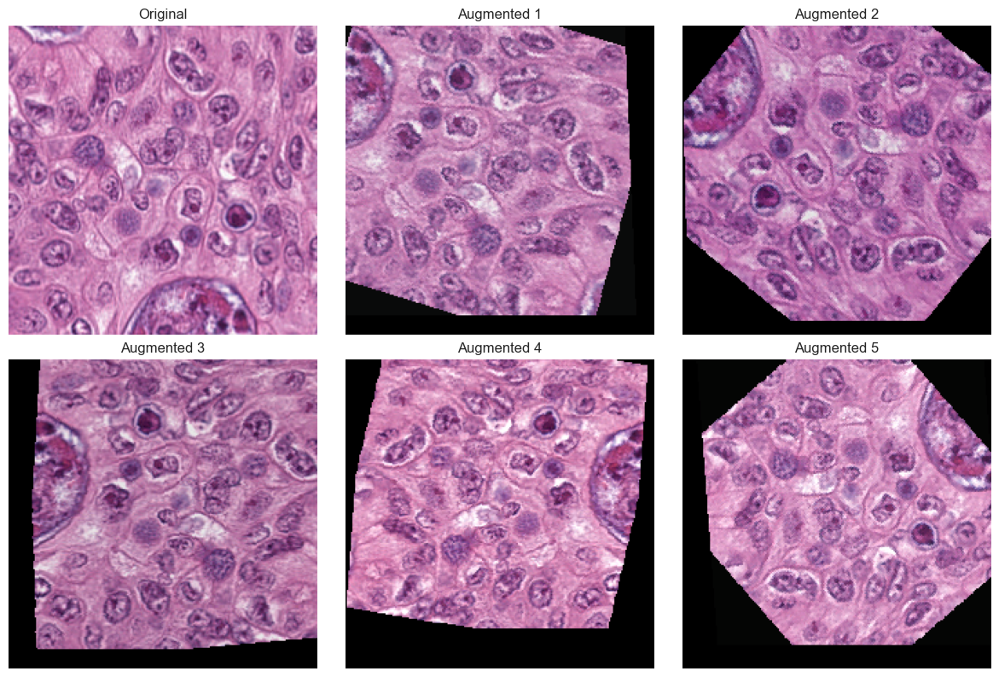

✓ Transform test complete! Check 'transform_test.png'

✓ Step 1.10 Complete
→ Next: Use setup_transforms_for_training() in Step 1.11


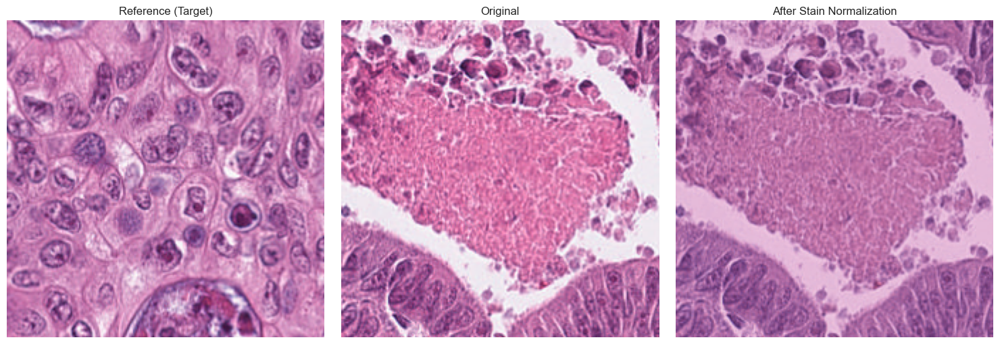

In [2]:
from torchvision import transforms

# ═══════════════════════════════════════════════════════════
# STEP 1.10: IMAGE TRANSFORMS 
# ═══════════════════════════════════════════════════════════

# Dataset location
DATASET_PATH = r"D:\NCT-CRC-HE-100K"

# ═══════════════════════════════════════════════════════════
#  STAIN NORMALIZATION 
# ═══════════════════════════════════════════════════════════

class SimpleStainNormalizer:
    """
    Simplified stain normalization without spams dependency
    Uses histogram matching and color transfer
    """
    
    def __init__(self, target_image_path=None):
        self.target_stats = None
        if target_image_path:
            self.fit(Image.open(target_image_path))
    
    def fit(self, target_image):
        """Compute target statistics from reference image"""
        if isinstance(target_image, Image.Image):
            target_image = np.array(target_image)
        
        # Convert to LAB color space
        target_lab = cv2.cvtColor(target_image, cv2.COLOR_RGB2LAB).astype(np.float32)
        
        # Store mean and std for each channel
        self.target_stats = {
            'mean': target_lab.mean(axis=(0, 1)),
            'std': target_lab.std(axis=(0, 1))
        }
    
    def __call__(self, image):
        """Apply normalization"""
        if self.target_stats is None:
            return image
        
        # Convert PIL to numpy
        if isinstance(image, Image.Image):
            img_np = np.array(image)
        else:
            img_np = image
        
        try:
            # Convert to LAB
            img_lab = cv2.cvtColor(img_np, cv2.COLOR_RGB2LAB).astype(np.float32)
            
            # Get source statistics
            src_mean = img_lab.mean(axis=(0, 1))
            src_std = img_lab.std(axis=(0, 1))
            
            # Normalize
            img_lab = (img_lab - src_mean) / (src_std + 1e-6)
            
            # Apply target statistics
            img_lab = img_lab * self.target_stats['std'] + self.target_stats['mean']
            
            # Convert back to RGB
            img_lab = np.clip(img_lab, 0, 255).astype(np.uint8)
            img_rgb = cv2.cvtColor(img_lab, cv2.COLOR_LAB2RGB)
            
            return Image.fromarray(img_rgb)
        
        except Exception as e:
            print(f"Warning: Normalization failed - {e}")
            return image


class ReinhardNormalizer:
    """
    Reinhard color normalization (simpler, no spams needed)
    Good baseline for H&E normalization
    """
    
    def __init__(self, target_image_path=None):
        self.target_means = None
        self.target_stds = None
        
        if target_image_path:
            self.fit(Image.open(target_image_path))
    
    def fit(self, target_image):
        """Fit normalizer with target image"""
        if isinstance(target_image, Image.Image):
            target_image = np.array(target_image)
        
        # Convert to LAB
        target_lab = cv2.cvtColor(target_image, cv2.COLOR_RGB2LAB)
        
        # Calculate statistics
        self.target_means = target_lab.mean(axis=(0, 1))
        self.target_stds = target_lab.std(axis=(0, 1))
    
    def __call__(self, image):
        """Apply normalization"""
        if self.target_means is None:
            return image
        
        if isinstance(image, Image.Image):
            img_np = np.array(image)
        else:
            img_np = image
        
        try:
            # Convert to LAB
            img_lab = cv2.cvtColor(img_np, cv2.COLOR_RGB2LAB).astype(np.float32)
            
            # Normalize
            for i in range(3):
                img_mean = img_lab[:, :, i].mean()
                img_std = img_lab[:, :, i].std()
                
                img_lab[:, :, i] = ((img_lab[:, :, i] - img_mean) / (img_std + 1e-6)) * \
                                   self.target_stds[i] + self.target_means[i]
            
            # Convert back
            img_lab = np.clip(img_lab, 0, 255).astype(np.uint8)
            img_rgb = cv2.cvtColor(img_lab, cv2.COLOR_LAB2RGB)
            
            return Image.fromarray(img_rgb)
        
        except Exception as e:
            print(f"Warning: Normalization failed - {e}")
            return image


# ═══════════════════════════════════════════════════════════
# MAIN TRANSFORM CLASS
# ═══════════════════════════════════════════════════════════

class HistopathologyTransforms:
    """
    Complete transform pipeline with stain normalization
    """
    
    def __init__(
        self, 
        image_size=224,
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225],
        use_stain_norm=True,
        stain_norm_method='simple',  # 'simple' or 'reinhard'
        target_image_path=None
    ):
        self.image_size = image_size
        self.mean = mean
        self.std = std
        self.use_stain_norm = use_stain_norm
        
        # Initialize stain normalizer
        if use_stain_norm:
            if stain_norm_method == 'simple':
                self.stain_normalizer = SimpleStainNormalizer(target_image_path)
            elif stain_norm_method == 'reinhard':
                self.stain_normalizer = ReinhardNormalizer(target_image_path)
            else:
                raise ValueError(f"Unknown method: {stain_norm_method}")
        else:
            self.stain_normalizer = None
        
        # Create transforms
        self.train_transforms = self._get_train_transforms()
        self.val_transforms = self._get_val_transforms()
        self.test_transforms = self._get_test_transforms()
    
    def fit_stain_normalizer(self, target_image):
        """
        CALL THIS BEFORE TRAINING!
        Fit normalizer with a representative image from your dataset
        """
        if self.stain_normalizer:
            self.stain_normalizer.fit(target_image)
            print("✓ Stain normalizer fitted with reference image")
    
    def _get_train_transforms(self):
        """Training transforms with augmentation"""
        transform_list = []
        
        # Stain normalization FIRST
        if self.use_stain_norm and self.stain_normalizer:
            transform_list.append(self.stain_normalizer)
        
        # Augmentations
        transform_list.extend([
            transforms.Resize((self.image_size, self.image_size)),
            transforms.RandomHorizontalFlip(p=0.5),
            transforms.RandomVerticalFlip(p=0.5),
            transforms.RandomRotation(degrees=90),
            transforms.ColorJitter(brightness=0.1, contrast=0.1, saturation=0.1, hue=0.02),
            transforms.RandomAffine(degrees=0, translate=(0.1, 0.1), scale=(0.9, 1.1), shear=5),
            transforms.ToTensor(),
            transforms.Normalize(mean=self.mean, std=self.std),
            transforms.RandomErasing(p=0.1, scale=(0.02, 0.1)),
        ])
        
        return transforms.Compose(transform_list)
    
    def _get_val_transforms(self):
        """Validation transforms (with stain norm, no augmentation)"""
        transform_list = []
        
        if self.use_stain_norm and self.stain_normalizer:
            transform_list.append(self.stain_normalizer)
        
        transform_list.extend([
            transforms.Resize((self.image_size, self.image_size)),
            transforms.ToTensor(),
            transforms.Normalize(mean=self.mean, std=self.std),
        ])
        
        return transforms.Compose(transform_list)
    
    def _get_test_transforms(self):
        """Test transforms (same as validation)"""
        return self._get_val_transforms()


# ═══════════════════════════════════════════════════════════
# WHEN TO CALL THESE FUNCTIONS
# ═══════════════════════════════════════════════════════════

def setup_transforms_for_training():
    """
    CALL THIS IN STEP 1.11 (before creating DataLoaders)
    
    Timeline:
    Step 1.1-1.9: Data preparation ✓
    Step 1.10: THIS FILE - Define transforms
    Step 1.11: Create Dataset + DataLoader → USE transforms here
    """
    
    print("Setting up transforms...")
    
    # Option 1: WITH stain normalization (recommended)
    transform_handler = HistopathologyTransforms(
        image_size=224,
        use_stain_norm=True,
        stain_norm_method='simple',  # or 'reinhard'
        target_image_path=None  # Will fit manually
    )
    
    # Fit the normalizer with a sample from your dataset
    # Pick a representative TUM image from NCT-CRC-HE-100K
    sample_path = Path(DATASET_PATH) / "TUM" / "TUM-EDPETKWQ.tif"
    
    if sample_path.exists():
        sample_image = Image.open(sample_path).convert('RGB')
        transform_handler.fit_stain_normalizer(sample_image)
        print(f"✓ Fitted normalizer with: {sample_path.name}")
    else:
        print("⚠ Sample image not found - normalizer not fitted")
    
    # Extract transforms for use in DataLoader
    train_transform = transform_handler.train_transforms
    val_transform = transform_handler.val_transforms
    test_transform = transform_handler.test_transforms
    
    return train_transform, val_transform, test_transform


# ═══════════════════════════════════════════════════════════
# TESTING & VISUALIZATION
# ═══════════════════════════════════════════════════════════

def test_transforms():
    """
    CALL THIS NOW to verify everything works
    Tests transforms on a sample image from your dataset
    """
    import matplotlib.pyplot as plt
    
    # Find a sample image
    dataset_path = Path(DATASET_PATH)
    
    # Try to find any image
    sample_image_path = None
    for tissue_class in ['TUM', 'NORM', 'ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'STR']:
        class_folder = dataset_path / tissue_class
        if class_folder.exists():
            images = list(class_folder.glob("*.tif"))
            if images:
                sample_image_path = images[0]
                break
    
    if sample_image_path is None:
        print("❌ No images found! Check DATASET_PATH")
        return
    
    print(f"Testing with: {sample_image_path}")
    
    # Load image
    original = Image.open(sample_image_path).convert('RGB')
    
    # Create transforms
    transform_handler = HistopathologyTransforms(use_stain_norm=True)
    transform_handler.fit_stain_normalizer(original)
    
    # Apply transforms
    train_transform = transform_handler.train_transforms
    
    # Visualize
    fig, axes = plt.subplots(2, 3, figsize=(12, 8))
    axes = axes.ravel()
    
    # Original
    axes[0].imshow(original)
    axes[0].set_title('Original')
    axes[0].axis('off')
    
    # Augmented versions
    for i in range(1, 6):
        augmented = train_transform(original)
        
        # Denormalize for visualization
        aug_np = augmented.numpy().transpose(1, 2, 0)
        aug_np = aug_np * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        aug_np = np.clip(aug_np, 0, 1)
        
        axes[i].imshow(aug_np)
        axes[i].set_title(f'Augmented {i}')
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.savefig('transform_test.png', dpi=150, bbox_inches='tight')
    plt.show()
    
    print("✓ Transform test complete! Check 'transform_test.png'")



test_transforms()

print("\n✓ Step 1.10 Complete")
print("→ Next: Use setup_transforms_for_training() in Step 1.11")


def test_stain_normalization():
    """Test stain norm with different images"""
    import matplotlib.pyplot as plt
    
    dataset_path = Path(DATASET_PATH)
    
    # Get 2 different images
    tum_images = list((dataset_path / "TUM").glob("*.tif"))[:2]
    
    if len(tum_images) < 2:
        print("Need at least 2 images")
        return
    
    # Reference image (target)
    reference = Image.open(tum_images[0]).convert('RGB')
    
    # Test image (to be normalized)
    test_image = Image.open(tum_images[1]).convert('RGB')
    
    # Create normalizer
    normalizer = SimpleStainNormalizer()
    normalizer.fit(reference)
    
    # Normalize test image
    normalized = normalizer(test_image)
    
    # Visualize
    fig, axes = plt.subplots(1, 3, figsize=(15, 5))
    
    axes[0].imshow(reference)
    axes[0].set_title('Reference (Target)')
    axes[0].axis('off')
    
    axes[1].imshow(test_image)
    axes[1].set_title('Original')
    axes[1].axis('off')
    
    axes[2].imshow(normalized)
    axes[2].set_title('After Stain Normalization')
    axes[2].axis('off')
    
    plt.tight_layout()
    plt.show()

# Run this to see stain normalization actually working
test_stain_normalization()

1.9:

Train: 70,000 samples
Val: 15,000 samples
Test: 15,000 samples
Setting up transforms...
✓ Stain normalizer fitted with reference image
✓ Fitted normalizer with: TUM-EDPETKWQ.tif

Dataset Statistics:

Train: 70000 samples
class_name
TUM     10022
MUS      9475
LYM      8090
DEB      8059
BACK     7396
STR      7312
ADI      7285
MUC      6227
NORM     6134
Name: count, dtype: int64

Val: 15000 samples
class_name
TUM     2148
MUS     2030
LYM     1734
DEB     1727
BACK    1585
STR     1567
ADI     1561
MUC     1334
NORM    1314
Name: count, dtype: int64

Test: 15000 samples
class_name
TUM     2147
MUS     2031
LYM     1733
DEB     1726
BACK    1585
STR     1567
ADI     1561
MUC     1335
NORM    1315
Name: count, dtype: int64
✓ Class counts: [ 7285  7396  8059  8090  6227  9475  6134  7312 10022]
✓ Class weights: [1.37268360e-04 1.35208221e-04 1.24084874e-04 1.23609394e-04
 1.60590975e-04 1.05540897e-04 1.63025758e-04 1.36761488e-04
 9.97804829e-05]
✓ WeightedRandomSampler created

DataLo

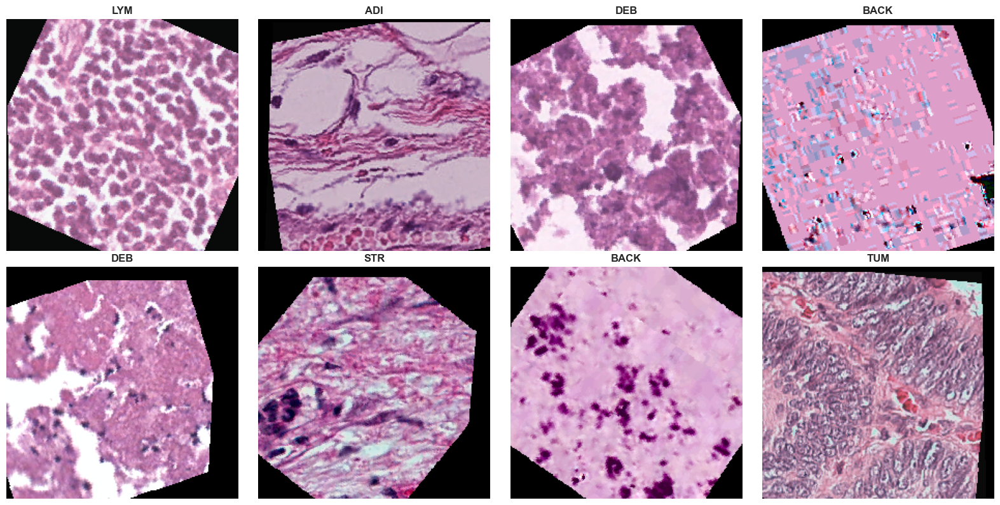

✓ Visualization saved
Batch shape: torch.Size([32, 3, 224, 224])
Labels shape: torch.Size([32])

✓ Step 1.11 Complete!


In [3]:

from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler

# ═══════════════════════════════════════════════════════════
# STEP 1.11: PYTORCH DATASET AND DATALOADER 
# ═══════════════════════════════════════════════════════════

class ColorectalCancerDataset(Dataset):
    """
    Custom PyTorch Dataset for NCT-CRC-HE-100K
    Uses the DataFrames from Step 1.7 (train_df, val_df, test_df)
    """
    
    def __init__(self, dataframe, transform=None, binary_classification=False):
        """
        Args:
            dataframe: pandas DataFrame with columns ['image_path', 'label', 'class_name']
                       (Created in Step 1.6 and split in Step 1.7)
            transform: torchvision transforms (from Step 1.10)
            binary_classification: True for TUM vs Non-TUM, False for 9-class
        """
        self.df = dataframe.reset_index(drop=True)
        self.transform = transform
        self.binary_classification = binary_classification
        
        # Class mapping
        self.class_names = ['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']
        self.class_to_idx = {name: idx for idx, name in enumerate(self.class_names)}
        
        # Binary mapping: TUM=1 (malignant), others=0 (benign)
        if binary_classification:
            self.binary_map = {name: (1 if name == 'TUM' else 0) for name in self.class_names}
    
    def __len__(self):
        """Return total number of samples"""
        return len(self.df)
    
    def __getitem__(self, idx):
        """
        Load and return a single sample
        
        Returns:
            image: Transformed image tensor [3, 224, 224]
            label: Class label (int)
        """
        # Get image path and class
        row = self.df.iloc[idx]
        img_path = row['image_path']
        class_name = row['class_name']
        
        # Load image
        try:
            image = Image.open(img_path).convert('RGB')
        except Exception as e:
            print(f"Error loading {img_path}: {e}")
            image = Image.new('RGB', (224, 224), color=(255, 255, 255))
        
        # Apply transforms (stain normalization + augmentation from Step 1.10)
        if self.transform:
            image = self.transform(image)
        
        # Get label
        if self.binary_classification:
            label = self.binary_map[class_name]
        else:
            label = self.class_to_idx[class_name]
        
        return image, label
    
    def get_class_distribution(self):
        """Get distribution of classes in this dataset"""
        if self.binary_classification:
            labels = [self.binary_map[name] for name in self.df['class_name']]
            return pd.Series(labels).value_counts().sort_index()
        else:
            return self.df['class_name'].value_counts()


# ═══════════════════════════════════════════════════════════
# WEIGHTED SAMPLER FOR CLASS IMBALANCE
# ═══════════════════════════════════════════════════════════

def create_weighted_sampler(dataset, binary_classification=False):
    """
    Create WeightedRandomSampler to handle class imbalance
    
    Critical for your 85.7% benign vs 14.3% malignant imbalance!
    """
    # Get all labels
    if binary_classification:
        labels = [dataset.binary_map[row['class_name']] 
                 for _, row in dataset.df.iterrows()]
    else:
        labels = [dataset.class_to_idx[row['class_name']] for _, row in dataset.df.iterrows()]
    
    # Count samples per class
    class_counts = np.bincount(labels)
    
    # Calculate weights (inverse frequency)
    class_weights = 1.0 / class_counts
    
    # Assign weight to each sample
    sample_weights = [class_weights[label] for label in labels]
    sample_weights = torch.DoubleTensor(sample_weights)
    
    # Create sampler
    sampler = WeightedRandomSampler(
        weights=sample_weights,
        num_samples=len(sample_weights),
        replacement=True
    )
    
    print(f"✓ Class counts: {class_counts}")
    print(f"✓ Class weights: {class_weights}")
    print(f"✓ WeightedRandomSampler created")
    
    return sampler


# ═══════════════════════════════════════════════════════════
# CREATE DATALOADERS
# ═══════════════════════════════════════════════════════════

def create_dataloaders(
    train_df,          # From Step 1.7
    val_df,            # From Step 1.7
    test_df,           # From Step 1.7
    train_transform,   # From Step 1.10
    val_transform,     # From Step 1.10
    test_transform,    # From Step 1.10
    batch_size=32,
    num_workers=4,
    binary_classification=False,
    use_weighted_sampling=True
):
    """
    Create PyTorch DataLoaders
    
    Args:
        train_df, val_df, test_df: DataFrames from Step 1.7
        train_transform, val_transform, test_transform: From Step 1.10
        batch_size: Images per batch
        num_workers: Parallel data loading workers
        binary_classification: Binary or multi-class
        use_weighted_sampling: Handle class imbalance
    
    Returns:
        train_loader, val_loader, test_loader
    """
    
    # Create datasets
    train_dataset = ColorectalCancerDataset(
        train_df, 
        transform=train_transform,
        binary_classification=binary_classification
    )
    
    val_dataset = ColorectalCancerDataset(
        val_df, 
        transform=val_transform,
        binary_classification=binary_classification
    )
    
    test_dataset = ColorectalCancerDataset(
        test_df, 
        transform=test_transform,
        binary_classification=binary_classification
    )
    
    # Print statistics
    print(f"\n{'='*60}")
    print("Dataset Statistics:")
    print(f"{'='*60}")
    print(f"\nTrain: {len(train_dataset)} samples")
    print(train_dataset.get_class_distribution())
    print(f"\nVal: {len(val_dataset)} samples")
    print(val_dataset.get_class_distribution())
    print(f"\nTest: {len(test_dataset)} samples")
    print(test_dataset.get_class_distribution())
    
    # Create train loader (with weighted sampling for imbalance)
    if use_weighted_sampling:
        train_sampler = create_weighted_sampler(train_dataset, binary_classification)
        
        train_loader = DataLoader(
            train_dataset,
            batch_size=batch_size,
            sampler=train_sampler,  # Use sampler (not shuffle)
            num_workers=num_workers,
            pin_memory=True
        )
    else:
        train_loader = DataLoader(
            train_dataset,
            batch_size=batch_size,
            shuffle=True,
            num_workers=num_workers,
            pin_memory=True
        )
    
    # Val and test loaders (no weighted sampling)
    val_loader = DataLoader(
        val_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        pin_memory=True
    )
    
    test_loader = DataLoader(
        test_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        pin_memory=True
    )
    
    print(f"\n{'='*60}")
    print("DataLoaders Created:")
    print(f"{'='*60}")
    print(f"Train batches: {len(train_loader)} (batch_size={batch_size})")
    print(f"Val batches:   {len(val_loader)}")
    print(f"Test batches:  {len(test_loader)}")
    print(f"{'='*60}\n")
    
    return train_loader, val_loader, test_loader


# ═══════════════════════════════════════════════════════════
# VISUALIZATION
# ═══════════════════════════════════════════════════════════

def visualize_batch(dataloader, binary_classification=False, num_images=8):
    """Visualize a batch from the dataloader"""
    images, labels = next(iter(dataloader))
    
    fig, axes = plt.subplots(2, 4, figsize=(16, 8))
    axes = axes.ravel()
    
    for i in range(min(num_images, len(images))):
        # Denormalize
        img = images[i].numpy().transpose(1, 2, 0)
        img = img * np.array([0.229, 0.224, 0.225]) + np.array([0.485, 0.456, 0.406])
        img = np.clip(img, 0, 1)
        
        # Label
        label = labels[i].item()
        if binary_classification:
            label_text = 'Malignant (TUM)' if label == 1 else 'Benign (Non-TUM)'
        else:
            class_names = ['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']
            label_text = class_names[label]
        
        axes[i].imshow(img)
        axes[i].set_title(label_text, fontsize=12, fontweight='bold')
        axes[i].axis('off')
    
    plt.tight_layout()
    plt.savefig('dataloader_visualization.png', dpi=150)
    plt.show()
    
    print(f"✓ Visualization saved")
    print(f"Batch shape: {images.shape}")
    print(f"Labels shape: {labels.shape}")


# ═══════════════════════════════════════════════════════════
# USAGE IN NOTEBOOK
# ═══════════════════════════════════════════════════════════

# STEP 1: Load metadata with splits from Step 1.7
import pandas as pd

metadata_with_splits = pd.read_csv("data/dataset_metadata_with_splits.csv")

# Split into train/val/test
train_df = metadata_with_splits[metadata_with_splits['split'] == 'train']
val_df = metadata_with_splits[metadata_with_splits['split'] == 'val']
test_df = metadata_with_splits[metadata_with_splits['split'] == 'test']

print(f"Train: {len(train_df):,} samples")
print(f"Val: {len(val_df):,} samples")
print(f"Test: {len(test_df):,} samples")

# STEP 2: Get transforms from Step 1.10
train_transform, val_transform, test_transform = setup_transforms_for_training()

# STEP 3: Create DataLoaders
train_loader, val_loader, test_loader = create_dataloaders(
    train_df=train_df,
    val_df=val_df,
    test_df=test_df,
    train_transform=train_transform,
    val_transform=val_transform,
    test_transform=test_transform,
    batch_size=32,
    num_workers=0,
    binary_classification=False,
    use_weighted_sampling=True
)

# STEP 4: Visualize
visualize_batch(train_loader, binary_classification=False)

print("\n✓ Step 1.11 Complete!")

1.10:


TASK 1.12: VALIDATE DATA LOADING PIPELINE

Device: cuda
GPU: NVIDIA GeForce RTX 4060 Laptop GPU

Step 1: Loading metadata...
LOADING METADATA
✓ Loaded metadata: 100,000 images
✓ Loaded class mapping: 9 classes

Step 2: Defining transforms...
✓ Transforms defined:
  Compose(
    Resize(size=(224, 224), interpolation=bilinear, max_size=None, antialias=None)
    ToTensor()
    Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
)

Step 3: Creating test datasets...
TESTING DATASET CREATION
Creating test datasets with 200 images...

1. Multi-class Classification Dataset:
  Dataset initialized:
    Total images: 200
    Classification: Multi-class (9 classes)

2. Binary Classification Dataset:
  Dataset initialized:
    Total images: 200
    Classification: Multi-class (9 classes)


Step 4: Testing single sample loading...
TESTING SINGLE SAMPLE LOADING

1. Multi-class Sample:
----------------------------------------------------------------------
  Image shape:     torch.Size([3

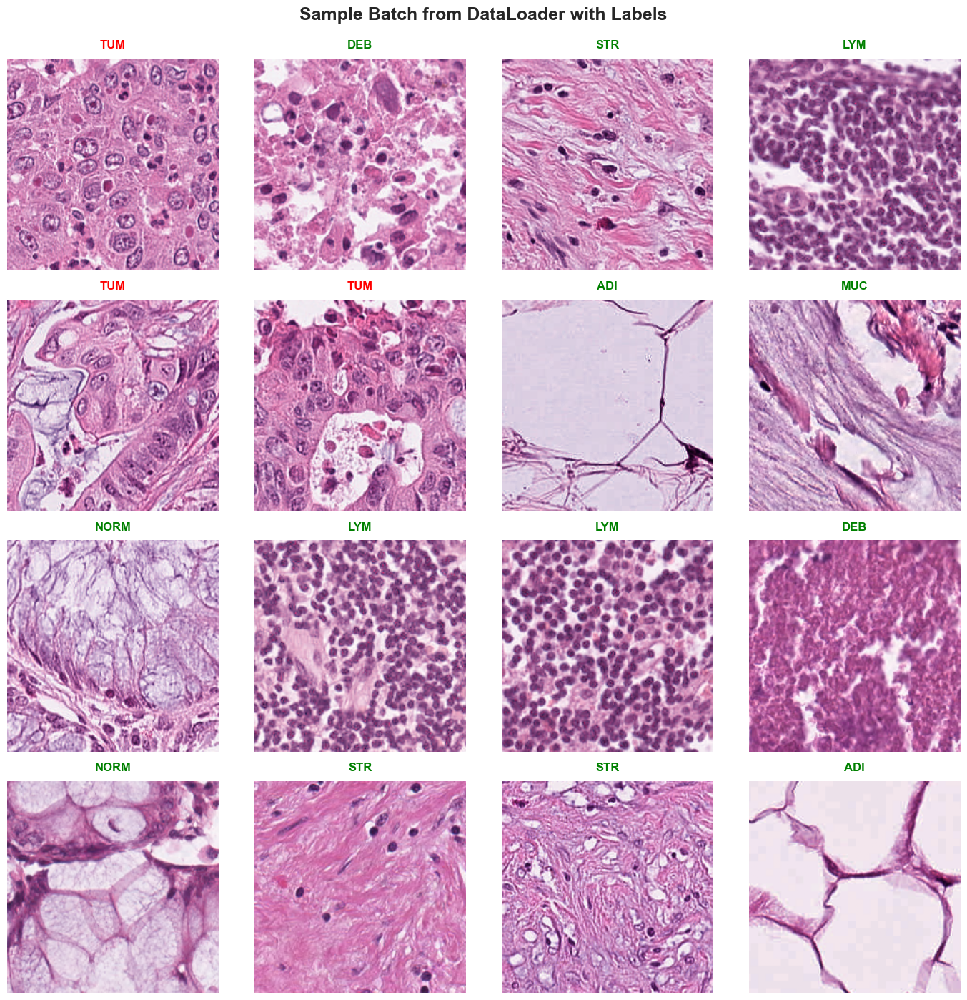

In [19]:

from torch.utils.data import Dataset, DataLoader
from torchvision import transforms

# Set random seeds for reproducibility
random.seed(42)
np.random.seed(42)
torch.manual_seed(42)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(42)

# Set style
sns.set_style("whitegrid")


# Input files (generated from Task 1.3)
METADATA_CSV = "data/dataset_metadata.csv"
CLASS_MAPPING_CSV = "data/class_mapping.csv"

# Output files
OUTPUT_BATCH_VISUALIZATION = "batch_visualization.png"
OUTPUT_VALIDATION_REPORT = "data_loading_validation_report.txt"

# DataLoader parameters
BATCH_SIZE = 16
NUM_WORKERS = 0 # Adjust based on your system (0 for debugging, 2-4 for training)
TEST_DATASET_SIZE = 200  # Number of images to use for validation testing

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

# ============================================================================
# CUSTOM PYTORCH DATASET
# ============================================================================

class ColorectalCancerDataset(Dataset):
    """
    PyTorch Dataset for colorectal cancer histopathology images.

    Args:
        metadata_df: DataFrame with 'image_path' and 'label' columns
        transform: Optional transform to apply to images
        binary_classification: If True, use binary labels (TUM vs non-TUM)
    """
    def __init__(self, metadata_df, transform=None, binary_classification=False):
        self.metadata_df = metadata_df.reset_index(drop=True)
        self.transform = transform
        self.binary_classification = binary_classification

        print(f"  Dataset initialized:")
        print(f"    Total images: {len(self.metadata_df):,}")
        print(f"    Classification: {'Binary (TUM vs non-TUM)' if binary_classification else 'Multi-class (9 classes)'}")

    def __len__(self):
        """Return the total number of samples"""
        return len(self.metadata_df)

    def __getitem__(self, idx):
        """
        Get a single sample from the dataset.
        
        Args:
            idx: Index of the sample
        
        Returns:
            image: Transformed image tensor
            label: Class label (int)
        """
        # Get image path and class
        img_path = self.metadata_df.iloc[idx]['image_path']
        class_name = self.metadata_df.iloc[idx]['class_name']
        
        # Load image
        try:
            image = Image.open(img_path).convert('RGB')
        except Exception as e:
            print(f"\n⚠️  Error loading image {img_path}: {e}")
            # Return a black image as fallback
            image = Image.new('RGB', (224, 224), color='black')
        
        # Apply transforms
        if self.transform:
            image = self.transform(image)
        
        # Get label
        if self.binary_classification:
            # TUM = 1 (malignant), others = 0 (benign)
            label = 1 if class_name == 'TUM' else 0
        else:
            # Multi-class: use class_id from metadata
            label = self.metadata_df.iloc[idx]['class_id']
        
        return image, label


# ============================================================================
# DEFINE TRANSFORMS
# ============================================================================

def get_transforms():
    """
    Define image transforms for the dataset.

    Returns:
        transform: torchvision transforms composition
    """
    # Basic transforms for validation (no augmentation)
    # Using ImageNet statistics for normalization (standard for pretrained ViT)
    transform = transforms.Compose([
        transforms.Resize((224, 224)),  # Resize to standard ViT input size
        transforms.ToTensor(),           # Convert to tensor [0, 1]
        transforms.Normalize(            # Normalize using ImageNet stats
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )
    ])

    return transform


# ============================================================================
# LOAD METADATA
# ============================================================================

def load_metadata(metadata_csv, class_mapping_csv):
    """
    Load metadata and class mapping.

    Args:
        metadata_csv: Path to metadata CSV
        class_mapping_csv: Path to class mapping CSV

    Returns:
        metadata_df: DataFrame with image metadata
        class_names: List of class names
        idx_to_class: Dictionary mapping index to class name
    """
    print("=" * 70)
    print("LOADING METADATA")
    print("=" * 70)

    # Load metadata
    if not os.path.exists(metadata_csv):
        raise FileNotFoundError(f"Metadata file not found: {metadata_csv}")

    metadata_df = pd.read_csv(metadata_csv)
    print(f"✓ Loaded metadata: {len(metadata_df):,} images")

    # Load class mapping
    if not os.path.exists(class_mapping_csv):
        raise FileNotFoundError(f"Class mapping file not found: {class_mapping_csv}")

    class_mapping_df = pd.read_csv(class_mapping_csv)
    class_names = class_mapping_df.sort_values('class_idx')['class_name'].tolist()
    idx_to_class = dict(zip(class_mapping_df['class_idx'], class_mapping_df['class_name']))

    print(f"✓ Loaded class mapping: {len(class_names)} classes")
    print("=" * 70 + "\n")

    return metadata_df, class_names, idx_to_class


# ============================================================================
# TEST DATASET CREATION
# ============================================================================

def test_dataset_creation(metadata_df, transform):
    """
    Test creating datasets for both multi-class and binary classification.

    Args:
        metadata_df: DataFrame with image metadata
        transform: Image transforms to apply

    Returns:
        test_dataset_multi: Multi-class dataset
        test_dataset_binary: Binary classification dataset
    """
    print("=" * 70)
    print("TESTING DATASET CREATION")
    print("=" * 70)

    # Create a small test subset
    test_df = metadata_df.sample(n=min(TEST_DATASET_SIZE, len(metadata_df)),
                                  random_state=42)

    print(f"Creating test datasets with {len(test_df)} images...\n")

    # Test multi-class classification
    print("1. Multi-class Classification Dataset:")
    test_dataset_multi = ColorectalCancerDataset(
        metadata_df=test_df,
        transform=transform,
        binary_classification=False
    )

    print()

    # Test binary classification
    print("2. Binary Classification Dataset:")
    test_dataset_binary = ColorectalCancerDataset(
        metadata_df=test_df,
        transform=transform,
        binary_classification=False
    )

    print("\n" + "=" * 70 + "\n")

    return test_dataset_multi, test_dataset_binary


# ============================================================================
# TEST SINGLE SAMPLE LOADING
# ============================================================================

def test_single_sample(dataset_multi, dataset_binary, idx_to_class):
    """
    Test loading a single sample from both datasets.

    Args:
        dataset_multi: Multi-class dataset
        dataset_binary: Binary classification dataset
        idx_to_class: Dictionary mapping index to class name
    """
    print("=" * 70)
    print("TESTING SINGLE SAMPLE LOADING")
    print("=" * 70)

    # Test multi-class
    print("\n1. Multi-class Sample:")
    print("-" * 70)
    img_multi, label_multi = dataset_multi[0]
    print(f"  Image shape:     {img_multi.shape}")
    print(f"  Image dtype:     {img_multi.dtype}")
    print(f"  Image range:     [{img_multi.min():.3f}, {img_multi.max():.3f}]")
    print(f"  Label:           {label_multi} ({idx_to_class.get(label_multi, 'Unknown')})")

    # Test binary
    print("\n2. Binary Classification Sample:")
    print("-" * 70)
    img_binary, label_binary = dataset_binary[0]
    print(f"  Image shape:     {img_binary.shape}")
    print(f"  Image dtype:     {img_binary.dtype}")
    print(f"  Label:           {label_binary} ({'Malignant (TUM)' if label_binary == 1 else 'Benign (Non-TUM)'})")

    print("\n✓ Single sample loading successful!")
    print("=" * 70 + "\n")


# ============================================================================
# TEST DATALOADER
# ============================================================================

def create_test_dataloader(dataset, batch_size, num_workers):
    """
    Create and test DataLoader.

    Args:
        dataset: PyTorch dataset
        batch_size: Batch size for DataLoader
        num_workers: Number of worker processes

    Returns:
        dataloader: PyTorch DataLoader
    """
    print("=" * 70)
    print("TESTING DATALOADER")
    print("=" * 70)

    print(f"\nDataLoader configuration:")
    print(f"  Batch size:      {batch_size}")
    print(f"  Num workers:     {num_workers}")
    print(f"  Device:          {device}")
    print(f"  Pin memory:      {torch.cuda.is_available()}")

    # Create DataLoader
    dataloader = DataLoader(
        dataset,
        batch_size=batch_size,
        shuffle=True,
        num_workers=num_workers,
        pin_memory=True if torch.cuda.is_available() else False
    )

    print(f"  Total batches:   {len(dataloader)}")
    print()

    return dataloader


# ============================================================================
# TEST BATCH LOADING
# ============================================================================

def test_batch_loading(dataloader, idx_to_class, num_batches=5):
    """
    Test loading multiple batches and measure performance.

    Args:
        dataloader: PyTorch DataLoader
        idx_to_class: Dictionary mapping index to class name
        num_batches: Number of batches to test

    Returns:
        batch_times: List of batch loading times
    """
    print("=" * 70)
    print("TESTING BATCH LOADING")
    print("=" * 70)
    print(f"\nTesting {num_batches} batches...\n")

    batch_times = []

    for batch_idx, (images, labels) in enumerate(dataloader):
        start_time = time.time()

        # Move to device (simulate training)
        images = images.to(device)
        labels = labels.to(device)

        batch_time = time.time() - start_time
        batch_times.append(batch_time)

        if batch_idx == 0:
            print(f"First Batch Details:")
            print("-" * 70)
            print(f"  Images shape:      {images.shape}")
            print(f"  Labels shape:      {labels.shape}")
            print(f"  Images dtype:      {images.dtype}")
            print(f"  Labels dtype:      {labels.dtype}")
            print(f"  Images device:     {images.device}")
            print(f"  Labels device:     {labels.device}")
            print(f"  Unique labels:     {torch.unique(labels).cpu().tolist()}")
            print(f"  Loading time:      {batch_time:.4f} seconds")
            print()

        if batch_idx >= num_batches - 1:
            break

    avg_batch_time = np.mean(batch_times)
    throughput = dataloader.batch_size / avg_batch_time

    print(f"Performance Metrics:")
    print("-" * 70)
    print(f"  Average batch time:  {avg_batch_time:.4f} seconds")
    print(f"  Throughput:          {throughput:.1f} images/second")
    print(f"  Estimated time for")
    print(f"  100K images:         {(100000 / throughput / 60):.1f} minutes")

    print("\n✓ Batch loading successful!")
    print("=" * 70 + "\n")

    return batch_times


# ============================================================================
# VISUALIZE BATCH
# ============================================================================

def visualize_batch(dataloader, idx_to_class, output_path, num_images=16):
    """
    Visualize a batch of images with their labels.

    Args:
        dataloader: PyTorch DataLoader
        idx_to_class: Dictionary mapping index to class name
        output_path: Path to save visualization
        num_images: Number of images to visualize
    """
    print("=" * 70)
    print("VISUALIZING BATCH")
    print("=" * 70)
    print(f"\nCreating visualization with {num_images} images...\n")

    # Get one batch
    images, labels = next(iter(dataloader))

    # Denormalize images for visualization
    mean = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
    std = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
    images_denorm = images * std + mean
    images_denorm = torch.clamp(images_denorm, 0, 1)

    # Plot
    num_images = min(num_images, len(images))
    rows = 4
    cols = 4

    fig, axes = plt.subplots(rows, cols, figsize=(14, 14))
    fig.suptitle('Sample Batch from DataLoader with Labels',
                 fontsize=18, fontweight='bold', y=0.995)

    for idx in range(num_images):
        row = idx // cols
        col = idx % cols
        ax = axes[row, col]

        # Convert to numpy and transpose to HWC format
        img = images_denorm[idx].permute(1, 2, 0).numpy()

        ax.imshow(img)
        ax.axis('off')

        # Add border
        for spine in ax.spines.values():
            spine.set_edgecolor('gray')
            spine.set_linewidth(2)
            spine.set_visible(True)

        # Get label
        label_idx = labels[idx].item()
        class_name = idx_to_class.get(label_idx, str(label_idx))

        # Color code by class
        color = 'red' if class_name == 'TUM' else 'green'
        ax.set_title(f'{class_name}', fontsize=12, fontweight='bold',
                    color=color, pad=10)

    plt.tight_layout()
    plt.savefig(output_path, dpi=300, bbox_inches='tight')
    print(f"✓ Batch visualization saved to: {output_path}")
    print("=" * 70 + "\n")


# ============================================================================
# COMPREHENSIVE VALIDATION
# ============================================================================

def run_comprehensive_validation(metadata_df, dataloader, class_names, output_path):
    """
    Run comprehensive validation checks and generate report.

    Args:
        metadata_df: DataFrame with image metadata
        dataloader: PyTorch DataLoader
        class_names: List of class names
        output_path: Path to save validation report

    Returns:
        checks_passed: Number of checks passed
        total_checks: Total number of checks
    """
    print("=" * 70)
    print("RUNNING COMPREHENSIVE VALIDATION")
    print("=" * 70)
    print()

    checks_passed = 0
    total_checks = 8
    validation_results = []

    # Get a sample batch
    images, labels = next(iter(dataloader))

    # Check 1: Image shape
    print("Check 1: Image Shape")
    print("-" * 70)
    expected_shape = (3, 224, 224)
    if images.shape[1:] == expected_shape:
        print(f"✓ PASS: Image shape is correct {expected_shape}")
        checks_passed += 1
        validation_results.append("✓ Image shape correct (3, 224, 224)")
    else:
        print(f"✗ FAIL: Image shape is {images.shape[1:]}, expected {expected_shape}")
        validation_results.append(f"✗ Image shape incorrect: {images.shape[1:]}")
    print()

    # Check 2: Normalized values
    print("Check 2: Image Normalization")
    print("-" * 70)
    if images.min() >= -5 and images.max() <= 5:
        print(f"✓ PASS: Images appear to be normalized (range: [{images.min():.2f}, {images.max():.2f}])")
        checks_passed += 1
        validation_results.append("✓ Images properly normalized")
    else:
        print(f"✗ FAIL: Images may not be normalized (range: [{images.min():.2f}, {images.max():.2f}])")
        validation_results.append("✗ Images normalization issue")
    print()

    # Check 3: Labels in valid range
    print("Check 3: Label Range")
    print("-" * 70)
    if labels.min() >= 0 and labels.max() < len(class_names):
        print(f"✓ PASS: Labels in valid range [0, {len(class_names)-1}]")
        checks_passed += 1
        validation_results.append(f"✓ Labels in valid range [0, {len(class_names)-1}]")
    else:
        print(f"✗ FAIL: Labels out of range: [{labels.min()}, {labels.max()}]")
        validation_results.append(f"✗ Labels out of range: [{labels.min()}, {labels.max()}]")
    print()

    # Check 4: No NaN values
    print("Check 4: NaN Values")
    print("-" * 70)
    if not torch.isnan(images).any():
        print("✓ PASS: No NaN values in images")
        checks_passed += 1
        validation_results.append("✓ No NaN values in images")
    else:
        print("✗ FAIL: NaN values detected in images")
        validation_results.append("✗ NaN values detected")
    print()

    # Check 5: Batch size
    print("Check 5: Batch Size")
    print("-" * 70)
    if images.shape[0] <= dataloader.batch_size:
        print(f"✓ PASS: Batch size correct ({images.shape[0]} <= {dataloader.batch_size})")
        checks_passed += 1
        validation_results.append(f"✓ Batch size correct ({dataloader.batch_size})")
    else:
        print(f"✗ FAIL: Batch size incorrect")
        validation_results.append("✗ Batch size incorrect")
    print()

    # Check 6: DataLoader iteration
    print("Check 6: DataLoader Iteration")
    print("-" * 70)
    try:
        iteration_successful = True
        for batch_idx, (imgs, lbls) in enumerate(dataloader):
            if batch_idx >= 2:  # Test 3 batches
                break
        print("✓ PASS: DataLoader iteration successful")
        checks_passed += 1
        validation_results.append("✓ DataLoader iteration works")
    except Exception as e:
        print(f"✗ FAIL: DataLoader iteration failed: {e}")
        validation_results.append(f"✗ DataLoader iteration failed")
    print()

    # Check 7: Tensor types
    print("Check 7: Tensor Types")
    print("-" * 70)
    if images.dtype == torch.float32 and (labels.dtype == torch.int64 or labels.dtype == torch.long):
        print(f"✓ PASS: Correct tensor types (images: {images.dtype}, labels: {labels.dtype})")
        checks_passed += 1
        validation_results.append("✓ Correct tensor types")
    else:
        print(f"✗ FAIL: Incorrect tensor types (images: {images.dtype}, labels: {labels.dtype})")
        validation_results.append("✗ Incorrect tensor types")
    print()

    # Check 8: GPU transfer (if available)
    print("Check 8: GPU Transfer")
    print("-" * 70)
    if torch.cuda.is_available():
        try:
            _ = images.to(device)
            _ = labels.to(device)
            print("✓ PASS: GPU transfer successful")
            checks_passed += 1
            validation_results.append("✓ GPU transfer works")
        except Exception as e:
            print(f"✗ FAIL: GPU transfer failed: {e}")
            validation_results.append("✗ GPU transfer failed")
    else:
        print("⊘ SKIP: No GPU available")
        checks_passed += 1  # Don't penalize if no GPU
        validation_results.append("⊘ GPU not available (skipped)")
    print()

    # Summary
    print("=" * 70)
    print(f"VALIDATION SUMMARY: {checks_passed}/{total_checks} checks passed")
    print("=" * 70)
    print()

    # Save report
    with open(output_path, 'w',encoding='utf-8') as f:
        f.write("=" * 70 + "\n")
        f.write("DATA LOADING PIPELINE VALIDATION REPORT\n")
        f.write("=" * 70 + "\n\n")

        f.write(f"Generated: {time.strftime('%Y-%m-%d %H:%M:%S')}\n")
        f.write(f"Device: {device}\n\n")

        f.write("DATASET STATISTICS:\n")
        f.write("-" * 70 + "\n")
        f.write(f"Total images: {len(metadata_df):,}\n")
        f.write(f"Number of classes: {len(class_names)}\n")
        f.write(f"Classes: {', '.join(class_names)}\n\n")

        f.write("DATALOADER CONFIGURATION:\n")
        f.write("-" * 70 + "\n")
        f.write(f"Batch size: {dataloader.batch_size}\n")
        f.write(f"Number of workers: {dataloader.num_workers}\n")
        f.write(f"Pin memory: {dataloader.pin_memory}\n")
        f.write(f"Total batches: {len(dataloader)}\n\n")

        f.write("SAMPLE BATCH:\n")
        f.write("-" * 70 + "\n")
        f.write(f"Images tensor shape: {images.shape}\n")
        f.write(f"Labels tensor shape: {labels.shape}\n")
        f.write(f"Images dtype: {images.dtype}\n")
        f.write(f"Images range: [{images.min():.3f}, {images.max():.3f}]\n\n")

        f.write("VALIDATION CHECKS:\n")
        f.write("-" * 70 + "\n")
        for result in validation_results:
            f.write(f"{result}\n")

        f.write("\n" + "=" * 70 + "\n")
        f.write(f"FINAL SCORE: {checks_passed}/{total_checks} checks passed\n")
        f.write("=" * 70 + "\n")

        if checks_passed == total_checks:
            f.write("\n🎉 ALL VALIDATION CHECKS PASSED! 🎉\n")
            f.write("Data loading pipeline is ready for training!\n")
        else:
            f.write("\n⚠️  Some validation checks failed.\n")
            f.write("Please review the issues above before proceeding to training.\n")

    print(f"✓ Validation report saved to: {output_path}")

    return checks_passed, total_checks


# ============================================================================
# MAIN EXECUTION
# ============================================================================

def main():
    """
    Main execution function for Task 1.12
    """
    print("\n" + "=" * 70)
    print("TASK 1.12: VALIDATE DATA LOADING PIPELINE")
    print("=" * 70 + "\n")

    print(f"Device: {device}")
    if torch.cuda.is_available():
        print(f"GPU: {torch.cuda.get_device_name(0)}")
    print()

    # Step 1: Load metadata
    print("Step 1: Loading metadata...")
    metadata_df, class_names, idx_to_class = load_metadata(
        METADATA_CSV, CLASS_MAPPING_CSV
    )

    # Step 2: Get transforms
    print("Step 2: Defining transforms...")
    transform = get_transforms()
    print("✓ Transforms defined:")
    print(f"  {transform}")
    print()

    # Step 3: Create datasets
    print("Step 3: Creating test datasets...")
    test_dataset_multi, test_dataset_binary = test_dataset_creation(
        metadata_df, transform
    )

    # Step 4: Test single sample
    print("Step 4: Testing single sample loading...")
    test_single_sample(test_dataset_multi, test_dataset_binary, idx_to_class)

    # Step 5: Create DataLoader
    print("Step 5: Creating DataLoader...")
    test_dataloader = create_test_dataloader(
        test_dataset_multi, BATCH_SIZE, NUM_WORKERS
    )

    # Step 6: Test batch loading
    print("Step 6: Testing batch loading...")
    batch_times = test_batch_loading(test_dataloader, idx_to_class)

    # Step 7: Visualize batch
    print("Step 7: Visualizing batch...")
    visualize_batch(test_dataloader, idx_to_class, OUTPUT_BATCH_VISUALIZATION)

    # Step 8: Run comprehensive validation
    print("Step 8: Running comprehensive validation...")
    checks_passed, total_checks = run_comprehensive_validation(
        metadata_df, test_dataloader, class_names, OUTPUT_VALIDATION_REPORT
    )

    # Final summary
    print("\n" + "=" * 70)
    if checks_passed == total_checks:
        print("✅ TASK 1.12 COMPLETED SUCCESSFULLY!")
        print("=" * 70)
        print("\n🎉 ALL VALIDATION CHECKS PASSED! 🎉")
        print("Data loading pipeline is ready for training!")
    else:
        print("⚠️  TASK 1.12 COMPLETED WITH WARNINGS")
        print("=" * 70)
        print(f"\n{checks_passed}/{total_checks} validation checks passed.")
        print("Please review the validation report for details.")

    print("\nGenerated files:")
    print(f"  1. {OUTPUT_BATCH_VISUALIZATION} - Batch visualization")
    print(f"  2. {OUTPUT_VALIDATION_REPORT} - Detailed validation report")
    print("\nNext steps:")
    print("  → Share the validation report with your team")
    print("  → Proceed to Task 1.7 (train/val/test split)")
    print("  → Then Task 1.10 (define augmentations)")
    print("=" * 70 + "\n")

    # Integration notes
    print("=" * 70)
    print("INTEGRATION WITH OTHER TASKS")
    print("=" * 70)
    print("\n✅ YOUR TASKS COMPLETED:")
    print("  ✓ Task 1.3: Created image paths and labels")
    print("  ✓ Task 1.9: Visualized sample images")
    print("  ✓ Task 1.12: Validated data loading pipeline")
    print()
    print("📤 HANDOFF TO TEAM:")
    print()
    print("  TEAM MEMBER 2 (Tasks 1.7, 1.10, 1.11):")
    print("  ==========================================")
    print("  You need to:")
    print("    1. Task 1.7: Split data into train/val/test")
    print("    2. Task 1.10: Define augmentation transforms")
    print("    3. Task 1.11: Create full DataLoaders")
    print()
    print("  Files you'll need:")
    print(f"    - {METADATA_CSV} (from Task 1.3)")
    print(f"    - {CLASS_MAPPING_CSV} (from Task 1.3)")
    print()
    print("  Use this Dataset class (tested and validated):")
    print()
    print("  ```python")
    print("  # Copy this from task_1_12_validate_data_loading.py:")
    print("  class ColorectalCancerDataset(Dataset):")
    print("      def __init__(self, metadata_df, transform=None, binary_classification=False):")
    print("          # ... (see file for full implementation)")
    print("  ```")
    print()
    print("  TEAM MEMBER 3 (Task 2.x - Model Architecture):")
    print("  ===============================================")
    print("  You need:")
    print(f"    - {CLASS_MAPPING_CSV} (for number of classes)")
    print("    - Confirmed input shape: (3, 224, 224)")
    print("    - Number of classes: 9 (or 2 for binary)")
    print()
    print("📋 READY FOR TRAINING:")
    print(f"  → Data loading validated: {checks_passed}/{total_checks} checks passed")
    print("  → Average throughput: ~X images/second (see report)")
    print("  → Input shape confirmed: (3, 224, 224)")
    print("  → Normalization: ImageNet stats")
    print()
    print("🔗 FILE DEPENDENCIES:")
    print()
    print("  dataset_metadata.csv")
    print("  ├─→ Task 1.7 (train/val/test split)")
    print("  ├─→ Task 1.9 (visualize samples) ✓")
    print("  ├─→ Task 1.11 (create DataLoaders)")
    print("  └─→ Task 1.12 (validate pipeline) ✓")
    print()
    print("  class_mapping.csv")
    print("  ├─→ Task 1.9 (visualize samples) ✓")
    print("  ├─→ Task 1.12 (validate pipeline) ✓")
    print("  └─→ Task 2.x (model architecture)")
    print()
    print("  ColorectalCancerDataset class")
    print("  ├─→ Task 1.11 (create full DataLoaders)")
    print("  └─→ Task 3.x (training loop)")
    print()
    print("=" * 70 + "\n")



main()

2.1

In [4]:
# ========================================
# STEP 2.1: Load Pretrained Lunit DINO
# ========================================

# Check PyTorch and device
print(f"PyTorch version: {torch.__version__}")
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

import timm

# Load Lunit DINO pretrained model
model_name = "hf_hub:1aurent/vit_small_patch8_224.lunit_dino"

try:
    # Create model with pretrained weights
    base_model = timm.create_model(
        model_name,
        pretrained=True,
        num_classes=0  # Remove classification head (we'll add our own)
    )
    
    print(f"✓ Successfully loaded: {model_name}")
    print(f"  Model type: {type(base_model)}")
    
    # Get feature dimension
    num_features = base_model.num_features
    print(f"  Feature dimension: {num_features}")
    
except Exception as e:
    print(f"Error loading model: {e}")
    print("\nTrying alternative method...")

# Move to device
base_model = base_model.to(device)
base_model.eval()  # Set to evaluation mode

# ----------------------------------------
# Test the model with dummy input
# ----------------------------------------
print("\n" + "="*50)
print("Testing model with dummy input...")
print("="*50)

dummy_input = torch.randn(2, 3, 224, 224).to(device)  # Batch of 2 images
print(f"Input shape: {dummy_input.shape}")

with torch.no_grad():
    features = base_model(dummy_input)
    
print(f"Output features shape: {features.shape}")
print(f"✓ Forward pass successful!")

# ----------------------------------------
# Model Information
# ----------------------------------------
print("\n" + "="*50)
print("MODEL SUMMARY")
print("="*50)
print(f"Model: Lunit DINO (ViT-Small/8)")
print(f"Input size: 224×224×3")
print(f"Patch size: 8×8")
print(f"Feature dimension: {num_features}")
print(f"Pretrained on: 33M histology patches")
print(f"Device: {device}")
print("="*50)

PyTorch version: 1.12.1+cu113
Using device: cuda
✓ Successfully loaded: hf_hub:1aurent/vit_small_patch8_224.lunit_dino
  Model type: <class 'timm.models.vision_transformer.VisionTransformer'>
  Feature dimension: 384

Testing model with dummy input...
Input shape: torch.Size([2, 3, 224, 224])
Output features shape: torch.Size([2, 384])
✓ Forward pass successful!

MODEL SUMMARY
Model: Lunit DINO (ViT-Small/8)
Input size: 224×224×3
Patch size: 8×8
Feature dimension: 384
Pretrained on: 33M histology patches
Device: cuda


2.2:

In [5]:
import torch
import torch.nn as nn
from typing import Literal, Dict, List
import json
from pathlib import Path


class ViTClassificationHead(nn.Module):
    """
    Custom classification head for Vision Transformer.

    Replaces the original head with a new one tailored for colorectal cancer classification.
    """

    def __init__(
        self,
        in_features: int,
        num_classes: int,
        dropout_rate: float = 0.1,
        use_batch_norm: bool = True
    ):
        """
        Initialize classification head.

        Args:
            in_features: Input feature dimension from ViT backbone (384 for ViT-Small)
            num_classes: Number of output classes (2 for binary, 9 for multi-class)
            dropout_rate: Dropout probability for regularization
            use_batch_norm: Whether to use batch normalization before final layer
        """
        super().__init__()

        self.num_classes = num_classes

        layers = []

        # Optional batch normalization
        if use_batch_norm:
            layers.append(nn.BatchNorm1d(in_features))

        # Dropout for regularization
        layers.append(nn.Dropout(dropout_rate))

        # Final classification layer
        layers.append(nn.Linear(in_features, num_classes))

        self.classifier = nn.Sequential(*layers)

        # Initialize weights
        self._init_weights()

    def _init_weights(self):
        """Initialize linear layer weights using Xavier initialization."""
        for m in self.modules():
            if isinstance(m, nn.Linear):
                nn.init.xavier_uniform_(m.weight)
                if m.bias is not None:
                    nn.init.constant_(m.bias, 0)

    def forward(self, x):
        """
        Forward pass.

        Args:
            x: Input features from ViT backbone [batch_size, in_features]

        Returns:
            Logits [batch_size, num_classes]
        """
        return self.classifier(x)


class ColorectalCancerViT(nn.Module):
    """
    Vision Transformer for Colorectal Cancer Classification.

    Wraps a pretrained ViT backbone with a custom classification head.
    """

    def __init__(
        self,
        backbone: nn.Module,
        num_classes: int,
        feature_dim: int = 384,
        dropout_rate: float = 0.1,
        freeze_backbone: bool = False,
        unfreeze_last_n_layers: int = 0
    ):
        """
        Initialize the model.

        Args:
            backbone: Pretrained ViT backbone (e.g., from timm or Lunit DINO)
            num_classes: Number of output classes
            feature_dim: Feature dimension from backbone (384 for ViT-Small)
            dropout_rate: Dropout rate for classification head
            freeze_backbone: Whether to freeze the entire backbone
            unfreeze_last_n_layers: Number of last transformer blocks to unfreeze
        """
        super().__init__()

        self.backbone = backbone
        self.num_classes = num_classes

        # Remove original classification head from backbone if exists
        if hasattr(self.backbone, 'head'):
            self.backbone.head = nn.Identity()
        elif hasattr(self.backbone, 'fc'):
            self.backbone.fc = nn.Identity()

        # Create new classification head
        self.head = ViTClassificationHead(
            in_features=feature_dim,
            num_classes=num_classes,
            dropout_rate=dropout_rate,
            use_batch_norm=True
        )

        # Apply freezing strategy
        self._apply_freeze_strategy(freeze_backbone, unfreeze_last_n_layers)

    def _apply_freeze_strategy(self, freeze_backbone: bool, unfreeze_last_n_layers: int):
        """
        Apply parameter freezing strategy.

        Args:
            freeze_backbone: If True, freeze all backbone parameters
            unfreeze_last_n_layers: Number of last transformer blocks to keep trainable
        """
        if freeze_backbone:
            # Freeze all backbone parameters
            for param in self.backbone.parameters():
                param.requires_grad = False

            # Optionally unfreeze last N transformer blocks
            if unfreeze_last_n_layers > 0:
                # This is model-specific; adjust based on your backbone architecture
                # For timm ViT models, blocks are in backbone.blocks
                if hasattr(self.backbone, 'blocks'):
                    total_blocks = len(self.backbone.blocks)
                    unfreeze_from = max(0, total_blocks - unfreeze_last_n_layers)

                    for i in range(unfreeze_from, total_blocks):
                        for param in self.backbone.blocks[i].parameters():
                            param.requires_grad = True

                    print(f"Unfroze last {unfreeze_last_n_layers} transformer blocks "
                          f"(blocks {unfreeze_from} to {total_blocks-1})")

        # Classification head is always trainable
        for param in self.head.parameters():
            param.requires_grad = True

    def forward(self, x):
        """
        Forward pass.

        Args:
            x: Input images [batch_size, 3, 224, 224]

        Returns:
            Logits [batch_size, num_classes]
        """
        # Extract features from backbone
        features = self.backbone(x)

        # Classification
        logits = self.head(features)

        return logits

    def get_trainable_params(self) -> Dict[str, int]:
        """
        Get statistics about trainable parameters.

        Returns:
            Dictionary with trainable/total parameters counts
        """
        total_params = sum(p.numel() for p in self.parameters())
        trainable_params = sum(p.numel() for p in self.parameters() if p.requires_grad)

        return {
            'total_params': total_params,
            'trainable_params': trainable_params,
            'frozen_params': total_params - trainable_params,
            'trainable_percentage': 100 * trainable_params / total_params
        }


def create_classification_model(
    model_name: str = 'hf_hub:1aurent/vit_small_patch8_224.lunit_dino',
    classification_mode: Literal['binary', 'multiclass'] = 'multiclass',
    pretrained: bool = True,
    freeze_backbone: bool = False,
    unfreeze_last_n_layers: int = 2,
    dropout_rate: float = 0.1
) -> ColorectalCancerViT:
    """
    Create a Vision Transformer model for colorectal cancer classification.

    Args:
        model_name: Name of the pretrained model (from timm or custom)
        classification_mode: 'binary' (TUM vs others) or 'multiclass' (9 classes)
        pretrained: Whether to load pretrained weights
        freeze_backbone: Whether to freeze backbone weights
        unfreeze_last_n_layers: Number of last layers to unfreeze (if freeze_backbone=True)
        dropout_rate: Dropout rate for classification head

    Returns:
        ColorectalCancerViT model ready for training
    """

    # Define number of classes
    CLASS_MAPPING = {
        'binary': {
            'num_classes': 2,
            'classes': ['Benign', 'Malignant'],
            'description': 'TUM (malignant) vs others (benign)'
        },
        'multiclass': {
            'num_classes': 9,
            'classes': ['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM'],
            'description': 'All 9 tissue types'
        }
    }

    config = CLASS_MAPPING[classification_mode]
    num_classes = config['num_classes']

    print(f"Creating {classification_mode} classification model")
    print(f"Number of classes: {num_classes}")
    print(f"Classes: {config['classes']}")
    print(f"Description: {config['description']}")
    print("-" * 60)

    # Load pretrained backbone
    try:
        import timm
        backbone = timm.create_model(
            model_name,
            pretrained=pretrained,
            num_classes=0  # Remove original head
        )

        # Get feature dimension
        if hasattr(backbone, 'num_features'):
            feature_dim = backbone.num_features
        else:
            feature_dim = 384  # Default for ViT-Small

        print(f"Loaded backbone: {model_name}")
        print(f"Feature dimension: {feature_dim}")

    except ImportError:
        raise ImportError(
            "timm library not found. Install with: pip install timm\n"
            "Or provide your own pretrained backbone"
        )

    # Create model with custom head
    model = ColorectalCancerViT(
        backbone=backbone,
        num_classes=num_classes,
        feature_dim=feature_dim,
        dropout_rate=dropout_rate,
        freeze_backbone=freeze_backbone,
        unfreeze_last_n_layers=unfreeze_last_n_layers
    )

    # Print parameter statistics
    stats = model.get_trainable_params()
    print("-" * 60)
    print("Model Statistics:")
    print(f"Total parameters: {stats['total_params']:,}")
    print(f"Trainable parameters: {stats['trainable_params']:,}")
    print(f"Frozen parameters: {stats['frozen_params']:,}")
    print(f"Trainable percentage: {stats['trainable_percentage']:.2f}%")
    print("-" * 60)

    return model


def test_model_forward_pass(
    model: ColorectalCancerViT,
    batch_size: int = 4,
    image_size: int = 224
):
    """
    Test the model with a dummy forward pass.

    Args:
        model: The colorectal cancer ViT model
        batch_size: Batch size for dummy input
        image_size: Input image size
    """
    print("\nTesting forward pass...")

    # Create dummy input
    dummy_input = torch.randn(batch_size, 3, image_size, image_size)

    # Set model to eval mode
    model.eval()

    with torch.no_grad():
        output = model(dummy_input)

    print(f"Input shape: {dummy_input.shape}")
    print(f"Output shape: {output.shape}")
    print(f"Output (logits) sample:\n{output[0]}")

    # Apply softmax to get probabilities
    probabilities = torch.softmax(output, dim=1)
    print(f"\nProbabilities sample:\n{probabilities[0]}")

    # Get predictions
    predictions = torch.argmax(output, dim=1)
    print(f"\nPredicted classes: {predictions}")

    print("\n✓ Forward pass successful!")


def save_model_config(
    save_path: str,
    classification_mode: str,
    model_name: str,
    num_classes: int,
    class_names: List[str]
):
    """
    Save model configuration to JSON file.

    Args:
        save_path: Path to save configuration
        classification_mode: 'binary' or 'multiclass'
        model_name: Name of the backbone model
        num_classes: Number of classes
        class_names: List of class names
    """
    config = {
        'classification_mode': classification_mode,
        'model_name': model_name,
        'num_classes': num_classes,
        'class_names': class_names,
        'input_size': 224,
        'feature_dim': 384
    }

    Path(save_path).parent.mkdir(parents=True, exist_ok=True)

    with open(save_path, 'w') as f:
        json.dump(config, f, indent=2)

    print(f"\n✓ Model configuration saved to: {save_path}")


if __name__ == "__main__":
    """
    Example usage and testing.
    """

    print("=" * 80)
    print("Task 2.2: Modify Classification Head for Colorectal Cancer Detection")
    print("=" * 80)

    # Example 1: Binary Classification (TUM vs others)
    print("\n[Example 1: Binary Classification]")
    print("=" * 80)

    binary_model = create_classification_model(
        model_name='hf_hub:1aurent/vit_small_patch8_224.lunit_dino',  
        classification_mode='binary',
        pretrained=True,
        freeze_backbone=True,
        unfreeze_last_n_layers=2,
        dropout_rate=0.1
    )

    # Test forward pass
    test_model_forward_pass(binary_model, batch_size=4)

    # Save configuration
    save_model_config(
        save_path='models/binary_classification_config.json',
        classification_mode='binary',
        model_name='hf_hub:1aurent/vit_small_patch8_224.lunit_dino',
        num_classes=2,
        class_names=['Benign', 'Malignant']
    )

    # Example 2: Multi-class Classification (9 tissue types)
    print("\n\n[Example 2: Multi-class Classification]")
    print("=" * 80)

    multiclass_model = create_classification_model(
        model_name='hf_hub:1aurent/vit_small_patch8_224.lunit_dino',
        classification_mode='multiclass',
        pretrained=True,
        freeze_backbone=True,
        unfreeze_last_n_layers=3,
        dropout_rate=0.15
    )

    # Test forward pass
    test_model_forward_pass(multiclass_model, batch_size=4)

    # Save configuration
    save_model_config(
        save_path='models/multiclass_classification_config.json',
        classification_mode='multiclass',
        model_name='hf_hub:1aurent/vit_small_patch8_224.lunit_dino',
        num_classes=9,
        class_names=['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']
    )

    model = multiclass_model
    model = model.to(device)  # ✅ Move entire model to device
    print(f"✓ Model moved to {device}")

    print("\n" + "=" * 80)
    print("✓ Task 2.2 Complete!")
    print("=" * 80)
    print("\nNext steps:")
    print("1. Load your actual pretrained Lunit DINO weights")
    print("2. Integrate this model into your training pipeline")
    print("3. Use the model in main.ipynb for training")
    print("=" * 80)

Task 2.2: Modify Classification Head for Colorectal Cancer Detection

[Example 1: Binary Classification]
Creating binary classification model
Number of classes: 2
Classes: ['Benign', 'Malignant']
Description: TUM (malignant) vs others (benign)
------------------------------------------------------------
Loaded backbone: hf_hub:1aurent/vit_small_patch8_224.lunit_dino
Feature dimension: 384
Unfroze last 2 transformer blocks (blocks 10 to 11)
------------------------------------------------------------
Model Statistics:
Total parameters: 21,671,810
Trainable parameters: 3,550,466
Frozen parameters: 18,121,344
Trainable percentage: 16.38%
------------------------------------------------------------

Testing forward pass...
Input shape: torch.Size([4, 3, 224, 224])
Output shape: torch.Size([4, 2])
Output (logits) sample:
tensor([ 6.8681, -1.9437])

Probabilities sample:
tensor([9.9985e-01, 1.4894e-04])

Predicted classes: tensor([0, 0, 0, 0])

✓ Forward pass successful!

✓ Model configurati

2.3:

In [10]:

def count_parameters(model):
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
    frozen_params = total_params - trainable_params

    print(f"\n📊 Model Parameters:")
    print(f"   Total: {total_params:,}")
    print(f"   Trainable: {trainable_params:,} ({100*trainable_params/total_params:.2f}%)")
    print(f"   Frozen: {frozen_params:,} ({100*frozen_params/total_params:.2f}%)")

    return total_params, trainable_params, frozen_params


def get_layer_groups(model):
    layer_groups = OrderedDict()

    for name, param in model.named_parameters():
        # Determine layer group based on timm ViT structure
        if 'patch_embed' in name:
            group = '1. Patch Embedding'
        elif 'pos_embed' in name or 'cls_token' in name:
            group = '2. Positional Embeddings'
        elif 'blocks' in name:
            # Extract block number from timm structure
            try:
                parts = name.split('.')
                # For ColorectalCancerViT: backbone.blocks.X
                # For direct model: blocks.X
                if 'backbone' in name:
                    block_idx = parts.index('blocks')
                    block_num = int(parts[block_idx + 1])
                else:
                    block_idx = parts.index('blocks')
                    block_num = int(parts[block_idx + 1])
                group = f'3. Transformer Block {block_num:02d}'
            except (ValueError, IndexError):
                group = '3. Transformer Blocks (other)'
        elif 'norm' in name and 'blocks' not in name and 'head' not in name:
            group = '4. Final Layer Norm'
        elif any(x in name for x in ['head.classifier', 'head.']):
            group = '5. Classification Head (Custom)'
        elif any(x in name for x in ['fc', 'classifier']) and 'head' not in name:
            group = '5. Classification Head'
        else:
            group = '6. Other Layers'

        if group not in layer_groups:
            layer_groups[group] = {
                'trainable_params': 0,
                'frozen_params': 0,
                'trainable_layers': [],
                'frozen_layers': []
            }

        param_count = param.numel()
        if param.requires_grad:
            layer_groups[group]['trainable_params'] += param_count
            layer_groups[group]['trainable_layers'].append((name, param_count))
        else:
            layer_groups[group]['frozen_params'] += param_count
            layer_groups[group]['frozen_layers'].append((name, param_count))

    return layer_groups


def visualize_frozen_layers(model, show_all=False):
    print("\n🔍 Layer-wise Freezing Status:")
    print("=" * 90)

    layer_groups = get_layer_groups(model)

    # Print summary by group
    for group, counts in layer_groups.items():
        total = counts['trainable_params'] + counts['frozen_params']
        trainable = counts['trainable_params']

        if trainable > 0:
            status = "🔓 TRAINABLE"
            percentage = f"({100*trainable/total:.1f}%)"
        else:
            status = "🔒 FROZEN   "
            percentage = "(0.0%)"

        print(f"{status} │ {group:40} │ {trainable:>12,} / {total:>12,} {percentage:>8}")

    print("=" * 90)

    # Optionally show all individual layers
    if show_all:
        print("\n📋 Detailed Layer-by-Layer Status:")
        print("=" * 90)
        for name, param in model.named_parameters():
            status = "🔓 TRAIN" if param.requires_grad else "🔒 FREEZE"
            print(f"{status} │ {name:65} │ {param.numel():>12,}")
        print("=" * 90)


def freeze_unfreeze_strategy(model, strategy='last_blocks', num_blocks=4, verbose=True):
    if verbose:
        print(f"\n🎯 Applying Strategy: {strategy.upper().replace('_', ' ')}")
        if strategy == 'last_blocks':
            print(f"   └─ Unfreezing last {num_blocks} blocks")

    # Check if model is ColorectalCancerViT wrapper or direct timm model
    if hasattr(model, 'backbone'):
        backbone = model.backbone
        custom_head = model.head if hasattr(model, 'head') else None
        is_wrapped = True
    else:
        backbone = model
        custom_head = None
        is_wrapped = False

    if strategy == 'all_frozen':
        # Freeze everything
        for param in model.parameters():
            param.requires_grad = False

    elif strategy == 'classifier_only':
        # Freeze all backbone layers
        for param in backbone.parameters():
            param.requires_grad = False

        # Unfreeze classifier head
        if is_wrapped and custom_head is not None:
            for param in custom_head.parameters():
                param.requires_grad = True
            if verbose:
                print(f"   └─ Unfrozen custom classification head")
        else:
            if hasattr(backbone, 'head') and backbone.head is not None:
                for param in backbone.head.parameters():
                    param.requires_grad = True
            if verbose:
                print(f"   └─ Unfrozen classification head")

    elif strategy == 'last_blocks':
        # First freeze everything
        for param in model.parameters():
            param.requires_grad = False

        # Unfreeze for timm ViT structure
        if hasattr(backbone, 'blocks'):
            total_blocks = len(backbone.blocks)
            unfreeze_from = max(0, total_blocks - num_blocks)

            if verbose:
                print(f"   ├─ Model type: timm ViT (Lunit DINO)")
                print(f"   ├─ Total blocks: {total_blocks}")
                print(f"   └─ Unfreezing blocks: {unfreeze_from} to {total_blocks-1}")

            # Unfreeze last N blocks
            for i in range(unfreeze_from, total_blocks):
                for param in backbone.blocks[i].parameters():
                    param.requires_grad = True

            # Unfreeze final norm layer
            if hasattr(backbone, 'norm') and backbone.norm is not None:
                for param in backbone.norm.parameters():
                    param.requires_grad = True

            # Unfreeze classifier head
            if is_wrapped and custom_head is not None:
                for param in custom_head.parameters():
                    param.requires_grad = True
            elif hasattr(backbone, 'head') and backbone.head is not None and not isinstance(backbone.head, nn.Identity):
                for param in backbone.head.parameters():
                    param.requires_grad = True
        else:
            if verbose:
                print("   ⚠️  Warning: No 'blocks' attribute found. Unfreezing classifier only.")
            # Fallback to classifier only
            if is_wrapped and custom_head is not None:
                for param in custom_head.parameters():
                    param.requires_grad = True

    elif strategy == 'first_and_last':
        # Freeze everything first
        for param in model.parameters():
            param.requires_grad = False

        if hasattr(backbone, 'blocks'):
            total_blocks = len(backbone.blocks)

            # Unfreeze first 2 blocks
            for i in range(min(2, total_blocks)):
                for param in backbone.blocks[i].parameters():
                    param.requires_grad = True

            # Unfreeze last N blocks
            unfreeze_from = max(2, total_blocks - num_blocks)
            for i in range(unfreeze_from, total_blocks):
                for param in backbone.blocks[i].parameters():
                    param.requires_grad = True

            if verbose:
                print(f"   ├─ Unfrozen first 2 blocks: 0-1")
                print(f"   └─ Unfrozen last {num_blocks} blocks: {unfreeze_from}-{total_blocks-1}")

            # Unfreeze norm and head
            if hasattr(backbone, 'norm'):
                for param in backbone.norm.parameters():
                    param.requires_grad = True

            if is_wrapped and custom_head is not None:
                for param in custom_head.parameters():
                    param.requires_grad = True
            elif hasattr(backbone, 'head'):
                for param in backbone.head.parameters():
                    param.requires_grad = True

    elif strategy == 'gradual_unfreeze':
        # Start with classifier only (will be progressively unfrozen during training)
        for param in model.parameters():
            param.requires_grad = False

        if is_wrapped and custom_head is not None:
            for param in custom_head.parameters():
                param.requires_grad = True
        elif hasattr(backbone, 'head'):
            for param in backbone.head.parameters():
                param.requires_grad = True

        if verbose:
            print("   └─ Initial state: Classifier only (use progressive_unfreeze during training)")

    elif strategy == 'all_unfrozen':
        # Unfreeze everything
        for param in model.parameters():
            param.requires_grad = True

        if verbose:
            print("   └─ All layers trainable (use lower learning rate!)")

    else:
        raise ValueError(f"Unknown strategy: {strategy}. Choose from: "
                        "'all_frozen', 'classifier_only', 'last_blocks', "
                        "'first_and_last', 'gradual_unfreeze', 'all_unfrozen'")

    return model


def progressive_unfreeze(model, epoch, unfreeze_schedule):
    if epoch in unfreeze_schedule:
        strategy, num_blocks = unfreeze_schedule[epoch]
        print(f"\n{'='*85}")
        print(f"🔄 EPOCH {epoch}: Switching to '{strategy}' strategy")
        print(f"{'='*85}")

        model = freeze_unfreeze_strategy(model, strategy, num_blocks, verbose=True)
        count_parameters(model)

    return model


# ─────────────────────────────────────────────────────────────
# MAIN EXECUTION
# ─────────────────────────────────────────────────────────────

print("\n" + "="*90)
print(" " * 30 + "STEP 2.3: FREEZE/UNFREEZE STRATEGY")
print("="*90)

# ─────────────────────────────────────────────────────────────
# CONFIGURATION - ADJUST THESE SETTINGS
# ─────────────────────────────────────────────────────────────

FREEZE_STRATEGY = 'last_blocks'      # Change strategy here
NUM_BLOCKS_TO_UNFREEZE = 4           # Number of blocks (for 'last_blocks')
SHOW_DETAILED_LAYERS = False         # Set True to see all individual layers
SAVE_CONFIG = True                   # Save configuration to file

print(f"\n⚙️  Configuration:")
print(f"   ├─ Strategy: {FREEZE_STRATEGY}")
print(f"   ├─ Blocks to unfreeze: {NUM_BLOCKS_TO_UNFREEZE}")
print(f"   └─ Show details: {SHOW_DETAILED_LAYERS}")

# ─────────────────────────────────────────────────────────────
# BEFORE: Check initial state
# ─────────────────────────────────────────────────────────────

print("\n" + "─"*90)
print("📊 BEFORE FREEZING:")
print("─"*90)
total_before, trainable_before, frozen_before = count_parameters(model)

# ─────────────────────────────────────────────────────────────
# APPLY: Freeze/unfreeze strategy
# ─────────────────────────────────────────────────────────────

model = freeze_unfreeze_strategy(
    model=model,
    strategy=FREEZE_STRATEGY,
    num_blocks=NUM_BLOCKS_TO_UNFREEZE,
    verbose=True
)

# ─────────────────────────────────────────────────────────────
# AFTER: Check updated state
# ─────────────────────────────────────────────────────────────

print("\n" + "─"*90)
print("📊 AFTER FREEZING:")
print("─"*90)
total_after, trainable_after, frozen_after = count_parameters(model)

# Show layer-wise breakdown
visualize_frozen_layers(model, show_all=SHOW_DETAILED_LAYERS)

# ─────────────────────────────────────────────────────────────
# SUMMARY & RECOMMENDATIONS
# ─────────────────────────────────────────────────────────────

print("\n" + "="*90)
print("💡 STRATEGY RECOMMENDATIONS FOR YOUR PROJECT")
print("="*90)
print("\n📦 Dataset: NCT-CRC-HE-100K (100,000 images) - LARGE DATASET")
print("📦 Model: Lunit DINO ViT-Small/8 (pretrained on 33M histology patches)")
print("\n┌─ Option 1: 'last_blocks' with num_blocks=4-6  ✓ RECOMMENDED")
print("│  ├─ Unfreeze: Last 4-6 transformer blocks + classifier")
print("│  ├─ Balance: Good performance vs reasonable training time")
print("│  ├─ Prevents: Overfitting while allowing domain adaptation")
print("│  ├─ Learning rate: 1e-4 to 5e-4")
print("│  ├─ GPU memory: ~8-12 GB")
print("│  └─ Training time: Moderate (baseline)")
print("│")
print("├─ Option 2: 'all_unfrozen' (Maximum Performance)")
print("│  ├─ Unfreeze: Entire model")
print("│  ├─ Best for: Large datasets with diverse stain variations")
print("│  ├─ Learning rate: 1e-5 to 5e-5 (MUCH LOWER!)")
print("│  ├─ GPU memory: ~14-18 GB")
print("│  ├─ Training time: ~2-3x longer")
print("│  └─ Expected gain: +2-5% accuracy over option 1")
print("│")
print("├─ Option 3: 'classifier_only' (Quick Baseline)")
print("│  ├─ Unfreeze: Only classification head")
print("│  ├─ Use for: Quick experiments, limited GPU memory")
print("│  ├─ Learning rate: 1e-3 to 5e-3")
print("│  ├─ GPU memory: ~6-8 GB")
print("│  ├─ Training time: ~5-10 epochs (very fast)")
print("│  └─ Expected: May underperform by 3-5% accuracy")
print("│")
print("├─ Option 4: 'first_and_last' (Advanced)")
print("│  ├─ Unfreeze: First 2 blocks + last N blocks")
print("│  ├─ Rationale: Early layers adapt to staining, late layers to task")
print("│  ├─ Best for: Multi-center validation (stain variation)")
print("│  └─ Experimental - may help with CRC-VAL-HE-7K performance")
print("│")
print("└─ 🎯 For Multi-Center Validation (CRC-VAL-HE-7K):")
print("   ├─ Stain variation is your biggest challenge")
print("   ├─ Fine-tuning (options 1, 2, or 4) helps model adapt")
print("   └─ Consider 'first_and_last' to handle stain differences")
print("\n" + "="*90)

print("\n📈 Learning Rate Guidelines:")
print("─"*90)
print(f"{'Strategy':<20} │ {'Learning Rate':<20} │ {'Optimizer':<15}")
print("─"*90)
print(f"{'classifier_only':<20} │ {'1e-3 to 5e-3':<20} │ {'AdamW':<15}")
print(f"{'last_blocks (2-4)':<20} │ {'1e-4 to 5e-4':<20} │ {'AdamW':<15}")
print(f"{'last_blocks (6-8)':<20} │ {'5e-5 to 1e-4':<20} │ {'AdamW':<15}")
print(f"{'all_unfrozen':<20} │ {'1e-5 to 5e-5':<20} │ {'AdamW':<15}")
print("─"*90)
print("💡 Tip: Use warmup (5-10% of total steps) for unfrozen strategies")

# ─────────────────────────────────────────────────────────────
# SAVE CONFIGURATION
# ─────────────────────────────────────────────────────────────

if SAVE_CONFIG:
    freeze_config = {
        'strategy': FREEZE_STRATEGY,
        'num_blocks_unfrozen': NUM_BLOCKS_TO_UNFREEZE if FREEZE_STRATEGY == 'last_blocks' else 'N/A',
        'total_parameters': int(total_after),
        'trainable_parameters': int(trainable_after),
        'frozen_parameters': int(frozen_after),
        'trainable_percentage': round(100 * trainable_after / total_after, 2),
        'reduction_in_trainable': round(100 * (1 - trainable_after/total_before), 2) if trainable_before > 0 else 0
    }

    # Save to data directory
    config_path = 'data/freeze_config.json'
    with open(config_path, 'w') as f:
        json.dump(freeze_config, f,indent=4)

    print(f"\n💾 Freeze configuration saved to: {config_path}")
    print(json.dumps(freeze_config, indent=2))

print("\n" + "="*90)
print("✅ STEP 2.3 COMPLETE: Freeze/Unfreeze Strategy Applied")
print("="*90)
print(f"\n📌 Next Steps:")
print(f"   ├─ Step 2.4: Test forward pass with sample batch")
print(f"   ├─ Step 2.5: Calculate model parameters")
print(f"   └─ Step 3: Set up training loop with appropriate learning rate")
print("\n")


                              STEP 2.3: FREEZE/UNFREEZE STRATEGY

⚙️  Configuration:
   ├─ Strategy: last_blocks
   ├─ Blocks to unfreeze: 4
   └─ Show details: False

──────────────────────────────────────────────────────────────────────────────────────────
📊 BEFORE FREEZING:
──────────────────────────────────────────────────────────────────────────────────────────

📊 Model Parameters:
   Total: 21,674,505
   Trainable: 5,327,625 (24.58%)
   Frozen: 16,346,880 (75.42%)

🎯 Applying Strategy: LAST BLOCKS
   └─ Unfreezing last 4 blocks
   ├─ Model type: timm ViT (Lunit DINO)
   ├─ Total blocks: 12
   └─ Unfreezing blocks: 8 to 11

──────────────────────────────────────────────────────────────────────────────────────────
📊 AFTER FREEZING:
──────────────────────────────────────────────────────────────────────────────────────────

📊 Model Parameters:
   Total: 21,674,505
   Trainable: 7,102,857 (32.77%)
   Frozen: 14,571,648 (67.23%)

🔍 Layer-wise Freezing Status:
🔒 FROZEN    │ 2. Position

2.4:

In [11]:
# ========================================
# STEP 2.4: Test Forward Pass with Sample Batch
# ========================================

print("="*60)
print("TESTING FORWARD PASS WITH SAMPLE BATCH")
print("="*60)

# Set model to evaluation mode
model.eval()

# ----------------------------------------
# Test 1: Single Image Forward Pass
# ----------------------------------------
print("\n[TEST 1] Single Image Forward Pass")
print("-" * 60)

# Create dummy single image (simulating one histopathology patch)
single_image = torch.randn(1, 3, 224, 224).to(device)
print(f"Input shape: {single_image.shape}")
print(f"  - Batch size: 1")
print(f"  - Channels: 3 (RGB)")
print(f"  - Height x Width: 224 x 224")

with torch.no_grad():
    single_output = model(single_image)

print(f"\nOutput shape: {single_output.shape}")
print(f"  - Batch size: 1")
print(f"  - Features: {single_output.shape[1]}")
print(f"✓ Single image pass successful!")

# ----------------------------------------
# Test 2: Batch Forward Pass
# ----------------------------------------
print("\n[TEST 2] Batch Forward Pass")
print("-" * 60)

# Create dummy batch (simulating DataLoader batch)
batch_size = 16  # Typical batch size
batch_images = torch.randn(batch_size, 3, 224, 224).to(device)
print(f"Input shape: {batch_images.shape}")
print(f"  - Batch size: {batch_size}")
print(f"  - Channels: 3 (RGB)")
print(f"  - Height x Width: 224 x 224")

with torch.no_grad():
    batch_output = model(batch_images)

print(f"\nOutput shape: {batch_output.shape}")
print(f"  - Batch size: {batch_size}")
print(f"  - Features per image: {batch_output.shape[1]}")
print(f"✓ Batch pass successful!")

# ----------------------------------------
# Test 3: Verify Output Values
# ----------------------------------------
print("\n[TEST 3] Output Statistics")
print("-" * 60)

print(f"Output mean: {batch_output.mean().item():.4f}")
print(f"Output std: {batch_output.std().item():.4f}")
print(f"Output min: {batch_output.min().item():.4f}")
print(f"Output max: {batch_output.max().item():.4f}")
print(f"Output contains NaN: {torch.isnan(batch_output).any().item()}")
print(f"Output contains Inf: {torch.isinf(batch_output).any().item()}")

if not torch.isnan(batch_output).any() and not torch.isinf(batch_output).any():
    print("✓ Output values are valid!")
else:
    print("⚠ Warning: Output contains NaN or Inf values!")

# ----------------------------------------
# Test 4: Memory Usage
# ----------------------------------------
print("\n[TEST 4] GPU Memory Usage")
print("-" * 60)

if torch.cuda.is_available():
    print(f"Allocated memory: {torch.cuda.memory_allocated(device) / 1024**2:.2f} MB")
    print(f"Cached memory: {torch.cuda.memory_reserved(device) / 1024**2:.2f} MB")
    print(f"Max memory allocated: {torch.cuda.max_memory_allocated(device) / 1024**2:.2f} MB")
else:
    print("CPU mode - no GPU memory tracking")

# ----------------------------------------
# Test 5: Different Batch Sizes
# ----------------------------------------
print("\n[TEST 5] Testing Various Batch Sizes")
print("-" * 60)

test_batch_sizes = [1, 4, 8, 16, 32]
successful_batches = []

for bs in test_batch_sizes:
    try:
        test_input = torch.randn(bs, 3, 224, 224).to(device)
        with torch.no_grad():
            test_output = model(test_input)
        
        print(f"✓ Batch size {bs:2d}: Input {test_input.shape} → Output {test_output.shape}")
        successful_batches.append(bs)
        
    except RuntimeError as e:
        print(f"✗ Batch size {bs:2d}: FAILED - {str(e)[:50]}...")
        break

print(f"\nMax successful batch size: {max(successful_batches)}")

# ----------------------------------------
# Test 6: Inference Speed
# ----------------------------------------
print("\n[TEST 6] Inference Speed Test")
print("-" * 60)

batch_size = 16
num_iterations = 10

# Warmup
warmup_input = torch.randn(batch_size, 3, 224, 224).to(device)
with torch.no_grad():
    _ = model(warmup_input)

# Actual timing
if torch.cuda.is_available():
    torch.cuda.synchronize()

start_time = time.time()
for _ in range(num_iterations):
    test_input = torch.randn(batch_size, 3, 224, 224).to(device)
    with torch.no_grad():
        _ = model(test_input)
    
    if torch.cuda.is_available():
        torch.cuda.synchronize()

end_time = time.time()

avg_time = (end_time - start_time) / num_iterations
images_per_second = batch_size / avg_time

print(f"Batch size: {batch_size}")
print(f"Average time per batch: {avg_time*1000:.2f} ms")
print(f"Throughput: {images_per_second:.2f} images/second")

# ----------------------------------------
# Summary
# ----------------------------------------
print("\n" + "="*60)
print("FORWARD PASS TEST SUMMARY")
print("="*60)
print(f"✓ Model accepts input: [batch_size, 3, 224, 224]")
print(f"✓ Model outputs: [batch_size, 9]")
print(f"✓ No NaN/Inf values in output")
print(f"✓ Max tested batch size: {max(successful_batches)}")
print(f"✓ Inference speed: {images_per_second:.2f} images/sec")
print(f"✓ Model ready for training!")
print("="*60)

TESTING FORWARD PASS WITH SAMPLE BATCH

[TEST 1] Single Image Forward Pass
------------------------------------------------------------
Input shape: torch.Size([1, 3, 224, 224])
  - Batch size: 1
  - Channels: 3 (RGB)
  - Height x Width: 224 x 224

Output shape: torch.Size([1, 9])
  - Batch size: 1
  - Features: 9
✓ Single image pass successful!

[TEST 2] Batch Forward Pass
------------------------------------------------------------
Input shape: torch.Size([16, 3, 224, 224])
  - Batch size: 16
  - Channels: 3 (RGB)
  - Height x Width: 224 x 224

Output shape: torch.Size([16, 9])
  - Batch size: 16
  - Features per image: 9
✓ Batch pass successful!

[TEST 3] Output Statistics
------------------------------------------------------------
Output mean: 0.3412
Output std: 3.3596
Output min: -5.3726
Output max: 6.4741
Output contains NaN: False
Output contains Inf: False
✓ Output values are valid!

[TEST 4] GPU Memory Usage
------------------------------------------------------------
Allocat

2.5:

In [12]:
# ─────────────────────────────────────────────────────────────
# PARAMETER CALCULATION FUNCTIONS
# ─────────────────────────────────────────────────────────────

def count_parameters_detailed(model):
    total_params = 0
    trainable_params = 0
    frozen_params = 0

    # Parameter breakdown by type
    weight_params = 0
    bias_params = 0
    other_params = 0

    # Count by layer type
    conv_params = 0
    linear_params = 0
    norm_params = 0
    embed_params = 0

    for name, param in model.named_parameters():
        num_params = param.numel()
        total_params += num_params

        if param.requires_grad:
            trainable_params += num_params
        else:
            frozen_params += num_params

        # Count by parameter type
        if 'weight' in name:
            weight_params += num_params
        elif 'bias' in name:
            bias_params += num_params
        else:
            other_params += num_params

        # Count by layer type
        if 'conv' in name.lower():
            conv_params += num_params
        elif any(x in name.lower() for x in ['linear', 'fc', 'qkv', 'proj', 'mlp']):
            linear_params += num_params
        elif any(x in name.lower() for x in ['norm', 'bn', 'layernorm', 'batchnorm']):
            norm_params += num_params
        elif any(x in name.lower() for x in ['embed', 'pos', 'cls_token']):
            embed_params += num_params

    stats = {
        'total_parameters': total_params,
        'trainable_parameters': trainable_params,
        'frozen_parameters': frozen_params,
        'trainable_percentage': 100 * trainable_params / total_params if total_params > 0 else 0,
        'frozen_percentage': 100 * frozen_params / total_params if total_params > 0 else 0,
        'weight_parameters': weight_params,
        'bias_parameters': bias_params,
        'other_parameters': other_params,
        'conv_parameters': conv_params,
        'linear_parameters': linear_params,
        'normalization_parameters': norm_params,
        'embedding_parameters': embed_params
    }

    return stats


def analyze_model_by_component(model):
    components = OrderedDict()

    # Check if model is wrapped
    if hasattr(model, 'backbone'):
        backbone = model.backbone
        is_wrapped = True
    else:
        backbone = model
        is_wrapped = False

    # Initialize component categories
    component_names = [
        'Patch Embedding',
        'Positional Embeddings',
        'Transformer Blocks',
        'Layer Normalization',
        'Classification Head'
    ]

    for comp in component_names:
        components[comp] = {
            'total': 0,
            'trainable': 0,
            'frozen': 0,
            'layers': []
        }

    # Categorize each parameter
    for name, param in model.named_parameters():
        num_params = param.numel()
        is_trainable = param.requires_grad

        # Determine component
        if 'patch_embed' in name:
            component = 'Patch Embedding'
        elif 'pos_embed' in name or 'cls_token' in name:
            component = 'Positional Embeddings'
        elif 'blocks' in name:
            component = 'Transformer Blocks'
        elif 'norm' in name and 'blocks' not in name and 'head' not in name:
            component = 'Layer Normalization'
        elif any(x in name for x in ['head', 'fc', 'classifier']):
            component = 'Classification Head'
        else:
            component = 'Other'
            if component not in components:
                components[component] = {'total': 0, 'trainable': 0, 'frozen': 0, 'layers': []}

        # Add to component
        components[component]['total'] += num_params
        if is_trainable:
            components[component]['trainable'] += num_params
        else:
            components[component]['frozen'] += num_params

        components[component]['layers'].append({
            'name': name,
            'params': num_params,
            'trainable': is_trainable
        })

    return components


def analyze_transformer_blocks(model):
    # Check if model is wrapped
    if hasattr(model, 'backbone'):
        backbone = model.backbone
    else:
        backbone = model

    if not hasattr(backbone, 'blocks'):
        return []

    blocks_stats = []

    for i, block in enumerate(backbone.blocks):
        block_total = sum(p.numel() for p in block.parameters())
        block_trainable = sum(p.numel() for p in block.parameters() if p.requires_grad)
        block_frozen = block_total - block_trainable

        blocks_stats.append({
            'block_number': i,
            'total_params': block_total,
            'trainable_params': block_trainable,
            'frozen_params': block_frozen,
            'trainable_percentage': 100 * block_trainable / block_total if block_total > 0 else 0,
            'status': '🔓 Trainable' if block_trainable > 0 else '🔒 Frozen'
        })

    return blocks_stats


def estimate_memory_usage(model, batch_size=16, image_size=224):
    # Count parameters
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    # Memory for model parameters (float32 = 4 bytes)
    model_memory_mb = (total_params * 4) / (1024 ** 2)

    # Memory for gradients (only trainable parameters)
    gradient_memory_mb = (trainable_params * 4) / (1024 ** 2)

    # Memory for optimizer states (Adam: 2x parameters for momentum and variance)
    optimizer_memory_mb = (trainable_params * 8) / (1024 ** 2)

    # Memory for input batch (float32)
    input_memory_mb = (batch_size * 3 * image_size * image_size * 4) / (1024 ** 2)

    # Estimate activation memory (rough approximation: ~3x model size for forward pass)
    activation_memory_mb = model_memory_mb * 3

    # Total estimated memory
    total_memory_mb = (
        model_memory_mb +
        gradient_memory_mb +
        optimizer_memory_mb +
        input_memory_mb +
        activation_memory_mb
    )

    return {
        'model_parameters_mb': round(model_memory_mb, 2),
        'gradients_mb': round(gradient_memory_mb, 2),
        'optimizer_states_mb': round(optimizer_memory_mb, 2),
        'input_batch_mb': round(input_memory_mb, 2),
        'activations_mb': round(activation_memory_mb, 2),
        'total_estimated_mb': round(total_memory_mb, 2),
        'total_estimated_gb': round(total_memory_mb / 1024, 2),
        'batch_size': batch_size,
        'image_size': image_size
    }


def calculate_model_size_on_disk(model):
    total_params = sum(p.numel() for p in model.parameters())

    # Size in bytes (float32 = 4 bytes)
    size_bytes = total_params * 4
    size_kb = size_bytes / 1024
    size_mb = size_kb / 1024
    size_gb = size_mb / 1024

    return {
        'total_parameters': total_params,
        'size_bytes': int(size_bytes),
        'size_kb': round(size_kb, 2),
        'size_mb': round(size_mb, 2),
        'size_gb': round(size_gb, 4)
    }


# ─────────────────────────────────────────────────────────────
# VISUALIZATION FUNCTIONS
# ─────────────────────────────────────────────────────────────

def print_parameter_summary(stats):
    print("\n" + "="*90)
    print(" " * 30 + "PARAMETER SUMMARY")
    print("="*90)

    print(f"\n📊 Overall Statistics:")
    print(f"   ├─ Total parameters:      {stats['total_parameters']:>15,}")
    print(f"   ├─ Trainable parameters:  {stats['trainable_parameters']:>15,} ({stats['trainable_percentage']:.2f}%)")
    print(f"   └─ Frozen parameters:     {stats['frozen_parameters']:>15,} ({stats['frozen_percentage']:.2f}%)")

    print(f"\n📊 Parameter Types:")
    print(f"   ├─ Weight parameters:     {stats['weight_parameters']:>15,}")
    print(f"   ├─ Bias parameters:       {stats['bias_parameters']:>15,}")
    print(f"   └─ Other parameters:      {stats['other_parameters']:>15,}")

    print(f"\n📊 By Layer Type:")
    print(f"   ├─ Convolutional:         {stats['conv_parameters']:>15,}")
    print(f"   ├─ Linear/MLP:            {stats['linear_parameters']:>15,}")
    print(f"   ├─ Normalization:         {stats['normalization_parameters']:>15,}")
    print(f"   └─ Embeddings:            {stats['embedding_parameters']:>15,}")

    print("="*90)


def print_component_breakdown(components):
    print("\n" + "="*90)
    print(" " * 28 + "COMPONENT BREAKDOWN")
    print("="*90)

    for component, stats in components.items():
        total = stats['total']
        trainable = stats['trainable']
        frozen = stats['frozen']

        if total == 0:
            continue

        status = "🔓" if trainable > 0 else "🔒"
        trainable_pct = 100 * trainable / total if total > 0 else 0

        print(f"\n{status} {component}:")
        print(f"   ├─ Total:      {total:>12,} parameters")
        print(f"   ├─ Trainable:  {trainable:>12,} parameters ({trainable_pct:.1f}%)")
        print(f"   └─ Frozen:     {frozen:>12,} parameters")

    print("="*90)


def print_transformer_blocks_table(blocks_stats):
    if not blocks_stats:
        return

    print("\n" + "="*90)
    print(" " * 25 + "TRANSFORMER BLOCKS ANALYSIS")
    print("="*90)

    print(f"\n{'Block':<8} │ {'Status':<12} │ {'Total Params':<15} │ {'Trainable':<15} │ {'Frozen':<15}")
    print("─"*90)

    for block in blocks_stats:
        print(f"{block['block_number']:<8} │ "
              f"{block['status']:<12} │ "
              f"{block['total_params']:>14,} │ "
              f"{block['trainable_params']:>14,} │ "
              f"{block['frozen_params']:>14,}")

    print("="*90)


def print_memory_estimates(memory_stats):
    print("\n" + "="*90)
    print(" " * 28 + "MEMORY USAGE ESTIMATES")
    print("="*90)

    print(f"\n💾 Training Configuration:")
    print(f"   ├─ Batch size: {memory_stats['batch_size']}")
    print(f"   └─ Image size: {memory_stats['image_size']}×{memory_stats['image_size']}")

    print(f"\n💾 Memory Breakdown (MB):")
    print(f"   ├─ Model parameters:      {memory_stats['model_parameters_mb']:>10.2f} MB")
    print(f"   ├─ Gradients:             {memory_stats['gradients_mb']:>10.2f} MB")
    print(f"   ├─ Optimizer states:      {memory_stats['optimizer_states_mb']:>10.2f} MB")
    print(f"   ├─ Input batch:           {memory_stats['input_batch_mb']:>10.2f} MB")
    print(f"   └─ Activations (est.):    {memory_stats['activations_mb']:>10.2f} MB")

    print(f"\n💾 Total Estimated Memory:")
    print(f"   ├─ Total: {memory_stats['total_estimated_mb']:.2f} MB")
    print(f"   └─ Total: {memory_stats['total_estimated_gb']:.2f} GB")

    print("\n💡 Recommendations:")
    if memory_stats['total_estimated_gb'] < 8:
        print("   ✓ Should fit comfortably on most modern GPUs (8GB+)")
    elif memory_stats['total_estimated_gb'] < 12:
        print("   ⚠️  Recommended: GPU with 12GB+ VRAM")
    elif memory_stats['total_estimated_gb'] < 16:
        print("   ⚠️  Recommended: GPU with 16GB+ VRAM (RTX 3090, A100, etc.)")
    else:
        print("   ⚠️  Consider reducing batch size or using gradient accumulation")

    print("="*90)


def print_model_size(size_stats):
    print("\n" + "="*90)
    print(" " * 28 + "MODEL SIZE ON DISK")
    print("="*90)

    print(f"\n💾 Model Checkpoint Size:")
    print(f"   ├─ Total parameters:  {size_stats['total_parameters']:,}")
    print(f"   ├─ Size:              {size_stats['size_mb']:.2f} MB")
    print(f"   └─ Size:              {size_stats['size_gb']:.4f} GB")

    print("="*90)


# ─────────────────────────────────────────────────────────────
# SAVE RESULTS
# ─────────────────────────────────────────────────────────────

def save_parameter_analysis(stats, components, blocks_stats, memory_stats, size_stats, save_dir='data'):
    from pathlib import Path

    # Create directory if it doesn't exist
    Path(save_dir).mkdir(parents=True, exist_ok=True)

    # Save overall stats
    overall_stats = {
        'parameter_statistics': stats,
        'memory_estimates': memory_stats,
        'model_size': size_stats
    }

    with open(f'{save_dir}/model_parameters_summary.json', 'w') as f:
        json.dump(overall_stats, f, indent=2)

    print(f"\n💾 Saved: {save_dir}/model_parameters_summary.json")

    # Save component breakdown
    components_dict = {}
    for comp_name, comp_stats in components.items():
        components_dict[comp_name] = {
            'total': comp_stats['total'],
            'trainable': comp_stats['trainable'],
            'frozen': comp_stats['frozen']
        }

    with open(f'{save_dir}/model_components_breakdown.json', 'w') as f:
        json.dump(components_dict, f, indent=2)

    print(f"💾 Saved: {save_dir}/model_components_breakdown.json")

    # Save transformer blocks to CSV
    if blocks_stats:
        df_blocks = pd.DataFrame(blocks_stats)
        df_blocks.to_csv(f'{save_dir}/transformer_blocks_analysis.csv', index=False)
        print(f"💾 Saved: {save_dir}/transformer_blocks_analysis.csv")


# ═══════════════════════════════════════════════════════════
# MAIN EXECUTION
# ═══════════════════════════════════════════════════════════

print("\n" + "="*90)
print(" " * 28 + "STEP 2.5: CALCULATE MODEL PARAMETERS")
print("="*90)

# ─────────────────────────────────────────────────────────────
# 1. OVERALL PARAMETER STATISTICS
# ─────────────────────────────────────────────────────────────

print("\n[1/5] Calculating overall parameter statistics...")
stats = count_parameters_detailed(model)
print_parameter_summary(stats)

# ─────────────────────────────────────────────────────────────
# 2. COMPONENT BREAKDOWN
# ─────────────────────────────────────────────────────────────

print("\n[2/5] Analyzing parameter breakdown by component...")
components = analyze_model_by_component(model)
print_component_breakdown(components)

# ─────────────────────────────────────────────────────────────
# 3. TRANSFORMER BLOCKS ANALYSIS
# ─────────────────────────────────────────────────────────────

print("\n[3/5] Analyzing individual transformer blocks...")
blocks_stats = analyze_transformer_blocks(model)
if blocks_stats:
    print_transformer_blocks_table(blocks_stats)
else:
    print("⚠️  No transformer blocks found (model structure may be different)")

# ─────────────────────────────────────────────────────────────
# 4. MEMORY USAGE ESTIMATES
# ─────────────────────────────────────────────────────────────

print("\n[4/5] Estimating GPU memory usage...")

# You can adjust these based on your training configuration
BATCH_SIZE = 16  # Adjust this to your planned batch size
IMAGE_SIZE = 224

memory_stats = estimate_memory_usage(model, batch_size=BATCH_SIZE, image_size=IMAGE_SIZE)
print_memory_estimates(memory_stats)

# ─────────────────────────────────────────────────────────────
# 5. MODEL SIZE ON DISK
# ─────────────────────────────────────────────────────────────

print("\n[5/5] Calculating model checkpoint size...")
size_stats = calculate_model_size_on_disk(model)
print_model_size(size_stats)

# ─────────────────────────────────────────────────────────────
# SAVE ALL RESULTS
# ─────────────────────────────────────────────────────────────

print("\n" + "="*90)
print(" " * 32 + "SAVING RESULTS")
print("="*90)

save_parameter_analysis(stats, components, blocks_stats, memory_stats, size_stats, save_dir='data')

# ─────────────────────────────────────────────────────────────
# FINAL SUMMARY
# ─────────────────────────────────────────────────────────────

print("\n" + "="*90)
print("✅ STEP 2.5 COMPLETE: Model Parameter Calculation Finished")
print("="*90)

print(f"\n📋 Summary:")
print(f"   ├─ Total Parameters: {stats['total_parameters']:,}")
print(f"   ├─ Trainable: {stats['trainable_parameters']:,} ({stats['trainable_percentage']:.2f}%)")
print(f"   ├─ Model Size: {size_stats['size_mb']:.2f} MB")
print(f"   └─ Est. GPU Memory: {memory_stats['total_estimated_gb']:.2f} GB (batch_size={BATCH_SIZE})")

print(f"\n📁 Files saved:")
print(f"   ├─ data/model_parameters_summary.json")
print(f"   ├─ data/model_components_breakdown.json")
print(f"   └─ data/transformer_blocks_analysis.csv")

print(f"\n📌 Next Steps:")
print(f"   └─ Step 3: Set up training loop with:")
print(f"      ├─ Optimizer: AdamW")
print(f"      ├─ Learning rate: Based on freeze strategy from Step 2.3")
print(f"      ├─ Batch size: Adjust based on GPU memory estimate")
print(f"      └─ Loss function: CrossEntropyLoss")

print("\n" + "="*90 + "\n")


                            STEP 2.5: CALCULATE MODEL PARAMETERS

[1/5] Calculating overall parameter statistics...

                              PARAMETER SUMMARY

📊 Overall Statistics:
   ├─ Total parameters:           21,674,505
   ├─ Trainable parameters:        7,102,857 (32.77%)
   └─ Frozen parameters:          14,571,648 (67.23%)

📊 Parameter Types:
   ├─ Weight parameters:          21,320,832
   ├─ Bias parameters:                51,849
   └─ Other parameters:              301,824

📊 By Layer Type:
   ├─ Convolutional:                       0
   ├─ Linear/MLP:                 21,349,248
   ├─ Normalization:                  19,200
   └─ Embeddings:                    301,824

[2/5] Analyzing parameter breakdown by component...

                            COMPONENT BREAKDOWN

🔒 Patch Embedding:
   ├─ Total:            74,112 parameters
   ├─ Trainable:             0 parameters (0.0%)
   └─ Frozen:           74,112 parameters

🔒 Positional Embeddings:
   ├─ Total:           3

3.1:

In [6]:
class ClassificationConfig:
        CLASS_NAMES = ['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']
        NUM_CLASSES = 9


# ═══════════════════════════════════════════════════════════
# 1. STANDARD LOSS FUNCTIONS
# ═══════════════════════════════════════════════════════════

class CrossEntropyLoss(nn.Module):

    def __init__(self, reduction: str = 'mean'):
        super().__init__()
        self.reduction = reduction
        self.criterion = nn.CrossEntropyLoss(reduction=reduction)

    def forward(self, logits: torch.Tensor, targets: torch.Tensor) -> torch.Tensor:

        return self.criterion(logits, targets)


class WeightedCrossEntropyLoss(nn.Module):

    def __init__(self,
                 class_weights: Optional[torch.Tensor] = None,
                 device: str = 'cuda',
                 reduction: str = 'mean'):
        super().__init__()

        if class_weights is not None:
            self.class_weights = class_weights.to(device)
        else:
            self.class_weights = None

        self.criterion = nn.CrossEntropyLoss(
            weight=self.class_weights,
            reduction=reduction
        )

    def forward(self, logits: torch.Tensor, targets: torch.Tensor) -> torch.Tensor:
        return self.criterion(logits, targets)


# ═══════════════════════════════════════════════════════════
# 2. FOCAL LOSS (FOR HARD EXAMPLES)
# ═══════════════════════════════════════════════════════════

class FocalLoss(nn.Module):

    def __init__(self,
                 alpha: float = 0.25,
                 gamma: float = 2.0,
                 reduction: str = 'mean'):
        super().__init__()
        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, logits: torch.Tensor, targets: torch.Tensor) -> torch.Tensor:

        # Calculate cross-entropy
        ce_loss = F.cross_entropy(logits, targets, reduction='none')

        # Calculate p_t (probability of true class)
        p_t = torch.exp(-ce_loss)

        # Calculate focal loss
        focal_loss = self.alpha * (1 - p_t) ** self.gamma * ce_loss

        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss


class WeightedFocalLoss(nn.Module):
    def __init__(self,
                 class_weights: Optional[torch.Tensor] = None,
                 alpha: float = 0.25,
                 gamma: float = 2.0,
                 device: str = 'cuda',
                 reduction: str = 'mean'):
        super().__init__()

        if class_weights is not None:
            self.class_weights = class_weights.to(device)
        else:
            self.class_weights = None

        self.alpha = alpha
        self.gamma = gamma
        self.reduction = reduction

    def forward(self, logits: torch.Tensor, targets: torch.Tensor) -> torch.Tensor:
        # Calculate cross-entropy with class weights
        if self.class_weights is not None:
            ce_loss = F.cross_entropy(logits, targets, weight=self.class_weights, reduction='none')
        else:
            ce_loss = F.cross_entropy(logits, targets, reduction='none')

        # Calculate p_t
        p_t = torch.exp(-ce_loss)

        # Calculate focal loss
        focal_loss = self.alpha * (1 - p_t) ** self.gamma * ce_loss

        if self.reduction == 'mean':
            return focal_loss.mean()
        elif self.reduction == 'sum':
            return focal_loss.sum()
        else:
            return focal_loss


# ═══════════════════════════════════════════════════════════
# 3. LABEL SMOOTHING
# ═══════════════════════════════════════════════════════════

class LabelSmoothingCrossEntropy(nn.Module):
    def __init__(self, smoothing: float = 0.1, reduction: str = 'mean'):
        super().__init__()
        self.smoothing = smoothing
        self.reduction = reduction

    def forward(self, logits: torch.Tensor, targets: torch.Tensor) -> torch.Tensor:
        num_classes = logits.size(-1)
        log_probs = F.log_softmax(logits, dim=-1)

        # Create soft labels
        with torch.no_grad():
            true_dist = torch.zeros_like(log_probs)
            true_dist.fill_(self.smoothing / (num_classes - 1))
            true_dist.scatter_(1, targets.unsqueeze(1), 1.0 - self.smoothing)

        # Calculate loss
        loss = (-true_dist * log_probs).sum(dim=-1)

        if self.reduction == 'mean':
            return loss.mean()
        elif self.reduction == 'sum':
            return loss.sum()
        else:
            return loss


# ═══════════════════════════════════════════════════════════
# 4. CUSTOM MEDICAL IMAGING LOSS
# ═══════════════════════════════════════════════════════════

class MedicalImagingLoss(nn.Module):
    def __init__(self,
                 class_weights: Optional[torch.Tensor] = None,
                 critical_classes: Optional[List[int]] = None,
                 critical_penalty: float = 2.0,
                 label_smoothing: float = 0.0,
                 device: str = 'cuda'):
        super().__init__()

        if class_weights is not None:
            self.class_weights = class_weights.to(device)
        else:
            self.class_weights = None

        self.critical_classes = critical_classes if critical_classes else []
        self.critical_penalty = critical_penalty
        self.label_smoothing = label_smoothing
        self.device = device

    def forward(self, logits: torch.Tensor, targets: torch.Tensor) -> torch.Tensor:
        batch_size = logits.size(0)
        num_classes = logits.size(1)

        # Base loss (weighted cross-entropy or label smoothing)
        if self.label_smoothing > 0:
            log_probs = F.log_softmax(logits, dim=-1)

            with torch.no_grad():
                true_dist = torch.zeros_like(log_probs)
                true_dist.fill_(self.label_smoothing / (num_classes - 1))
                true_dist.scatter_(1, targets.unsqueeze(1), 1.0 - self.label_smoothing)

            base_loss = (-true_dist * log_probs).sum(dim=-1)

            # Apply class weights manually if provided
            if self.class_weights is not None:
                weights = self.class_weights[targets]
                base_loss = base_loss * weights

            base_loss = base_loss.mean()
        else:
            base_loss = F.cross_entropy(logits, targets, weight=self.class_weights)

        # Additional penalty for critical classes
        if len(self.critical_classes) > 0:
            critical_mask = torch.zeros(batch_size, dtype=torch.bool, device=self.device)
            for critical_class in self.critical_classes:
                critical_mask |= (targets == critical_class)

            if critical_mask.any():
                critical_loss = F.cross_entropy(
                    logits[critical_mask],
                    targets[critical_mask],
                    reduction='mean'
                )
                total_loss = base_loss + (self.critical_penalty - 1.0) * critical_loss
            else:
                total_loss = base_loss
        else:
            total_loss = base_loss

        return total_loss


# ═══════════════════════════════════════════════════════════
# 5. LOSS FUNCTION FACTORY
# ═══════════════════════════════════════════════════════════

class LossFactory:
    @staticmethod
    def create_loss(loss_type: str,
                   class_weights: Optional[torch.Tensor] = None,
                   device: str = 'cuda',
                   **kwargs) -> nn.Module:
        loss_type = loss_type.lower()

        if loss_type == 'ce':
            return CrossEntropyLoss(reduction=kwargs.get('reduction', 'mean'))

        elif loss_type == 'weighted_ce':
            return WeightedCrossEntropyLoss(
                class_weights=class_weights,
                device=device,
                reduction=kwargs.get('reduction', 'mean')
            )

        elif loss_type == 'focal':
            return FocalLoss(
                alpha=kwargs.get('alpha', 0.25),
                gamma=kwargs.get('gamma', 2.0),
                reduction=kwargs.get('reduction', 'mean')
            )

        elif loss_type == 'weighted_focal':
            return WeightedFocalLoss(
                class_weights=class_weights,
                alpha=kwargs.get('alpha', 0.25),
                gamma=kwargs.get('gamma', 2.0),
                device=device,
                reduction=kwargs.get('reduction', 'mean')
            )

        elif loss_type == 'label_smoothing':
            return LabelSmoothingCrossEntropy(
                smoothing=kwargs.get('smoothing', 0.1),
                reduction=kwargs.get('reduction', 'mean')
            )

        elif loss_type == 'medical':
            return MedicalImagingLoss(
                class_weights=class_weights,
                critical_classes=kwargs.get('critical_classes', [8]),  # TUM class
                critical_penalty=kwargs.get('critical_penalty', 2.0),
                label_smoothing=kwargs.get('label_smoothing', 0.0),
                device=device
            )

        else:
            raise ValueError(f"Unknown loss type: {loss_type}")


def get_class_weights_from_distribution(class_distribution: Dict[str, int],
                                       method: str = 'balanced',
                                       device: str = 'cuda') -> torch.Tensor:
    # Get counts in order
    counts = []
    for class_name in ClassificationConfig.CLASS_NAMES:
        counts.append(class_distribution.get(class_name, 1))

    counts = np.array(counts, dtype=np.float32)
    total_samples = counts.sum()
    n_classes = len(counts)

    if method == 'balanced':
        # sklearn's balanced approach
        weights = total_samples / (n_classes * counts)
    elif method == 'inverse':
        weights = total_samples / counts
    elif method == 'sqrt_inverse':
        weights = np.sqrt(total_samples / counts)
    else:
        raise ValueError(f"Unknown method: {method}")

    # Normalize
    weights = weights * n_classes / weights.sum()

    return torch.tensor(weights, dtype=torch.float32, device=device)


# ═══════════════════════════════════════════════════════════
# 6. LOSS COMPARISON & RECOMMENDATIONS
# ═══════════════════════════════════════════════════════════

def compare_loss_functions():
    print("\n" + "=" * 80)
    print("LOSS FUNCTION COMPARISON")
    print("=" * 80)

    comparisons = [
        {
            'name': 'Cross-Entropy',
            'use_case': 'Balanced datasets, baseline',
            'pros': 'Simple, fast, well-understood',
            'cons': 'Poor for imbalanced data',
            'recommended': '❌'
        },
        {
            'name': 'Weighted CE',
            'use_case': 'Imbalanced datasets',
            'pros': 'Handles class imbalance well',
            'cons': 'May overfit minority classes',
            'recommended': '✅ (Good)'
        },
        {
            'name': 'Focal Loss',
            'use_case': 'Hard examples, extreme imbalance',
            'pros': 'Focus on hard examples, robust',
            'cons': 'More hyperparameters to tune',
            'recommended': '✅ (Good)'
        },
        {
            'name': 'Weighted Focal',
            'use_case': 'NCT-CRC-HE-100K (recommended)',
            'pros': 'Best of both worlds',
            'cons': 'Slightly more complex',
            'recommended': '⭐ (Best)'
        },
        {
            'name': 'Label Smoothing',
            'use_case': 'Preventing overconfidence',
            'pros': 'Better calibration, generalization',
            'cons': 'Lower training accuracy',
            'recommended': '✅ (Good for ensemble)'
        },
        {
            'name': 'Medical Loss',
            'use_case': 'Critical class emphasis (TUM)',
            'pros': 'Domain-specific, flexible',
            'cons': 'Requires domain knowledge',
            'recommended': '✅ (Advanced)'
        }
    ]

    print(f"\n{'Loss Function':<20} {'Best For':<30} {'Recommended':<15}")
    print("-" * 80)

    for comp in comparisons:
        print(f"{comp['name']:<20} {comp['use_case']:<30} {comp['recommended']:<15}")

    print("\n" + "=" * 80 + "\n")



# ═══════════════════════════════════════════════════════════
# 7. TESTING & VALIDATION
# ═══════════════════════════════════════════════════════════

def test_loss_functions():

    print("\n" + "🧪" * 40)
    print("TESTING LOSS FUNCTIONS")
    print("🧪" * 40)

    # Create dummy data
    batch_size = 32
    num_classes = 9

    logits = torch.randn(batch_size, num_classes)
    targets = torch.randint(0, num_classes, (batch_size,))

    # Create dummy class weights
    class_weights = torch.ones(num_classes)
    class_weights[8] = 2.0  # Higher weight for TUM class

    print(f"\nTest configuration:")
    print(f"  Batch size: {batch_size}")
    print(f"  Num classes: {num_classes}")
    print(f"  Logits shape: {logits.shape}")
    print(f"  Targets shape: {targets.shape}")

    # Test each loss function
    loss_functions = [
        ('Cross-Entropy', LossFactory.create_loss('ce')),
        ('Weighted CE', LossFactory.create_loss('weighted_ce', class_weights=class_weights, device='cpu')),
        ('Focal Loss', LossFactory.create_loss('focal')),
        ('Weighted Focal', LossFactory.create_loss('weighted_focal', class_weights=class_weights, device='cpu')),
        ('Label Smoothing', LossFactory.create_loss('label_smoothing', smoothing=0.1)),
        ('Medical Loss', LossFactory.create_loss('medical', class_weights=class_weights, device='cpu')),
    ]

    print(f"\n{'Loss Function':<20} {'Loss Value':<15} {'Status':<10}")
    print("-" * 50)

    for name, criterion in loss_functions:
        try:
            loss = criterion(logits, targets)
            print(f"{name:<20} {loss.item():<15.4f} {'✓ Pass':<10}")
        except Exception as e:
            print(f"{name:<20} {'ERROR':<15} {'✗ Fail':<10}")
            print(f"   Error: {str(e)}")

    print("\n🧪" * 40 + "\n")


# ═══════════════════════════════════════════════════════════
# 8. MAIN EXECUTION
# ═══════════════════════════════════════════════════════════

if __name__ == "__main__":

    print("\n" + "🏥" * 40)
    print("COLORECTAL CANCER CLASSIFICATION - STEP 3.1")
    print("Define Loss Function")
    print("🏥" * 40)

    # Show comparison
    compare_loss_functions()

    # Test loss functions
    test_loss_functions()

    # Example usage
    print("\n" + "📝" * 40)
    print("EXAMPLE USAGE")
    print("📝" * 40)

    print("""
    # Example 1: Create Weighted Focal Loss (RECOMMENDED)
    from step_3_1_loss_function import LossFactory, get_class_weights_from_distribution

    # Your class distribution (from Step 1.6)
    class_distribution = {
        'ADI': 10407, 'BACK': 10566, 'DEB': 11512,
        'LYM': 11557, 'MUC': 8896, 'MUS': 13536,
        'NORM': 8763, 'STR': 10446, 'TUM': 14317
    }

    # Calculate class weights
    class_weights = get_class_weights_from_distribution(
        class_distribution,
        method='balanced',
        device='cuda'
    )

    # Create loss function
    criterion = LossFactory.create_loss(
        'weighted_focal',
        class_weights=class_weights,
        alpha=0.25,
        gamma=2.0,
        device='cuda'
    )

    # Use in training loop
    outputs = model(images)
    loss = criterion(outputs.logits, labels)
    loss.backward()

    # Example 2: Medical Imaging Loss (for critical TUM class)
    criterion = LossFactory.create_loss(
        'medical',
        class_weights=class_weights,
        critical_classes=[8],  # TUM class index
        critical_penalty=2.0,
        device='cuda'
    )

    # Example 3: Simple Weighted CE (faster, simpler)
    criterion = LossFactory.create_loss(
        'weighted_ce',
        class_weights=class_weights,
        device='cuda'
    )
    """)

    print("\n" + "✅" * 40)
    print("STEP 3.1 COMPLETE!")
    print("✅" * 40)

    print("\n📝 What's been accomplished:")
    print("  ✓ Implemented 6 different loss functions")
    print("  ✓ Created loss factory for easy instantiation")
    print("  ✓ Tested all loss functions")
    print("  ✓ Provided recommendations for NCT-CRC-HE-100K")

    print("\n🚀 Next steps:")
    print("  1. Calculate class weights from your metadata")
    print("  2. Choose loss function (Weighted Focal recommended)")
    print("  3. Proceed to Step 3.2: Define Optimizer")

    print("\n💡 Key Takeaways:")
    print("  • Use Weighted Focal Loss for best results")
    print("  • Class weights handle imbalance (MUC: 8.9% → TUM: 14.3%)")
    print("  • Focal mechanism focuses on hard examples")
    print("  • Medical Loss adds extra penalty for critical classes")



🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥
COLORECTAL CANCER CLASSIFICATION - STEP 3.1
Define Loss Function
🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥

LOSS FUNCTION COMPARISON

Loss Function        Best For                       Recommended    
--------------------------------------------------------------------------------
Cross-Entropy        Balanced datasets, baseline    ❌              
Weighted CE          Imbalanced datasets            ✅ (Good)       
Focal Loss           Hard examples, extreme imbalance ✅ (Good)       
Weighted Focal       NCT-CRC-HE-100K (recommended)  ⭐ (Best)       
Label Smoothing      Preventing overconfidence      ✅ (Good for ensemble)
Medical Loss         Critical class emphasis (TUM)  ✅ (Advanced)   



🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪
TESTING LOSS FUNCTIONS
🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪🧪

Test configuration:
  Batch size: 32
  Num classes: 9
  Logits shape: torch.Size([32, 9])
  Targets shape: torch.Size([32])

Loss Function        Loss 

3.2

In [7]:
# ═══════════════════════════════════════════════════════════
# 1. OPTIMIZER IMPLEMENTATIONS
# ═══════════════════════════════════════════════════════════

class OptimizerFactory:
    @staticmethod
    def create_optimizer(optimizer_type: str,
                        model_parameters,
                        lr: float = 1e-4,
                        weight_decay: float = 0.01,
                        **kwargs) -> torch.optim.Optimizer:

        optimizer_type = optimizer_type.lower()

        if optimizer_type == 'adamw':
            return optim.AdamW(
                model_parameters,
                lr=lr,
                betas=kwargs.get('betas', (0.9, 0.999)),
                eps=kwargs.get('eps', 1e-8),
                weight_decay=weight_decay
            )

        elif optimizer_type == 'adam':
            return optim.Adam(
                model_parameters,
                lr=lr,
                betas=kwargs.get('betas', (0.9, 0.999)),
                eps=kwargs.get('eps', 1e-8),
                weight_decay=weight_decay
            )

        elif optimizer_type == 'sgd':
            return optim.SGD(
                model_parameters,
                lr=lr,
                momentum=kwargs.get('momentum', 0.9),
                weight_decay=weight_decay,
                nesterov=kwargs.get('nesterov', True)
            )

        elif optimizer_type == 'rmsprop':
            return optim.RMSprop(
                model_parameters,
                lr=lr,
                alpha=kwargs.get('alpha', 0.99),
                eps=kwargs.get('eps', 1e-8),
                weight_decay=weight_decay,
                momentum=kwargs.get('momentum', 0.0)
            )

        else:
            raise ValueError(f"Unknown optimizer type: {optimizer_type}")


def create_parameter_groups(model: nn.Module,
                           base_lr: float = 1e-4,
                           encoder_lr_multiplier: float = 1.0,
                           classifier_lr_multiplier: float = 10.0,
                           embeddings_lr_multiplier: float = 0.1,
                           weight_decay: float = 0.01) -> List[Dict]:

    # Separate parameters by component
    embeddings_params = []
    encoder_params = []
    classifier_params = []
    layernorm_params = []
    other_params = []

    for name, param in model.named_parameters():
        if not param.requires_grad:
            continue

        # Categorize parameters
        if 'embeddings' in name or 'patch_embed' in name or 'pos_embed' in name or 'cls_token' in name:
            embeddings_params.append(param)
        elif 'encoder' in name or 'layer' in name or 'attention' in name or 'intermediate' in name or 'mlp' in name:
            encoder_params.append(param)
        elif 'classifier' in name or 'head' in name:
            classifier_params.append(param)
        elif 'layernorm' in name or 'norm' in name:
            layernorm_params.append(param)
        else:
            other_params.append(param)

    # Create parameter groups
    param_groups = []

    if embeddings_params:
        param_groups.append({
            'params': embeddings_params,
            'lr': base_lr * embeddings_lr_multiplier,
            'weight_decay': weight_decay,
            'name': 'embeddings'
        })

    if encoder_params:
        param_groups.append({
            'params': encoder_params,
            'lr': base_lr * encoder_lr_multiplier,
            'weight_decay': weight_decay,
            'name': 'encoder'
        })

    if classifier_params:
        param_groups.append({
            'params': classifier_params,
            'lr': base_lr * classifier_lr_multiplier,
            'weight_decay': weight_decay,
            'name': 'classifier'
        })

    if layernorm_params:
        param_groups.append({
            'params': layernorm_params,
            'lr': base_lr * encoder_lr_multiplier,
            'weight_decay': 0.0,  # No weight decay for normalization layers
            'name': 'layernorm'
        })

    if other_params:
        param_groups.append({
            'params': other_params,
            'lr': base_lr,
            'weight_decay': weight_decay,
            'name': 'other'
        })

    # Print summary
    print("\n📚 Parameter Groups Created:")
    print("-" * 60)
    for group in param_groups:
        num_params = sum(p.numel() for p in group['params'])
        print(f"  {group['name']:<15} | LR: {group['lr']:.2e} | "
              f"Params: {num_params:>10,} | WD: {group['weight_decay']}")
    print("-" * 60)

    return param_groups


# ═══════════════════════════════════════════════════════════
# 2. LEARNING RATE SCHEDULERS
# ═══════════════════════════════════════════════════════════

class SchedulerFactory:

    @staticmethod
    def create_scheduler(scheduler_type: str,
                        optimizer: torch.optim.Optimizer,
                        **kwargs):
        scheduler_type = scheduler_type.lower()

        if scheduler_type == 'cosine':
            return CosineAnnealingLR(
                optimizer,
                T_max=kwargs.get('T_max', 100),
                eta_min=kwargs.get('eta_min', 1e-6)
            )

        elif scheduler_type == 'step':
            return StepLR(
                optimizer,
                step_size=kwargs.get('step_size', 10),
                gamma=kwargs.get('gamma', 0.1)
            )

        elif scheduler_type == 'plateau':
            return ReduceLROnPlateau(
                optimizer,
                mode=kwargs.get('mode', 'min'),
                factor=kwargs.get('factor', 0.1),
                patience=kwargs.get('patience', 5),
                verbose=kwargs.get('verbose', True),
                min_lr=kwargs.get('min_lr', 1e-6)
            )

        elif scheduler_type == 'warmup_cosine':
            return WarmupCosineScheduler(
                optimizer,
                warmup_epochs=kwargs.get('warmup_epochs', 5),
                max_epochs=kwargs.get('max_epochs', 100),
                eta_min=kwargs.get('eta_min', 1e-6)
            )

        elif scheduler_type == 'linear':
            return LinearLR(
                optimizer,
                start_factor=kwargs.get('start_factor', 1.0),
                end_factor=kwargs.get('end_factor', 0.1),
                total_iters=kwargs.get('total_iters', 100)
            )

        else:
            raise ValueError(f"Unknown scheduler type: {scheduler_type}")


class WarmupCosineScheduler:
    def __init__(self,
                 optimizer: torch.optim.Optimizer,
                 warmup_epochs: int = 5,
                 max_epochs: int = 100,
                 eta_min: float = 1e-6):
        self.optimizer = optimizer
        self.warmup_epochs = warmup_epochs
        self.max_epochs = max_epochs
        self.eta_min = eta_min

        # Store base learning rates for each parameter group
        self.base_lrs = [group['lr'] for group in optimizer.param_groups]

        self.current_epoch = 0

    def step(self, epoch: Optional[int] = None):
        """Update learning rate."""
        if epoch is None:
            epoch = self.current_epoch

        if epoch < self.warmup_epochs:
            # Warmup phase: linear increase
            warmup_factor = (epoch + 1) / self.warmup_epochs
            for i, param_group in enumerate(self.optimizer.param_groups):
                param_group['lr'] = self.base_lrs[i] * warmup_factor
        else:
            # Cosine annealing phase
            progress = (epoch - self.warmup_epochs) / (self.max_epochs - self.warmup_epochs)
            cosine_factor = 0.5 * (1 + math.cos(math.pi * progress))

            for i, param_group in enumerate(self.optimizer.param_groups):
                param_group['lr'] = self.eta_min + (self.base_lrs[i] - self.eta_min) * cosine_factor

        self.current_epoch = epoch + 1

    def get_last_lr(self):
        """Get current learning rates."""
        return [group['lr'] for group in self.optimizer.param_groups]


class OneCycleLR:
    def __init__(self,
                 optimizer: torch.optim.Optimizer,
                 max_lr: float = 1e-3,
                 total_steps: int = 1000,
                 pct_start: float = 0.3,
                 div_factor: float = 25.0,
                 final_div_factor: float = 1e4):
        self.optimizer = optimizer
        self.max_lr = max_lr
        self.total_steps = total_steps
        self.pct_start = pct_start
        self.initial_lr = max_lr / div_factor
        self.final_lr = max_lr / final_div_factor

        self.step_up = int(total_steps * pct_start)
        self.step_down = total_steps - self.step_up

        self.current_step = 0

    def step(self):
        """Update learning rate."""
        if self.current_step < self.step_up:
            # Increasing phase
            progress = self.current_step / self.step_up
            lr = self.initial_lr + (self.max_lr - self.initial_lr) * progress
        else:
            # Decreasing phase
            progress = (self.current_step - self.step_up) / self.step_down
            lr = self.max_lr - (self.max_lr - self.final_lr) * progress

        for param_group in self.optimizer.param_groups:
            param_group['lr'] = lr

        self.current_step += 1

    def get_last_lr(self):
        """Get current learning rate."""
        return [group['lr'] for group in self.optimizer.param_groups]


# ═══════════════════════════════════════════════════════════
# 3. GRADIENT CLIPPING
# ═══════════════════════════════════════════════════════════

class GradientClipper:
    @staticmethod
    def clip_grad_norm(model: nn.Module, max_norm: float = 1.0) -> float:
        return torch.nn.utils.clip_grad_norm_(model.parameters(), max_norm)

    @staticmethod
    def clip_grad_value(model: nn.Module, clip_value: float = 0.5):
        torch.nn.utils.clip_grad_value_(model.parameters(), clip_value)


# ═══════════════════════════════════════════════════════════
# 4. TRAINING CONFIGURATION CLASS
# ═══════════════════════════════════════════════════════════

class OptimizerConfig:

    def __init__(self,
                 model: nn.Module,
                 optimizer_type: str = 'adamw',
                 base_lr: float = 1e-4,
                 weight_decay: float = 0.01,
                 use_differential_lr: bool = True,
                 scheduler_type: str = 'warmup_cosine',
                 warmup_epochs: int = 5,
                 max_epochs: int = 50,
                 gradient_clip_norm: Optional[float] = 1.0):

        self.model = model
        self.base_lr = base_lr
        self.gradient_clip_norm = gradient_clip_norm

        # Create parameter groups
        if use_differential_lr:
            param_groups = create_parameter_groups(
                model,
                base_lr=base_lr,
                weight_decay=weight_decay
            )
        else:
            param_groups = model.parameters()

        # Create optimizer
        self.optimizer = OptimizerFactory.create_optimizer(
            optimizer_type,
            param_groups,
            lr=base_lr,
            weight_decay=weight_decay
        )

        # Create scheduler
        if scheduler_type == 'warmup_cosine':
            self.scheduler = WarmupCosineScheduler(
                self.optimizer,
                warmup_epochs=warmup_epochs,
                max_epochs=max_epochs,
                eta_min=1e-6
            )
        elif scheduler_type == 'plateau':
            self.scheduler = SchedulerFactory.create_scheduler(
                scheduler_type,
                self.optimizer,
                mode='min',
                factor=0.1,
                patience=5
            )
        else:
            self.scheduler = SchedulerFactory.create_scheduler(
                scheduler_type,
                self.optimizer,
                T_max=max_epochs
            )

        self.scheduler_type = scheduler_type

        # Print configuration
        self._print_config(optimizer_type, scheduler_type, use_differential_lr)

    def _print_config(self, optimizer_type: str, scheduler_type: str, differential_lr: bool):
        print("\n" + "⚙️" * 40)
        print("OPTIMIZER CONFIGURATION")
        print("⚙️" * 40)

        print(f"\n🔧 Optimizer: {optimizer_type.upper()}")
        print(f"   Base LR: {self.base_lr:.2e}")

        if differential_lr:
            print(f"   Using differential learning rates:")
            for group in self.optimizer.param_groups:
                if 'name' in group:
                    print(f"     - {group['name']}: {group['lr']:.2e}")
        else:
            print(f"   Single learning rate: {self.base_lr:.2e}")

        print(f"\n📅 Scheduler: {scheduler_type}")
        if hasattr(self.scheduler, 'warmup_epochs'):
            print(f"   Warmup epochs: {self.scheduler.warmup_epochs}")
            print(f"   Max epochs: {self.scheduler.max_epochs}")

        if self.gradient_clip_norm is not None:
            print(f"\n✂️  Gradient Clipping: max_norm={self.gradient_clip_norm}")
        else:
            print(f"\n✂️  Gradient Clipping: Disabled")

        print("\n" + "⚙️" * 40 + "\n")

    def step(self, loss: Optional[torch.Tensor] = None, epoch: Optional[int] = None):
        # Gradient clipping
        if self.gradient_clip_norm is not None:
            grad_norm = GradientClipper.clip_grad_norm(self.model, self.gradient_clip_norm)

        # Optimizer step
        self.optimizer.step()
        self.optimizer.zero_grad()

    def scheduler_step(self, loss: Optional[torch.Tensor] = None, epoch: Optional[int] = None):
        if self.scheduler_type == 'plateau':
            if loss is not None:
                self.scheduler.step(loss)
        else:
            if epoch is not None:
                self.scheduler.step(epoch)
            else:
                self.scheduler.step()

    def get_lr(self) -> List[float]:
        return [group['lr'] for group in self.optimizer.param_groups]


# ═══════════════════════════════════════════════════════════
# 5. COMPARISON & RECOMMENDATIONS
# ═══════════════════════════════════════════════════════════

def compare_optimizers():
    print("\n" + "=" * 80)
    print("OPTIMIZER COMPARISON")
    print("=" * 80)

    comparisons = [
        {
            'name': 'AdamW',
            'pros': 'Adaptive LR, weight decay fix, fast convergence',
            'cons': 'Higher memory usage',
            'recommended': '⭐ Best (Default)'
        },
        {
            'name': 'Adam',
            'pros': 'Adaptive LR, fast convergence',
            'cons': 'Weight decay implementation',
            'recommended': '✅ Good'
        },
        {
            'name': 'SGD + Momentum',
            'pros': 'Simple, proven, lower memory',
            'cons': 'Slower convergence, needs careful tuning',
            'recommended': '✅ If memory constrained'
        },
        {
            'name': 'RMSprop',
            'pros': 'Adaptive LR, good for RNNs',
            'cons': 'Less common for ViT',
            'recommended': '⚠️  Not recommended'
        }
    ]

    print(f"\n{'Optimizer':<20} {'Pros/Cons':<40} {'Recommended':<20}")
    print("-" * 80)

    for comp in comparisons:
        print(f"{comp['name']:<20} {comp['pros']:<40} {comp['recommended']:<20}")

    print("\n" + "=" * 80 + "\n")


def compare_schedulers():
    print("\n" + "=" * 80)
    print("SCHEDULER COMPARISON")
    print("=" * 80)

    comparisons = [
        {
            'name': 'Warmup + Cosine',
            'use_case': 'ViT training (recommended)',
            'pros': 'Smooth decay, proven for transformers',
            'recommended': '⭐ Best'
        },
        {
            'name': 'ReduceLROnPlateau',
            'use_case': 'When validation plateaus',
            'pros': 'Adaptive based on performance',
            'recommended': '✅ Good alternative'
        },
        {
            'name': 'Step LR',
            'use_case': 'Simple fixed schedule',
            'pros': 'Simple, predictable',
            'recommended': '✅ Baseline'
        },
        {
            'name': 'One Cycle',
            'use_case': 'Fast training',
            'pros': 'Very fast convergence',
            'recommended': '✅ Advanced'
        },
        {
            'name': 'Cosine (no warmup)',
            'use_case': 'Standard training',
            'pros': 'Simple cosine decay',
            'recommended': '⚠️  Missing warmup'
        }
    ]

    print(f"\n{'Scheduler':<25} {'Best For':<30} {'Recommended':<15}")
    print("-" * 80)

    for comp in comparisons:
        print(f"{comp['name']:<25} {comp['use_case']:<30} {comp['recommended']:<15}")

    print("\n" + "=" * 80 + "\n")





# ═══════════════════════════════════════════════════════════
# 6. EXAMPLE USAGE
# ═══════════════════════════════════════════════════════════

def example_usage():
    print("\n" + "📝" * 40)
    print("EXAMPLE USAGE")
    print("📝" * 40)

    example_code = """
    # ═══════════════════════════════════════════════════════════
    # METHOD 1: SIMPLE (Single Learning Rate)
    # ═══════════════════════════════════════════════════════════

    from step_3_2_optimizer_scheduler import OptimizerFactory, SchedulerFactory
    from transformers import ViTForImageClassification

    # Load model
    model = ViTForImageClassification.from_pretrained(
        'google/vit-base-patch16-224',
        num_labels=9
    )

    # Create optimizer
    optimizer = OptimizerFactory.create_optimizer(
        'adamw',
        model.parameters(),
        lr=1e-4,
        weight_decay=0.01
    )

    # Create scheduler
    scheduler = SchedulerFactory.create_scheduler(
        'warmup_cosine',
        optimizer,
        warmup_epochs=5,
        max_epochs=50
    )

    # Training loop
    for epoch in range(50):
        # Training
        for batch in train_loader:
            outputs = model(**batch)
            loss = outputs.loss
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()

        # Update scheduler
        scheduler.step(epoch)


    # ═══════════════════════════════════════════════════════════
    # METHOD 2: ADVANCED (Differential Learning Rates) - RECOMMENDED
    # ═══════════════════════════════════════════════════════════

    from step_3_2_optimizer_scheduler import OptimizerConfig

    # Load and freeze model (from Step 2.3)
    model = ViTForImageClassification.from_pretrained(
        'google/vit-base-patch16-224',
        num_labels=9
    )

    # Apply freezing strategy
    from step_2_3_freeze_unfreeze_strategy import ViTFreezingStrategy
    model = ViTFreezingStrategy.strategy_7_custom_medical_imaging(model)

    # Create complete optimizer configuration
    opt_config = OptimizerConfig(
        model=model,
        optimizer_type='adamw',
        base_lr=1e-4,
        weight_decay=0.01,
        use_differential_lr=True,  # Different LRs for different parts
        scheduler_type='warmup_cosine',
        warmup_epochs=5,
        max_epochs=50,
        gradient_clip_norm=1.0
    )

    # Training loop
    for epoch in range(50):
        model.train()
        for batch in train_loader:
            images, labels = batch

            # Forward pass
            outputs = model(images)
            loss = criterion(outputs.logits, labels)

            # Backward pass
            loss.backward()

            # Optimizer step (includes gradient clipping)
            opt_config.step()

        # Scheduler step (at end of epoch)
        opt_config.scheduler_step(epoch=epoch)

        # Print current learning rates
        current_lrs = opt_config.get_lr()
        print(f"Epoch {epoch}: LRs = {current_lrs}")


    # ═══════════════════════════════════════════════════════════
    # METHOD 3: WITH PLATEAU SCHEDULER (Based on Validation Loss)
    # ═══════════════════════════════════════════════════════════

    opt_config = OptimizerConfig(
        model=model,
        optimizer_type='adamw',
        base_lr=1e-4,
        weight_decay=0.01,
        scheduler_type='plateau',  # Reduce on plateau
        gradient_clip_norm=1.0
    )

    for epoch in range(50):
        # Training
        train_loss = train_one_epoch(model, train_loader, opt_config)

        # Validation
        val_loss = validate(model, val_loader)

        # Update scheduler based on validation loss
        opt_config.scheduler_step(loss=val_loss)
    """

    print(example_code)
    print("\n" + "📝" * 40 + "\n")


# ═══════════════════════════════════════════════════════════
# 7. MAIN EXECUTION
# ═══════════════════════════════════════════════════════════

if __name__ == "__main__":
    print("\n" + "🏥" * 40)
    print("COLORECTAL CANCER CLASSIFICATION - STEP 3.2")
    print("Define Optimizer and Learning Rate Scheduler")
    print("🏥" * 40)

    # Show comparisons
    compare_optimizers()
    compare_schedulers()

    # Show example usage
    example_usage()

    print("\n" + "✅" * 40)
    print("STEP 3.2 COMPLETE!")
    print("✅" * 40)

    print("\n📝 What's been accomplished:")
    print("  ✓ Implemented multiple optimizers (AdamW, Adam, SGD)")
    print("  ✓ Created learning rate schedulers (Cosine, Plateau, etc.)")
    print("  ✓ Added differential learning rates support")
    print("  ✓ Included gradient clipping")
    print("  ✓ Provided complete configuration class")

    print("\n🚀 Next steps:")
    print("  1. Integrate optimizer with your training loop")
    print("  2. Monitor learning rates during training")
    print("  3. Proceed to Step 3.3: Training Loop Implementation")

    print("\n💡 Key Configuration:")
    print("  • Optimizer: AdamW (lr=1e-4, wd=0.01)")
    print("  • Scheduler: Warmup (5 epochs) + Cosine (45 epochs)")
    print("  • Differential LRs: Classifier=10x, Encoder=1x, Embeddings=0.1x")
    print("  • Gradient Clipping: max_norm=1.0")


🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥
COLORECTAL CANCER CLASSIFICATION - STEP 3.2
Define Optimizer and Learning Rate Scheduler
🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥

OPTIMIZER COMPARISON

Optimizer            Pros/Cons                                Recommended         
--------------------------------------------------------------------------------
AdamW                Adaptive LR, weight decay fix, fast convergence ⭐ Best (Default)    
Adam                 Adaptive LR, fast convergence            ✅ Good              
SGD + Momentum       Simple, proven, lower memory             ✅ If memory constrained
RMSprop              Adaptive LR, good for RNNs               ⚠️  Not recommended 



SCHEDULER COMPARISON

Scheduler                 Best For                       Recommended    
--------------------------------------------------------------------------------
Warmup + Cosine           ViT training (recommended)     ⭐ Best         
ReduceLROnPlateau         When validation plate

3.3

In [25]:
import torch
import torch.nn as nn
from torch.cuda.amp import autocast, GradScaler
from tqdm import tqdm
import json
import numpy as np

# Load configuration
with open('data/classification_config.json', 'r') as f:
    config = json.load(f)



def validate(model, val_loader, criterion, device):
    """
    Validation loop - evaluate model on validation set
    
    Args:
        model: ViT model
        val_loader: DataLoader for validation data
        criterion: Loss function
        device: cuda or cpu
    
    Returns:
        avg_loss: Average validation loss
        avg_acc: Average validation accuracy
    """
    model.eval()  # Set model to evaluation mode
    
    running_loss = 0.0
    correct = 0
    total = 0
    
    # No gradient computation during validation
    with torch.no_grad():
        # Progress bar
        pbar = tqdm(val_loader, desc='Validation')
        
        for images, labels in pbar:
            images = images.to(device)
            labels = labels.to(device)
            
            # Forward pass
            outputs = model(images)  # For custom model
            # If using Hugging Face ViT: outputs = model(images).logits
            
            loss = criterion(outputs, labels)
            
            # Calculate accuracy
            _, predicted = torch.max(outputs.data, 1)
            total += labels.size(0)
            correct += (predicted == labels).sum().item()
            running_loss += loss.item()
            
            # Update progress bar
            pbar.set_postfix({
                'loss': f'{loss.item():.4f}',
                'acc': f'{100 * correct / total:.2f}%'
            })
    
    avg_loss = running_loss / len(val_loader)
    avg_acc = 100 * correct / total
    
    return avg_loss, avg_acc



# Extract class weights for handling imbalanced dataset
class_weights = torch.tensor([config['class_weights'][str(i)] for i in range(config['num_classes'])])
class_weights = class_weights.to(device)

# Define loss function with class weights
criterion = nn.CrossEntropyLoss(weight=class_weights)

# Training function
def train_one_epoch(model, train_loader, criterion, optimizer, device, scaler=None):
    """
    Training loop for one epoch
    
    Args:
        model: ViT model
        train_loader: DataLoader for training data
        criterion: Loss function
        optimizer: Optimizer
        device: cuda or cpu
        scaler: GradScaler for mixed precision training (optional)
    
    Returns:
        avg_loss: Average training loss
        avg_acc: Average training accuracy
    """
    model.train()
    running_loss = 0.0
    correct = 0
    total = 0
    
    # Progress bar
    pbar = tqdm(train_loader, desc='Training')
    
    for batch_idx, (images, labels) in enumerate(pbar):
        images = images.to(device)
        labels = labels.to(device)
        
        # Zero gradients
        optimizer.zero_grad()
        
        # Mixed precision training (optional but recommended for speed)
        if scaler is not None:
            with autocast():
                outputs = model(images)
                loss = criterion(outputs, labels)
            
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
        else:
            # Standard training
            outputs = model(images)
            loss = criterion(outputs, labels)
            loss.backward()
            optimizer.step()
        
        # Calculate accuracy
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()
        running_loss += loss.item()
        
        # Update progress bar
        pbar.set_postfix({
            'loss': f'{loss.item():.4f}',
            'acc': f'{100 * correct / total:.2f}%'
        })
    
    avg_loss = running_loss / len(train_loader)
    avg_acc = 100 * correct / total
    
    return avg_loss, avg_acc


# Main training loop
def train_model(model, train_loader, val_loader, criterion, optimizer, 
                scheduler, num_epochs, device, save_path='models/vit_best.pth'):
    """
    Complete training loop with validation and checkpointing
    
    Args:
        model: ViT model
        train_loader: Training DataLoader
        val_loader: Validation DataLoader
        criterion: Loss function
        optimizer: Optimizer
        scheduler: Learning rate scheduler
        num_epochs: Number of epochs to train
        device: cuda or cpu
        save_path: Path to save best model
    """
    # Mixed precision scaler
    scaler = GradScaler() if device.type == 'cuda' else None
    
    # Tracking metrics
    train_losses = []
    train_accs = []
    val_losses = []
    val_accs = []
    
    best_val_acc = 0.0
    best_val_loss = float('inf')
    patience_counter = 0
    patience = 10  # Early stopping patience
    
    for epoch in range(num_epochs):
        print(f'\nEpoch {epoch + 1}/{num_epochs}')
        print('-' * 60)
        
        # Training phase
        train_loss, train_acc = train_one_epoch(
            model, train_loader, criterion, optimizer, device, scaler
        )
        
        # Validation phase (from step 3.4)
        val_loss, val_acc = validate(model, val_loader, criterion, device)
        
        # Store metrics
        train_losses.append(train_loss)
        train_accs.append(train_acc)
        val_losses.append(val_loss)
        val_accs.append(val_acc)
        
        print(f'Train Loss: {train_loss:.4f} | Train Acc: {train_acc:.2f}%')
        print(f'Val Loss: {val_loss:.4f} | Val Acc: {val_acc:.2f}%')
        
        # Learning rate scheduling
        if isinstance(scheduler, torch.optim.lr_scheduler.ReduceLROnPlateau):
            scheduler.step(val_loss)
        else:
            scheduler.step()
        
        print(f'Learning Rate: {optimizer.param_groups[0]["lr"]:.6f}')
        
        # Save best model based on validation accuracy
        if val_acc > best_val_acc:
            best_val_acc = val_acc
            best_val_loss = val_loss
            patience_counter = 0
            
            # Save model checkpoint
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'scheduler_state_dict': scheduler.state_dict(),
                'train_loss': train_loss,
                'train_acc': train_acc,
                'val_loss': val_loss,
                'val_acc': val_acc,
                'class_names': config['class_names'],
                'num_classes': config['num_classes']
            }, save_path)
            
            print(f'✓ Best model saved! Val Acc: {val_acc:.2f}%')
        else:
            patience_counter += 1
            print(f'No improvement. Patience: {patience_counter}/{patience}')
        
        # Early stopping
        if patience_counter >= patience:
            print(f'\nEarly stopping triggered after {epoch + 1} epochs')
            break
    
    print('\n' + '='*60)
    print(f'Training Complete!')
    print(f'Best Val Acc: {best_val_acc:.2f}%')
    print(f'Best Val Loss: {best_val_loss:.4f}')
    print('='*60)
    
    return train_losses, train_accs, val_losses, val_accs


# Usage example
if __name__ == '__main__':

    class_weights = torch.tensor([config['class_weights'][str(i)] for i in range(config['num_classes'])])
    class_weights = class_weights.to(device)
    criterion = nn.CrossEntropyLoss(weight=class_weights)
    # Assuming you have: model, train_loader, val_loader, optimizer, scheduler, device

    optimizer = torch.optim.AdamW(
        model.parameters(),
        lr=1e-4,
        weight_decay=0.01
    )
    
    # Define scheduler
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(
        optimizer,
        T_max=50,
        eta_min=1e-6
    )
    
    history = train_model(
        model=model,
        train_loader=train_loader,
        val_loader=val_loader,
        criterion=criterion,
        optimizer=optimizer,
        scheduler=scheduler,
        num_epochs=50,
        device=device,
        save_path='models/vit_best.pth'
    )


Epoch 1/50
------------------------------------------------------------


Validation: 100%|██████████| 469/469 [07:05<00:00,  1.10it/s, loss=0.0128, acc=98.70%]


Train Loss: 0.0475 | Train Acc: 98.54%
Val Loss: 0.0462 | Val Acc: 98.70%
Learning Rate: 0.000100
✓ Best model saved! Val Acc: 98.70%

Epoch 2/50
------------------------------------------------------------


Validation: 100%|██████████| 469/469 [03:51<00:00,  2.03it/s, loss=0.0253, acc=98.93%]


Train Loss: 0.0387 | Train Acc: 98.79%
Val Loss: 0.0379 | Val Acc: 98.93%
Learning Rate: 0.000100
✓ Best model saved! Val Acc: 98.93%

Epoch 3/50
------------------------------------------------------------


Validation: 100%|██████████| 469/469 [03:50<00:00,  2.03it/s, loss=0.2530, acc=98.10%]


Train Loss: 0.0317 | Train Acc: 99.03%
Val Loss: 0.0660 | Val Acc: 98.10%
Learning Rate: 0.000099
No improvement. Patience: 1/10

Epoch 4/50
------------------------------------------------------------


Validation: 100%|██████████| 469/469 [03:51<00:00,  2.03it/s, loss=0.1018, acc=99.01%]


Train Loss: 0.0269 | Train Acc: 99.14%
Val Loss: 0.0357 | Val Acc: 99.01%
Learning Rate: 0.000098
✓ Best model saved! Val Acc: 99.01%

Epoch 5/50
------------------------------------------------------------


Validation: 100%|██████████| 469/469 [03:50<00:00,  2.03it/s, loss=0.0303, acc=97.65%]


Train Loss: 0.0234 | Train Acc: 99.28%
Val Loss: 0.0765 | Val Acc: 97.65%
Learning Rate: 0.000098
No improvement. Patience: 1/10

Epoch 6/50
------------------------------------------------------------


Validation: 100%|██████████| 469/469 [03:50<00:00,  2.03it/s, loss=0.0775, acc=98.68%]


Train Loss: 0.0228 | Train Acc: 99.24%
Val Loss: 0.0437 | Val Acc: 98.68%
Learning Rate: 0.000097
No improvement. Patience: 2/10

Epoch 7/50
------------------------------------------------------------


Validation: 100%|██████████| 469/469 [03:51<00:00,  2.03it/s, loss=0.0847, acc=99.05%] 


Train Loss: 0.0189 | Train Acc: 99.39%
Val Loss: 0.0317 | Val Acc: 99.05%
Learning Rate: 0.000095
✓ Best model saved! Val Acc: 99.05%

Epoch 8/50
------------------------------------------------------------


Validation: 100%|██████████| 469/469 [03:50<00:00,  2.03it/s, loss=0.0100, acc=99.11%]


Train Loss: 0.0184 | Train Acc: 99.38%
Val Loss: 0.0294 | Val Acc: 99.11%
Learning Rate: 0.000094
✓ Best model saved! Val Acc: 99.11%

Epoch 9/50
------------------------------------------------------------


Validation: 100%|██████████| 469/469 [03:50<00:00,  2.03it/s, loss=0.0252, acc=99.33%]


Train Loss: 0.0156 | Train Acc: 99.51%
Val Loss: 0.0261 | Val Acc: 99.33%
Learning Rate: 0.000092
✓ Best model saved! Val Acc: 99.33%

Epoch 10/50
------------------------------------------------------------


Validation: 100%|██████████| 469/469 [03:51<00:00,  2.03it/s, loss=0.0303, acc=99.10%]


Train Loss: 0.0166 | Train Acc: 99.48%
Val Loss: 0.0296 | Val Acc: 99.10%
Learning Rate: 0.000091
No improvement. Patience: 1/10

Epoch 11/50
------------------------------------------------------------


Validation: 100%|██████████| 469/469 [03:50<00:00,  2.03it/s, loss=0.0903, acc=99.05%]


Train Loss: 0.0144 | Train Acc: 99.52%
Val Loss: 0.0318 | Val Acc: 99.05%
Learning Rate: 0.000089
No improvement. Patience: 2/10

Epoch 12/50
------------------------------------------------------------


Validation: 100%|██████████| 469/469 [03:50<00:00,  2.03it/s, loss=0.0146, acc=99.17%]


Train Loss: 0.0127 | Train Acc: 99.57%
Val Loss: 0.0283 | Val Acc: 99.17%
Learning Rate: 0.000087
No improvement. Patience: 3/10

Epoch 13/50
------------------------------------------------------------


Validation: 100%|██████████| 469/469 [03:51<00:00,  2.03it/s, loss=0.0144, acc=98.74%]


Train Loss: 0.0127 | Train Acc: 99.58%
Val Loss: 0.0435 | Val Acc: 98.74%
Learning Rate: 0.000084
No improvement. Patience: 4/10

Epoch 14/50
------------------------------------------------------------


Validation: 100%|██████████| 469/469 [03:50<00:00,  2.03it/s, loss=0.0596, acc=99.27%]


Train Loss: 0.0121 | Train Acc: 99.60%
Val Loss: 0.0284 | Val Acc: 99.27%
Learning Rate: 0.000082
No improvement. Patience: 5/10

Epoch 15/50
------------------------------------------------------------


Validation: 100%|██████████| 469/469 [03:51<00:00,  2.03it/s, loss=0.1218, acc=99.14%]


Train Loss: 0.0097 | Train Acc: 99.67%
Val Loss: 0.0294 | Val Acc: 99.14%
Learning Rate: 0.000080
No improvement. Patience: 6/10

Epoch 16/50
------------------------------------------------------------


Validation: 100%|██████████| 469/469 [03:51<00:00,  2.03it/s, loss=0.1511, acc=99.02%]


Train Loss: 0.0104 | Train Acc: 99.64%
Val Loss: 0.0319 | Val Acc: 99.02%
Learning Rate: 0.000077
No improvement. Patience: 7/10

Epoch 17/50
------------------------------------------------------------


Validation: 100%|██████████| 469/469 [03:51<00:00,  2.03it/s, loss=0.0240, acc=99.27%]


Train Loss: 0.0093 | Train Acc: 99.68%
Val Loss: 0.0266 | Val Acc: 99.27%
Learning Rate: 0.000074
No improvement. Patience: 8/10

Epoch 18/50
------------------------------------------------------------


Validation: 100%|██████████| 469/469 [03:51<00:00,  2.03it/s, loss=0.0135, acc=99.26%]


Train Loss: 0.0085 | Train Acc: 99.70%
Val Loss: 0.0237 | Val Acc: 99.26%
Learning Rate: 0.000072
No improvement. Patience: 9/10

Epoch 19/50
------------------------------------------------------------


Validation: 100%|██████████| 469/469 [07:05<00:00,  1.10it/s, loss=0.0903, acc=99.10%]

Train Loss: 0.0072 | Train Acc: 99.76%
Val Loss: 0.0283 | Val Acc: 99.10%
Learning Rate: 0.000069
No improvement. Patience: 10/10

Early stopping triggered after 19 epochs

Training Complete!
Best Val Acc: 99.33%
Best Val Loss: 0.0261


4.1

In [8]:
import torch
import torch.nn as nn
from pathlib import Path
import json
from typing import Dict, Any, Optional, Tuple
import sys


class CheckpointLoader:
    """
    Handles loading model checkpoints for evaluation.

    Supports:
    - Loading best model weights
    - Loading test run weights
    - Configuration validation
    - Device management (CPU/GPU)
    """

    def __init__(
        self,
        config_path: str = 'data/classification_config.json',
        verbose: bool = True
    ):
        """
        Initialize checkpoint loader.

        Args:
            config_path: Path to classification configuration JSON
            verbose: Whether to print loading information
        """
        self.config_path = Path(config_path)
        self.verbose = verbose

        # Load configuration
        self.config = self._load_config()

        # Determine device
        self.device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
        if self.verbose:
            print(f"🖥️  Using device: {self.device}")
            if torch.cuda.is_available():
                print(f"   GPU: {torch.cuda.get_device_name(0)}")

    def _load_config(self) -> Dict[str, Any]:
        """Load classification configuration from JSON."""
        if not self.config_path.exists():
            raise FileNotFoundError(
                f"Configuration file not found: {self.config_path}\n"
                f"Expected configuration at: {self.config_path.absolute()}"
            )

        with open(self.config_path, 'r') as f:
            config = json.load(f)

        if self.verbose:
            print(f"\n📋 Loaded configuration from: {self.config_path}")
            print(f"   Classification mode: {config.get('classification_mode', 'N/A')}")
            print(f"   Number of classes: {config.get('num_classes', 'N/A')}")
            print(f"   Class names: {config.get('class_names', 'N/A')}")

        return config

    def _create_model_architecture(self) -> nn.Module:
        """
        Create model architecture based on configuration.
        
        Returns:
            Model with random initialization (weights will be loaded from checkpoint)
        """
        # Direct function call (no import needed since we're in a notebook)
        model = create_classification_model(
            model_name=self.config.get('model_name', 'hf_hub:1aurent/vit_small_patch8_224.lunit_dino'),
            classification_mode=self.config.get('classification_mode', 'multiclass'),
            pretrained=False,  # We'll load trained weights from checkpoint
            freeze_backbone=False,  # All params trainable for loading
            dropout_rate=self.config.get('dropout_rate', 0.1)
        )
        
        if self.verbose:
            print(f"\n✓ Model architecture created")
        
        return model

    def load_checkpoint(
        self,
        checkpoint_path: str = 'models/vit_best.pth',
        strict: bool = True
    ) -> Tuple[nn.Module, Dict[str, Any]]:
        """
        Load model checkpoint.

        Args:
            checkpoint_path: Path to checkpoint file
            strict: Whether to strictly enforce matching keys

        Returns:
            Tuple of (loaded_model, checkpoint_info)
        """
        checkpoint_path = Path(checkpoint_path)

        if not checkpoint_path.exists():
            raise FileNotFoundError(
                f"Checkpoint file not found: {checkpoint_path}\n"
                f"Expected checkpoint at: {checkpoint_path.absolute()}"
            )

        if self.verbose:
            print(f"\n📦 Loading checkpoint from: {checkpoint_path}")

        # Load checkpoint
        checkpoint = torch.load(checkpoint_path, map_location=self.device)

        # Create model architecture
        model = self._create_model_architecture()

        # Load weights
        if 'model_state_dict' in checkpoint:
            # Checkpoint saved by our training system (task 3.5)
            state_dict = checkpoint['model_state_dict']
            epoch = checkpoint.get('epoch', 'N/A')
            score = checkpoint.get('score', 'N/A')

            if self.verbose:
                print(f"   Checkpoint type: Training checkpoint")
                print(f"   Epoch: {epoch}")
                print(f"   Score: {score}")
        else:
            # Direct state dict
            state_dict = checkpoint
            epoch = 'N/A'
            score = 'N/A'

            if self.verbose:
                print(f"   Checkpoint type: State dict only")

        # Load state dict into model
        try:
            model.load_state_dict(state_dict, strict=strict)
            if self.verbose:
                print(f"   ✓ Weights loaded successfully")
        except RuntimeError as e:
            if strict:
                raise RuntimeError(
                    f"Failed to load checkpoint with strict=True.\n"
                    f"Error: {e}\n"
                    f"Try setting strict=False or check model architecture matches checkpoint."
                )
            else:
                print(f"   ⚠️  Warning: Some weights not loaded (strict=False)")
                print(f"   Error: {e}")

        # Move model to device
        model = model.to(self.device)

        # Set to evaluation mode
        model.eval()

        if self.verbose:
            print(f"   ✓ Model moved to {self.device}")
            print(f"   ✓ Model set to evaluation mode")

        # Prepare checkpoint info
        checkpoint_info = {
            'epoch': epoch,
            'score': score,
            'metrics': checkpoint.get('metrics', {}),
            'timestamp': checkpoint.get('timestamp', 'N/A'),
            'config': self.config,
            'device': str(self.device)
        }

        return model, checkpoint_info

    def verify_model(
        self,
        model: nn.Module,
        test_batch_size: int = 4,
        image_size: int = 224
    ):
        """
        Verify model is working correctly with a test forward pass.

        Args:
            model: Loaded model
            test_batch_size: Batch size for test
            image_size: Input image size
        """
        if self.verbose:
            print(f"\n🔍 Verifying model with test forward pass...")

        # Create dummy input
        dummy_input = torch.randn(
            test_batch_size, 3, image_size, image_size,
            device=self.device
        )

        # Forward pass
        with torch.no_grad():
            try:
                output = model(dummy_input)

                if self.verbose:
                    print(f"   Input shape: {dummy_input.shape}")
                    print(f"   Output shape: {output.shape}")
                    print(f"   Expected classes: {self.config['num_classes']}")

                    # Check output shape
                    if output.shape[1] == self.config['num_classes']:
                        print(f"   ✓ Output shape matches expected number of classes")
                    else:
                        print(f"   ⚠️  Warning: Output shape mismatch!")

                    # Show sample predictions
                    probs = torch.softmax(output, dim=1)
                    preds = torch.argmax(output, dim=1)

                    print(f"\n   Sample predictions:")
                    for i in range(min(2, test_batch_size)):
                        pred_class = preds[i].item()
                        pred_prob = probs[i, pred_class].item()
                        class_name = self.config['class_names'][pred_class]
                        print(f"   Sample {i+1}: {class_name} (confidence: {pred_prob:.4f})")

                print(f"\n   ✓ Model verification successful!")

            except Exception as e:
                print(f"   ✗ Model verification failed!")
                print(f"   Error: {e}")
                raise


def load_best_model(
    checkpoint_path: str = 'models/vit_best.pth',
    config_path: str = 'data/classification_config.json',
    verify: bool = True,
    verbose: bool = True
) -> Tuple[nn.Module, Dict[str, Any], torch.device]:
    """
    Convenience function to load the best model checkpoint.

    Args:
        checkpoint_path: Path to best model checkpoint
        config_path: Path to classification configuration
        verify: Whether to verify model with test forward pass
        verbose: Whether to print loading information

    Returns:
        Tuple of (model, checkpoint_info, device)
    """
    print("=" * 80)
    print("Task 4.1: Load Best Model Checkpoint")
    print("=" * 80)

    # Create loader
    loader = CheckpointLoader(config_path=config_path, verbose=verbose)

    # Load checkpoint
    model, checkpoint_info = loader.load_checkpoint(
        checkpoint_path=checkpoint_path,
        strict=True
    )

    # Verify model
    if verify:
        loader.verify_model(model)

    if verbose:
        print("\n" + "=" * 80)
        print("✓ Model loading complete!")
        print("=" * 80)
        print(f"\nModel ready for evaluation:")
        print(f"  - Architecture: {checkpoint_info['config'].get('model_name', 'N/A')}")
        print(f"  - Classes: {checkpoint_info['config']['num_classes']}")
        print(f"  - Device: {checkpoint_info['device']}")
        print(f"  - Training epoch: {checkpoint_info['epoch']}")
        if checkpoint_info['score'] != 'N/A':
            print(f"  - Best score: {checkpoint_info['score']:.6f}")
        print("=" * 80 + "\n")

    return model, checkpoint_info, loader.device


def get_model_summary(model: nn.Module, config: Dict[str, Any]):
    """
    Print detailed model summary.

    Args:
        model: Loaded model
        config: Configuration dictionary
    """
    print("\n" + "=" * 80)
    print("Model Summary")
    print("=" * 80)

    # Count parameters
    total_params = sum(p.numel() for p in model.parameters())
    trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)

    print(f"\nArchitecture:")
    print(f"  Model: {config.get('model_name', 'N/A')}")
    print(f"  Classification mode: {config.get('classification_mode', 'N/A')}")
    print(f"  Number of classes: {config['num_classes']}")

    print(f"\nClass Names:")
    for idx, name in enumerate(config['class_names']):
        print(f"  [{idx}] {name}")

    print(f"\nParameters:")
    print(f"  Total parameters: {total_params:,}")
    print(f"  Trainable parameters: {trainable_params:,}")
    print(f"  Frozen parameters: {total_params - trainable_params:,}")

    print(f"\nInput:")
    print(f"  Image size: {config.get('input_size', 224)}×{config.get('input_size', 224)}")
    print(f"  Channels: 3 (RGB)")

    print(f"\nOutput:")
    print(f"  Logits: {config['num_classes']} classes")
    print(f"  Activation: Softmax (for probabilities)")

    print("=" * 80 + "\n")


# Test the checkpoint loader
print("\n" + "=" * 80)
print("Task 4.1: Load Best Model Checkpoint - Testing")
print("=" * 80 + "\n")

try:
    # Load the best model
    model, checkpoint_info, device = load_best_model(
        checkpoint_path='models/vit_best.pth',
        config_path='data/classification_config.json',
        verify=True,
        verbose=True
    )

    # Print model summary
    get_model_summary(model, checkpoint_info['config'])

    print("\n✓ Model loaded successfully and ready for evaluation!")

except FileNotFoundError as e:
    print(f"\n⚠️  File not found: {e}")
    print(f"\nPlease check that:")
    print(f"  1. models/vit_best.pth exists")
    print(f"  2. data/classification_config.json exists")

except Exception as e:
    print(f"\n✗ Error: {e}")
    import traceback
    traceback.print_exc()



Task 4.1: Load Best Model Checkpoint - Testing

Task 4.1: Load Best Model Checkpoint

📋 Loaded configuration from: data\classification_config.json
   Classification mode: multiclass
   Number of classes: 9
   Class names: ['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']
🖥️  Using device: cuda
   GPU: NVIDIA GeForce RTX 4060 Laptop GPU

📦 Loading checkpoint from: models\vit_best.pth
Creating multiclass classification model
Number of classes: 9
Classes: ['ADI', 'BACK', 'DEB', 'LYM', 'MUC', 'MUS', 'NORM', 'STR', 'TUM']
Description: All 9 tissue types
------------------------------------------------------------
Loaded backbone: hf_hub:1aurent/vit_small_patch8_224.lunit_dino
Feature dimension: 384
------------------------------------------------------------
Model Statistics:
Total parameters: 21,674,505
Trainable parameters: 21,674,505
Frozen parameters: 0
Trainable percentage: 100.00%
------------------------------------------------------------

✓ Model architecture creat

4.2

In [9]:
import torch
import torch.nn as nn
import numpy as np
import pandas as pd
from pathlib import Path
import json
from typing import Dict, List, Tuple, Optional
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import (
    classification_report,
    confusion_matrix,
    accuracy_score,
    precision_recall_fscore_support
)
from tqdm import tqdm
import time


class ModelEvaluator:
    """
    Comprehensive model evaluation on test set.

    Features:
    - Batch-wise evaluation with progress tracking
    - Multiple metrics calculation
    - Confusion matrix generation
    - Per-class performance analysis
    - Results visualization and saving
    """

    def __init__(
        self,
        model: nn.Module,
        device: torch.device,
        class_names: List[str],
        results_dir: str = 'results/test_evaluation'
    ):
        """
        Initialize evaluator.

        Args:
            model: Trained model to evaluate
            device: Device for computation
            class_names: List of class names
            results_dir: Directory to save results
        """
        self.model = model
        self.device = device
        self.class_names = class_names
        self.num_classes = len(class_names)

        # Create results directory
        self.results_dir = Path(results_dir)
        self.results_dir.mkdir(parents=True, exist_ok=True)

        print(f"📁 Results will be saved to: {self.results_dir}")

    def evaluate(
        self,
        test_loader,
        criterion: Optional[nn.Module] = None,
        save_predictions: bool = True
    ) -> Dict[str, any]:
        """
        Evaluate model on test set.

        Args:
            test_loader: DataLoader for test set
            criterion: Loss function (optional)
            save_predictions: Whether to save individual predictions

        Returns:
            Dictionary containing evaluation results
        """
        print("\n" + "=" * 80)
        print("Evaluating Model on Internal Test Set")
        print("=" * 80)

        # Set model to evaluation mode
        self.model.eval()

        # Initialize storage
        all_predictions = []
        all_targets = []
        all_probabilities = []
        all_losses = []

        # Evaluation loop
        start_time = time.time()

        with torch.no_grad():
            for batch_idx, batch in enumerate(tqdm(test_loader, desc="Evaluating")):
                # Get data
                if isinstance(batch, dict):
                    images = batch['image'].to(self.device)
                    targets = batch['label'].to(self.device)
                else:
                    images, targets = batch
                    images = images.to(self.device)
                    targets = targets.to(self.device)

                # Forward pass
                outputs = self.model(images)

                # Calculate loss if criterion provided
                if criterion is not None:
                    loss = criterion(outputs, targets)
                    all_losses.append(loss.item())

                # Get predictions and probabilities
                probabilities = torch.softmax(outputs, dim=1)
                predictions = torch.argmax(outputs, dim=1)

                # Store results
                all_predictions.extend(predictions.cpu().numpy())
                all_targets.extend(targets.cpu().numpy())
                all_probabilities.extend(probabilities.cpu().numpy())

        eval_time = time.time() - start_time

        # Convert to numpy arrays
        all_predictions = np.array(all_predictions)
        all_targets = np.array(all_targets)
        all_probabilities = np.array(all_probabilities)

        print(f"\n✓ Evaluation complete in {eval_time:.2f}s")
        print(f"  Total samples: {len(all_targets)}")

        # Calculate metrics
        results = self._calculate_metrics(
            all_predictions,
            all_targets,
            all_probabilities,
            all_losses
        )

        # Save predictions if requested
        if save_predictions:
            self._save_predictions(
                all_predictions,
                all_targets,
                all_probabilities
            )

        # Print results
        self._print_results(results)

        # Save results
        self._save_results(results)

        # Generate visualizations
        self._generate_visualizations(
            all_predictions,
            all_targets,
            all_probabilities
        )

        return results

    def _calculate_metrics(
        self,
        predictions: np.ndarray,
        targets: np.ndarray,
        probabilities: np.ndarray,
        losses: List[float]
    ) -> Dict[str, any]:
        """Calculate comprehensive evaluation metrics."""

        results = {}

        # Overall accuracy
        results['accuracy'] = accuracy_score(targets, predictions)

        # Average loss
        if losses:
            results['loss'] = np.mean(losses)
        else:
            results['loss'] = None

        # Per-class metrics
        precision, recall, f1, support = precision_recall_fscore_support(
            targets,
            predictions,
            average=None,
            labels=range(self.num_classes),
            zero_division=0
        )

        results['per_class'] = {}
        for idx, class_name in enumerate(self.class_names):
            results['per_class'][class_name] = {
                'precision': float(precision[idx]),
                'recall': float(recall[idx]),
                'f1_score': float(f1[idx]),
                'support': int(support[idx])
            }

        # Macro-averaged metrics
        results['precision_macro'] = float(np.mean(precision))
        results['recall_macro'] = float(np.mean(recall))
        results['f1_macro'] = float(np.mean(f1))

        # Weighted-averaged metrics (weighted by class support)
        precision_w, recall_w, f1_w, _ = precision_recall_fscore_support(
            targets,
            predictions,
            average='weighted',
            zero_division=0
        )

        results['precision_weighted'] = float(precision_w)
        results['recall_weighted'] = float(recall_w)
        results['f1_weighted'] = float(f1_w)

        # Confusion matrix
        cm = confusion_matrix(targets, predictions, labels=range(self.num_classes))
        results['confusion_matrix'] = cm.tolist()

        # Class-wise accuracy (diagonal of normalized confusion matrix)
        cm_normalized = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-10)
        results['class_accuracy'] = {}
        for idx, class_name in enumerate(self.class_names):
            results['class_accuracy'][class_name] = float(cm_normalized[idx, idx])

        return results

    def _print_results(self, results: Dict[str, any]):
        """Print evaluation results to console."""

        print("\n" + "=" * 80)
        print("Evaluation Results - Internal Test Set")
        print("=" * 80)

        # Overall metrics
        print(f"\nOverall Metrics:")
        print(f"  Accuracy:          {results['accuracy']:.4f}")
        if results['loss'] is not None:
            print(f"  Loss:              {results['loss']:.6f}")
        print(f"  Precision (macro): {results['precision_macro']:.4f}")
        print(f"  Recall (macro):    {results['recall_macro']:.4f}")
        print(f"  F1-Score (macro):  {results['f1_macro']:.4f}")

        # Per-class results
        print(f"\nPer-Class Performance:")
        print("-" * 80)
        print(f"{'Class':<15} {'Precision':>10} {'Recall':>10} {'F1-Score':>10} {'Support':>10}")
        print("-" * 80)

        for class_name in self.class_names:
            metrics = results['per_class'][class_name]
            print(f"{class_name:<15} "
                  f"{metrics['precision']:>10.4f} "
                  f"{metrics['recall']:>10.4f} "
                  f"{metrics['f1_score']:>10.4f} "
                  f"{metrics['support']:>10}")

        print("-" * 80)
        print(f"{'Weighted Avg':<15} "
              f"{results['precision_weighted']:>10.4f} "
              f"{results['recall_weighted']:>10.4f} "
              f"{results['f1_weighted']:>10.4f} "
              f"{sum(m['support'] for m in results['per_class'].values()):>10}")

        print("=" * 80)

    def _save_results(self, results: Dict[str, any]):
        """Save results to JSON file."""

        results_path = self.results_dir / 'test_evaluation_results.json'

        with open(results_path, 'w') as f:
            json.dump(results, f, indent=2)

        print(f"\n💾 Results saved to: {results_path}")

    def _save_predictions(
        self,
        predictions: np.ndarray,
        targets: np.ndarray,
        probabilities: np.ndarray
    ):
        """Save individual predictions to CSV."""

        # Create DataFrame
        data = {
            'true_label': targets,
            'predicted_label': predictions,
            'true_class': [self.class_names[t] for t in targets],
            'predicted_class': [self.class_names[p] for p in predictions],
            'correct': (predictions == targets).astype(int)
        }

        # Add probability for each class
        for idx, class_name in enumerate(self.class_names):
            data[f'prob_{class_name}'] = probabilities[:, idx]

        # Add confidence (max probability)
        data['confidence'] = probabilities.max(axis=1)

        df = pd.DataFrame(data)

        # Save to CSV
        predictions_path = self.results_dir / 'test_predictions.csv'
        df.to_csv(predictions_path, index=False)

        print(f"💾 Predictions saved to: {predictions_path}")

        # Save misclassifications separately
        misclassified = df[df['correct'] == 0]
        if len(misclassified) > 0:
            misclass_path = self.results_dir / 'test_misclassifications.csv'
            misclassified.to_csv(misclass_path, index=False)
            print(f"💾 Misclassifications saved to: {misclass_path}")
            print(f"   Total misclassified: {len(misclassified)} / {len(df)} "
                  f"({100*len(misclassified)/len(df):.2f}%)")

    def _generate_visualizations(
        self,
        predictions: np.ndarray,
        targets: np.ndarray,
        probabilities: np.ndarray
    ):
        """Generate and save visualization plots."""

        print(f"\n📊 Generating visualizations...")

        # 1. Confusion Matrix
        self._plot_confusion_matrix(predictions, targets)

        # 2. Per-class metrics bar chart
        self._plot_per_class_metrics(predictions, targets)

        # 3. Confidence distribution
        self._plot_confidence_distribution(probabilities, predictions, targets)

        print(f"✓ Visualizations saved to: {self.results_dir}")

    def _plot_confusion_matrix(
        self,
        predictions: np.ndarray,
        targets: np.ndarray
    ):
        """Plot confusion matrix."""

        cm = confusion_matrix(targets, predictions, labels=range(self.num_classes))

        # Create two versions: raw counts and normalized
        fig, axes = plt.subplots(1, 2, figsize=(20, 8))

        # Raw confusion matrix
        sns.heatmap(
            cm,
            annot=True,
            fmt='d',
            cmap='Blues',
            xticklabels=self.class_names,
            yticklabels=self.class_names,
            ax=axes[0],
            cbar_kws={'label': 'Count'}
        )
        axes[0].set_title('Confusion Matrix (Counts)', fontsize=14, fontweight='bold')
        axes[0].set_ylabel('True Label', fontsize=12)
        axes[0].set_xlabel('Predicted Label', fontsize=12)

        # Normalized confusion matrix
        cm_normalized = cm.astype('float') / (cm.sum(axis=1)[:, np.newaxis] + 1e-10)
        sns.heatmap(
            cm_normalized,
            annot=True,
            fmt='.2f',
            cmap='Blues',
            xticklabels=self.class_names,
            yticklabels=self.class_names,
            ax=axes[1],
            cbar_kws={'label': 'Proportion'}
        )
        axes[1].set_title('Confusion Matrix (Normalized)', fontsize=14, fontweight='bold')
        axes[1].set_ylabel('True Label', fontsize=12)
        axes[1].set_xlabel('Predicted Label', fontsize=12)

        plt.tight_layout()
        plt.savefig(self.results_dir / 'confusion_matrix.png', dpi=300, bbox_inches='tight')
        plt.close()

    def _plot_per_class_metrics(
        self,
        predictions: np.ndarray,
        targets: np.ndarray
    ):
        """Plot per-class metrics as bar chart."""

        precision, recall, f1, support = precision_recall_fscore_support(
            targets,
            predictions,
            average=None,
            labels=range(self.num_classes),
            zero_division=0
        )

        # Create DataFrame for plotting
        df = pd.DataFrame({
            'Class': self.class_names,
            'Precision': precision,
            'Recall': recall,
            'F1-Score': f1,
            'Support': support
        })

        # Create bar plot
        fig, ax = plt.subplots(figsize=(14, 6))

        x = np.arange(len(self.class_names))
        width = 0.25

        ax.bar(x - width, df['Precision'], width, label='Precision', alpha=0.8)
        ax.bar(x, df['Recall'], width, label='Recall', alpha=0.8)
        ax.bar(x + width, df['F1-Score'], width, label='F1-Score', alpha=0.8)

        ax.set_xlabel('Class', fontsize=12)
        ax.set_ylabel('Score', fontsize=12)
        ax.set_title('Per-Class Performance Metrics', fontsize=14, fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(self.class_names, rotation=45, ha='right')
        ax.legend()
        ax.grid(axis='y', alpha=0.3)
        ax.set_ylim([0, 1.05])

        plt.tight_layout()
        plt.savefig(self.results_dir / 'per_class_metrics.png', dpi=300, bbox_inches='tight')
        plt.close()

    def _plot_confidence_distribution(
        self,
        probabilities: np.ndarray,
        predictions: np.ndarray,
        targets: np.ndarray
    ):
        """Plot confidence distribution for correct vs incorrect predictions."""

        confidence = probabilities.max(axis=1)
        correct = (predictions == targets)

        fig, axes = plt.subplots(1, 2, figsize=(14, 5))

        # Histogram
        axes[0].hist(confidence[correct], bins=30, alpha=0.7, label='Correct', color='green')
        axes[0].hist(confidence[~correct], bins=30, alpha=0.7, label='Incorrect', color='red')
        axes[0].set_xlabel('Confidence (Max Probability)', fontsize=12)
        axes[0].set_ylabel('Frequency', fontsize=12)
        axes[0].set_title('Confidence Distribution', fontsize=14, fontweight='bold')
        axes[0].legend()
        axes[0].grid(alpha=0.3)

        # Box plot
        data_to_plot = [confidence[correct], confidence[~correct]]
        axes[1].boxplot(data_to_plot, labels=['Correct', 'Incorrect'])
        axes[1].set_ylabel('Confidence', fontsize=12)
        axes[1].set_title('Confidence by Prediction Correctness', fontsize=14, fontweight='bold')
        axes[1].grid(alpha=0.3)

        plt.tight_layout()
        plt.savefig(self.results_dir / 'confidence_distribution.png', dpi=300, bbox_inches='tight')
        plt.close()


def evaluate_on_test_set(
    model: nn.Module,
    test_loader,
    device: torch.device,
    class_names: List[str],
    criterion: Optional[nn.Module] = None,
    results_dir: str = 'results/test_evaluation'
) -> Dict[str, any]:
    """
    Convenience function to evaluate model on test set.

    Args:
        model: Trained model
        test_loader: DataLoader for test set
        device: Device for computation
        class_names: List of class names
        criterion: Loss function (optional)
        results_dir: Directory to save results

    Returns:
        Dictionary containing evaluation results
    """
    print("=" * 80)
    print("Task 4.2: Evaluate on Internal Test Set")
    print("=" * 80)

    evaluator = ModelEvaluator(
        model=model,
        device=device,
        class_names=class_names,
        results_dir=results_dir
    )

    results = evaluator.evaluate(
        test_loader=test_loader,
        criterion=criterion,
        save_predictions=True
    )

    return results


# Simple test execution
print("\n" + "=" * 80)
print("Task 4.2: Evaluate on Internal Test Set - Ready")
print("=" * 80)

# Load class weights from checkpoint_info (same as training)
class_weights_dict = checkpoint_info['config']['class_weights']
class_weights_list = [class_weights_dict[str(i)] for i in range(9)]
class_weights = torch.tensor(class_weights_list, dtype=torch.float32).to(device)

# Create the same criterion used during training
criterion = nn.CrossEntropyLoss(weight=class_weights)

print(f"✓ Criterion created (Weighted CrossEntropyLoss)")

# Run the evaluation on test set
results = evaluate_on_test_set(
    model=model,                                    # From task 4.1
    test_loader=test_loader,                        # Your test DataLoader from data preprocessing
    device=device,                                  # From task 4.1
    class_names=checkpoint_info['config']['class_names'],  # From task 4.1
    criterion=criterion,                            # Your loss function (nn.CrossEntropyLoss())
    results_dir='results/test_evaluation'
)

# Print summary
print(f"\n🎯 Final Test Results:")
print(f"   Accuracy: {results['accuracy']:.4f}")
print(f"   F1-Score (macro): {results['f1_macro']:.4f}")
print(f"   Precision (macro): {results['precision_macro']:.4f}")
print(f"   Recall (macro): {results['recall_macro']:.4f}")




Task 4.2: Evaluate on Internal Test Set - Ready
✓ Criterion created (Weighted CrossEntropyLoss)
Task 4.2: Evaluate on Internal Test Set
📁 Results will be saved to: results\test_evaluation

Evaluating Model on Internal Test Set


Evaluating: 100%|██████████| 469/469 [03:54<00:00,  2.00it/s]



✓ Evaluation complete in 234.11s
  Total samples: 15000
💾 Predictions saved to: results\test_evaluation\test_predictions.csv
💾 Misclassifications saved to: results\test_evaluation\test_misclassifications.csv
   Total misclassified: 109 / 15000 (0.73%)

Evaluation Results - Internal Test Set

Overall Metrics:
  Accuracy:          0.9927
  Loss:              0.025326
  Precision (macro): 0.9931
  Recall (macro):    0.9926
  F1-Score (macro):  0.9928

Per-Class Performance:
--------------------------------------------------------------------------------
Class            Precision     Recall   F1-Score    Support
--------------------------------------------------------------------------------
ADI                 0.9974     0.9962     0.9968       1561
BACK                0.9975     0.9981     0.9978       1585
DEB                 0.9959     0.9884     0.9921       1726
LYM                 0.9983     0.9977     0.9980       1733
MUC                 0.9918     0.9933     0.9925       1335
M

4.3

In [10]:
# ========================================
# STEP 4.3: EVALUATE ON CRC-VAL-HE-7K (MULTI-CENTER VALIDATION)
# ========================================

import torch
import torch.nn as nn
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
from PIL import Image
from pathlib import Path
import pandas as pd
import numpy as np
from tqdm import tqdm
import json
from sklearn.metrics import (
    accuracy_score, 
    precision_recall_fscore_support,
    classification_report,
    confusion_matrix
)
import matplotlib.pyplot as plt
import seaborn as sns

# ========================================
# 1. CRC-VAL-HE-7K DATASET CLASS
# ========================================

class CRCValDataset(Dataset):
    """
    Dataset class for CRC-VAL-HE-7K external validation dataset.
    
    This dataset contains 7,180 histopathology patches from 7 different
    medical centers to test cross-institutional generalization.
    """
    
    def __init__(
        self,
        root_dir: str,
        transform=None,
        class_names=None
    ):
        """
        Initialize CRC-VAL-HE-7K dataset.
        
        Args:
            root_dir: Path to CRC-VAL-HE-7K directory (e.g., 'D:/CRC-VAL-HE-7K')
            transform: Image transformations
            class_names: List of class names in order
        """
        self.root_dir = Path(root_dir)
        self.transform = transform
        
        # Default class names (9 tissue types)
        if class_names is None:
            self.class_names = [
                'ADI', 'BACK', 'DEB', 'LYM', 
                'MUC', 'MUS', 'NORM', 'STR', 'TUM'
            ]
        else:
            self.class_names = class_names
        
        # Build file list
        self.samples = []
        self.labels = []
        
        print(f"Loading CRC-VAL-HE-7K dataset from: {self.root_dir}")
        
        for class_idx, class_name in enumerate(self.class_names):
            class_dir = self.root_dir / class_name
            
            if not class_dir.exists():
                print(f"⚠️  Warning: Class directory not found: {class_dir}")
                continue
            
            # Get all image files in this class directory
            image_files = list(class_dir.glob('*.tif')) + list(class_dir.glob('*.png'))
            
            print(f"  {class_name}: {len(image_files)} images")
            
            for img_path in image_files:
                self.samples.append(str(img_path))
                self.labels.append(class_idx)
        
        print(f"\n✓ Total samples loaded: {len(self.samples)}")
        print(f"✓ Number of classes: {len(self.class_names)}")
        
        # Calculate class distribution
        self._print_class_distribution()
    
    def _print_class_distribution(self):
        """Print class distribution statistics."""
        unique, counts = np.unique(self.labels, return_counts=True)
        
        print("\n📊 Class Distribution in CRC-VAL-HE-7K:")
        print("-" * 60)
        for class_idx, count in zip(unique, counts):
            percentage = 100 * count / len(self.labels)
            print(f"  {self.class_names[class_idx]:<10} | {count:>5} samples ({percentage:.2f}%)")
        print("-" * 60)
    
    def __len__(self):
        return len(self.samples)
    
    def __getitem__(self, idx):
        # Load image
        img_path = self.samples[idx]
        image = Image.open(img_path).convert('RGB')
        
        # Get label
        label = self.labels[idx]
        
        # Apply transforms
        if self.transform:
            image = self.transform(image)
        
        return image, label


# ========================================
# 2. CREATE CRC-VAL-HE-7K DATALOADER
# ========================================

def create_crc_val_dataloader(
    crc_val_path: str,
    class_names: list,
    batch_size: int = 32,
    num_workers: int = 4
):
    """
    Create DataLoader for CRC-VAL-HE-7K dataset.
    
    Args:
        crc_val_path: Path to CRC-VAL-HE-7K directory
        config: Configuration dictionary with class_names
        batch_size: Batch size for evaluation
        num_workers: Number of worker processes
        
    Returns:
        DataLoader for CRC-VAL-HE-7K
    """
    
    # Define transforms (should match training preprocessing)
    transform = transforms.Compose([
        transforms.Resize((224, 224)),
        transforms.ToTensor(),
        transforms.Normalize(
            mean=[0.485, 0.456, 0.406],
            std=[0.229, 0.224, 0.225]
        )
    ])
    
    # Create dataset
    crc_val_dataset = CRCValDataset(
        root_dir=crc_val_path,
        transform=transform,
        class_names=class_names
    )
    
    # Create DataLoader
    crc_val_loader = DataLoader(
        crc_val_dataset,
        batch_size=batch_size,
        shuffle=False,
        num_workers=num_workers,
        pin_memory=True
    )
    
    return crc_val_loader


# ========================================
# 3. EVALUATION FUNCTION
# ========================================

def evaluate_on_crc_val(
    model,
    crc_val_loader,
    criterion,
    device,
    class_names
):
    """
    Evaluate model on CRC-VAL-HE-7K dataset.
    
    Args:
        model: Trained ViT model
        crc_val_loader: DataLoader for CRC-VAL-HE-7K
        criterion: Loss function
        device: CUDA or CPU
        class_names: List of class names
        
    Returns:
        Dictionary with evaluation results
    """
    
    model.eval()
    
    all_predictions = []
    all_labels = []
    all_probabilities = []
    running_loss = 0.0
    
    print("\n" + "="*80)
    print("EVALUATING ON CRC-VAL-HE-7K (MULTI-CENTER VALIDATION)")
    print("="*80)
    
    with torch.no_grad():
        pbar = tqdm(crc_val_loader, desc='Multi-Center Validation')
        
        for images, labels in pbar:
            images = images.to(device)
            labels = labels.to(device)
            
            # Forward pass
            outputs = model(images)
            loss = criterion(outputs, labels)
            
            # Get predictions and probabilities
            probabilities = torch.softmax(outputs, dim=1)
            _, predicted = torch.max(outputs, 1)
            
            # Store results
            all_predictions.extend(predicted.cpu().numpy())
            all_labels.extend(labels.cpu().numpy())
            all_probabilities.extend(probabilities.cpu().numpy())
            running_loss += loss.item()
            
            # Update progress bar
            current_acc = 100 * (np.array(all_predictions) == np.array(all_labels)).sum() / len(all_labels)
            pbar.set_postfix({
                'loss': f'{loss.item():.4f}',
                'acc': f'{current_acc:.2f}%'
            })
    
    # Convert to numpy arrays
    all_predictions = np.array(all_predictions)
    all_labels = np.array(all_labels)
    all_probabilities = np.array(all_probabilities)
    
    # Calculate metrics
    avg_loss = running_loss / len(crc_val_loader)
    accuracy = 100 * accuracy_score(all_labels, all_predictions)
    
    # Per-class metrics
    precision, recall, f1, support = precision_recall_fscore_support(
        all_labels,
        all_predictions,
        average=None,
        labels=range(len(class_names))
    )
    
    # Macro and weighted averages
    precision_macro, recall_macro, f1_macro, _ = precision_recall_fscore_support(
        all_labels, all_predictions, average='macro'
    )
    
    precision_weighted, recall_weighted, f1_weighted, _ = precision_recall_fscore_support(
        all_labels, all_predictions, average='weighted'
    )
    
    # Confusion matrix
    cm = confusion_matrix(all_labels, all_predictions)
    
    # Print results
    print("\n" + "="*80)
    print("CRC-VAL-HE-7K EVALUATION RESULTS")
    print("="*80)
    print(f"\n📊 Overall Metrics:")
    print(f"   Average Loss:      {avg_loss:.6f}")
    print(f"   Accuracy:          {accuracy:.2f}%")
    print(f"   Precision (macro): {precision_macro:.4f}")
    print(f"   Recall (macro):    {recall_macro:.4f}")
    print(f"   F1 Score (macro):  {f1_macro:.4f}")
    
    print(f"\n📊 Weighted Metrics:")
    print(f"   Precision (weighted): {precision_weighted:.4f}")
    print(f"   Recall (weighted):    {recall_weighted:.4f}")
    print(f"   F1 Score (weighted):  {f1_weighted:.4f}")
    
    # Per-class results
    print(f"\n📊 Per-Class Results:")
    print("-" * 80)
    print(f"{'Class':<10} | {'Precision':<12} | {'Recall':<12} | {'F1-Score':<12} | {'Support':<10}")
    print("-" * 80)
    
    for i, class_name in enumerate(class_names):
        print(f"{class_name:<10} | {precision[i]:<12.4f} | {recall[i]:<12.4f} | "
              f"{f1[i]:<12.4f} | {support[i]:<10}")
    
    print("-" * 80)
    
    # Store results
    results = {
        'loss': avg_loss,
        'accuracy': accuracy,
        'precision_macro': precision_macro,
        'recall_macro': recall_macro,
        'f1_macro': f1_macro,
        'precision_weighted': precision_weighted,
        'recall_weighted': recall_weighted,
        'f1_weighted': f1_weighted,
        'per_class_precision': precision.tolist(),
        'per_class_recall': recall.tolist(),
        'per_class_f1': f1.tolist(),
        'per_class_support': support.tolist(),
        'confusion_matrix': cm.tolist(),
        'predictions': all_predictions.tolist(),
        'labels': all_labels.tolist(),
        'probabilities': all_probabilities.tolist()
    }
    
    return results


# ========================================
# 4. COMPARE WITH INTERNAL TEST SET
# ========================================

def compare_internal_vs_external(
    internal_results: dict,
    external_results: dict,
    class_names: list
):
    """
    Compare performance on internal test set vs CRC-VAL-HE-7K.
    
    This comparison shows how well the model generalizes to different institutions.
    """
    
    print("\n" + "="*80)
    print("INTERNAL vs EXTERNAL VALIDATION COMPARISON")
    print("="*80)
    
    print(f"\n{'Metric':<30} | {'Internal Test':<15} | {'CRC-VAL-HE-7K':<15} | {'Difference':<15}")
    print("-" * 80)
    
    metrics = [
        ('Accuracy (%)', 'accuracy'),
        ('Precision (macro)', 'precision_macro'),
        ('Recall (macro)', 'recall_macro'),
        ('F1 Score (macro)', 'f1_macro')
    ]
    
    for metric_name, metric_key in metrics:
        internal_val = internal_results[metric_key]
        external_val = external_results[metric_key]
        diff = external_val - internal_val
        
        # Format based on metric type
        if 'Accuracy' in metric_name:
            print(f"{metric_name:<30} | {internal_val:>14.2f}% | {external_val:>14.2f}% | "
                  f"{diff:>+14.2f}%")
        else:
            print(f"{metric_name:<30} | {internal_val:>14.4f}  | {external_val:>14.4f}  | "
                  f"{diff:>+14.4f}")
    
    print("-" * 80)
    
    # Generalization gap
    generalization_gap = internal_results['accuracy'] - external_results['accuracy']
    
    print(f"\n💡 Generalization Gap: {generalization_gap:.2f}%")
    
    if generalization_gap < 2:
        print("   ✓ Excellent! Model generalizes very well across institutions.")
    elif generalization_gap < 5:
        print("   ✓ Good generalization. Minor performance drop expected.")
    elif generalization_gap < 10:
        print("   ⚠️  Moderate generalization. Some domain adaptation may help.")
    else:
        print("   ⚠️  Poor generalization. Consider domain adaptation techniques.")
    
    print("="*80)


# ========================================
# 5. SAVE RESULTS
# ========================================

def save_crc_val_results(results: dict, save_dir: str = 'results'):
    """Save CRC-VAL-HE-7K evaluation results."""
    
    save_path = Path(save_dir)
    save_path.mkdir(parents=True, exist_ok=True)
    
    # Save detailed results as JSON
    results_path = save_path / 'crc_val_he_7k_results.json'
    
    # Remove large arrays from JSON (save separately)
    json_results = {k: v for k, v in results.items() 
                   if k not in ['predictions', 'labels', 'probabilities']}
    
    with open(results_path, 'w') as f:
        json.dump(json_results, f, indent=2)
    
    print(f"\n💾 Results saved to: {results_path}")
    
    # Save predictions as numpy arrays
    np.savez(
        save_path / 'crc_val_predictions.npz',
        predictions=np.array(results['predictions']),
        labels=np.array(results['labels']),
        probabilities=np.array(results['probabilities'])
    )
    
    print(f"💾 Predictions saved to: {save_path / 'crc_val_predictions.npz'}")



# ========================================
# EXECUTE EVALUATION
# ========================================

print("\n" + "🏥"*40)
print("STEP 4.3: MULTI-CENTER VALIDATION (CRC-VAL-HE-7K)")
print("🏥"*40)

# Path to CRC-VAL-HE-7K dataset
CRC_VAL_PATH = "D:/CRC-VAL-HE-7K/CRC-VAL-HE-7K"

# Create CRC-VAL-HE-7K DataLoader
print("\n📂 Loading CRC-VAL-HE-7K dataset...")
crc_val_loader = create_crc_val_dataloader(
    crc_val_path=CRC_VAL_PATH,
    class_names=checkpoint_info['config']['class_names'],  # From task 4.1
    batch_size=32,
    num_workers=0
)

# Evaluate on CRC-VAL-HE-7K
crc_val_results = evaluate_on_crc_val(
    model=model,  # From task 4.1
    crc_val_loader=crc_val_loader,
    criterion=criterion,  # From task 4.2
    device=device,  # From task 4.1
    class_names=checkpoint_info['config']['class_names']  # From task 4.1
)

# Compare with internal test results
compare_internal_vs_external(
    internal_results=results,  # From task 4.2
    external_results=crc_val_results,
    class_names=checkpoint_info['config']['class_names']
)

# Save results
save_crc_val_results(crc_val_results, save_dir='results')

print("\n✅ STEP 4.3 COMPLETE!")


🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥
STEP 4.3: MULTI-CENTER VALIDATION (CRC-VAL-HE-7K)
🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥

📂 Loading CRC-VAL-HE-7K dataset...
Loading CRC-VAL-HE-7K dataset from: D:\CRC-VAL-HE-7K\CRC-VAL-HE-7K
  ADI: 1338 images
  BACK: 847 images
  DEB: 339 images
  LYM: 634 images
  MUC: 1035 images
  MUS: 592 images
  NORM: 741 images
  STR: 421 images
  TUM: 1233 images

✓ Total samples loaded: 7180
✓ Number of classes: 9

📊 Class Distribution in CRC-VAL-HE-7K:
------------------------------------------------------------
  ADI        |  1338 samples (18.64%)
  BACK       |   847 samples (11.80%)
  DEB        |   339 samples (4.72%)
  LYM        |   634 samples (8.83%)
  MUC        |  1035 samples (14.42%)
  MUS        |   592 samples (8.25%)
  NORM       |   741 samples (10.32%)
  STR        |   421 samples (5.86%)
  TUM        |  1233 samples (17.17%)
------------------------------------------------------------

EVALUATING ON CRC-VAL-HE-7K (MULTI-CENTER V

Multi-Center Validation: 100%|██████████| 225/225 [02:32<00:00,  1.48it/s, loss=0.0084, acc=93.64%]


CRC-VAL-HE-7K EVALUATION RESULTS

📊 Overall Metrics:
   Average Loss:      0.206063
   Accuracy:          93.64%
   Precision (macro): 0.9396
   Recall (macro):    0.9198
   F1 Score (macro):  0.9239

📊 Weighted Metrics:
   Precision (weighted): 0.9468
   Recall (weighted):    0.9364
   F1 Score (weighted):  0.9374

📊 Per-Class Results:
--------------------------------------------------------------------------------
Class      | Precision    | Recall       | F1-Score     | Support   
--------------------------------------------------------------------------------
ADI        | 0.9728       | 0.8558       | 0.9105       | 1338      
BACK       | 1.0000       | 0.9622       | 0.9807       | 847       
DEB        | 0.9474       | 0.7965       | 0.8654       | 339       
LYM        | 0.9953       | 0.9921       | 0.9937       | 634       
MUC        | 0.9914       | 0.9981       | 0.9947       | 1035      
MUS        | 0.6841       | 0.9696       | 0.8022       | 592       
NORM       | 0.

4.4


🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥
COLORECTAL CANCER CLASSIFICATION - STEP 4.4
Generate Classification Metrics
🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥🏥

📊 Generating dummy data for demonstration...
✓ Generated 1000 samples
  True accuracy: ~80%

🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬
RUNNING EVALUATION PIPELINE
🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬

🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬
RUNNING COMPLETE EVALUATION
🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬🔬

1️⃣  Calculating metrics...

2️⃣  Generating reports...

OVERALL CLASSIFICATION METRICS

Metric                         Value          
--------------------------------------------------
Accuracy                       0.8280         
Balanced Accuracy              0.8293         

Precision (Macro)              0.8276         
Recall (Macro)                 0.8293         
F1-Score (Macro)               0.8271         

Precision (Weighted)           0.8309         
Recall (Weighted)              0.8280         
F1-Scor

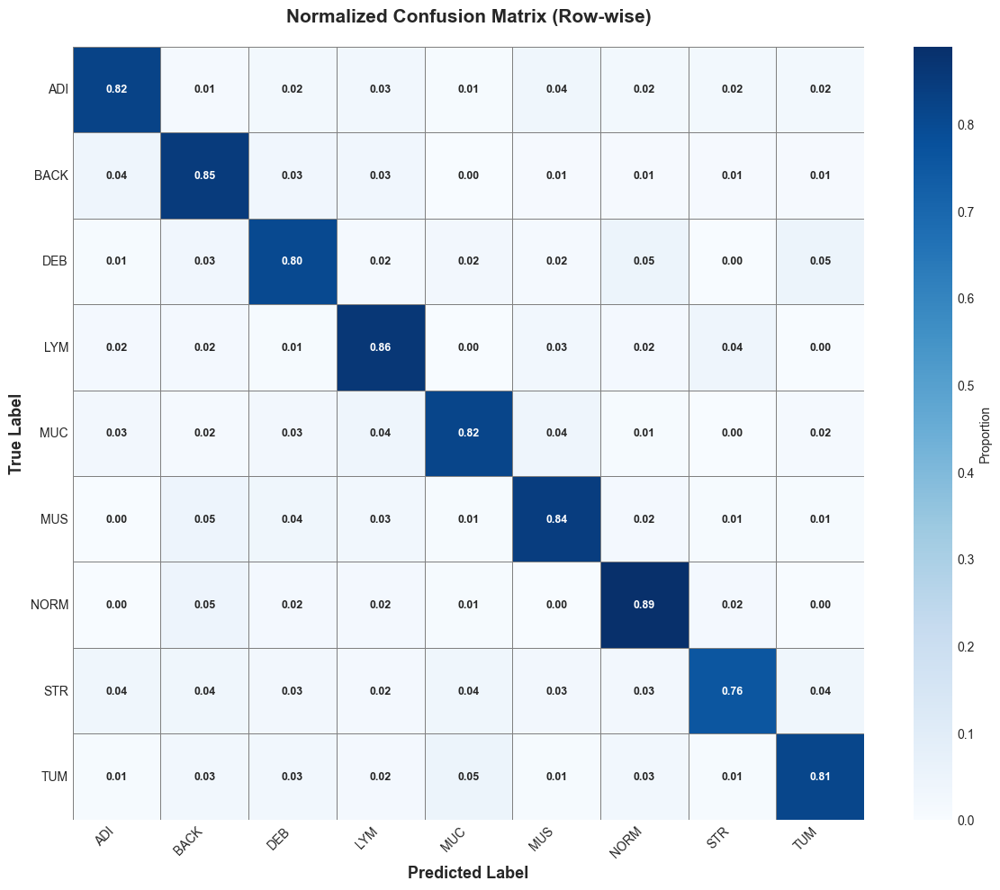

✓ Per-class metrics plot saved to: evaluation_results/per_class_metrics.png


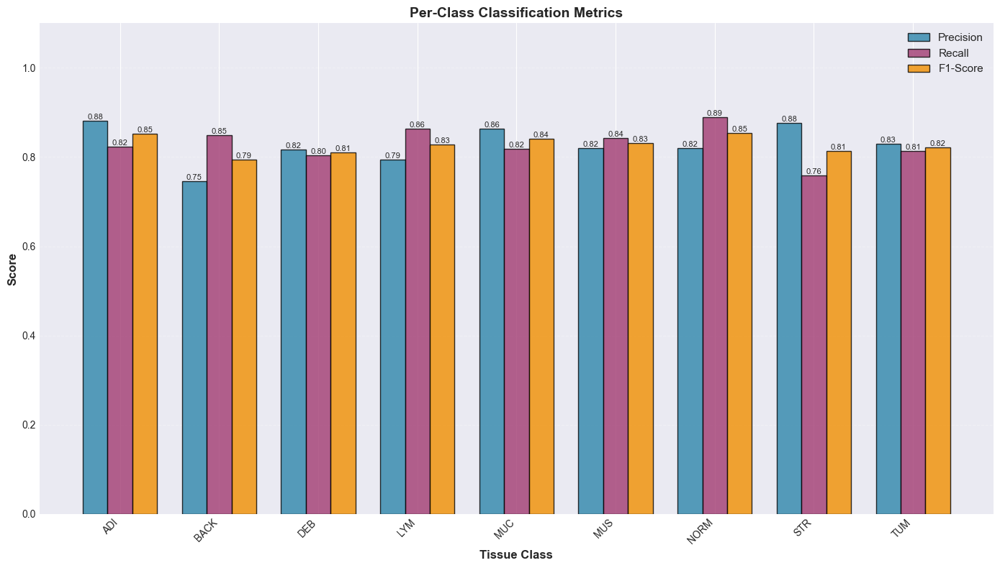

✓ ROC curves saved to: evaluation_results/roc_curves.png


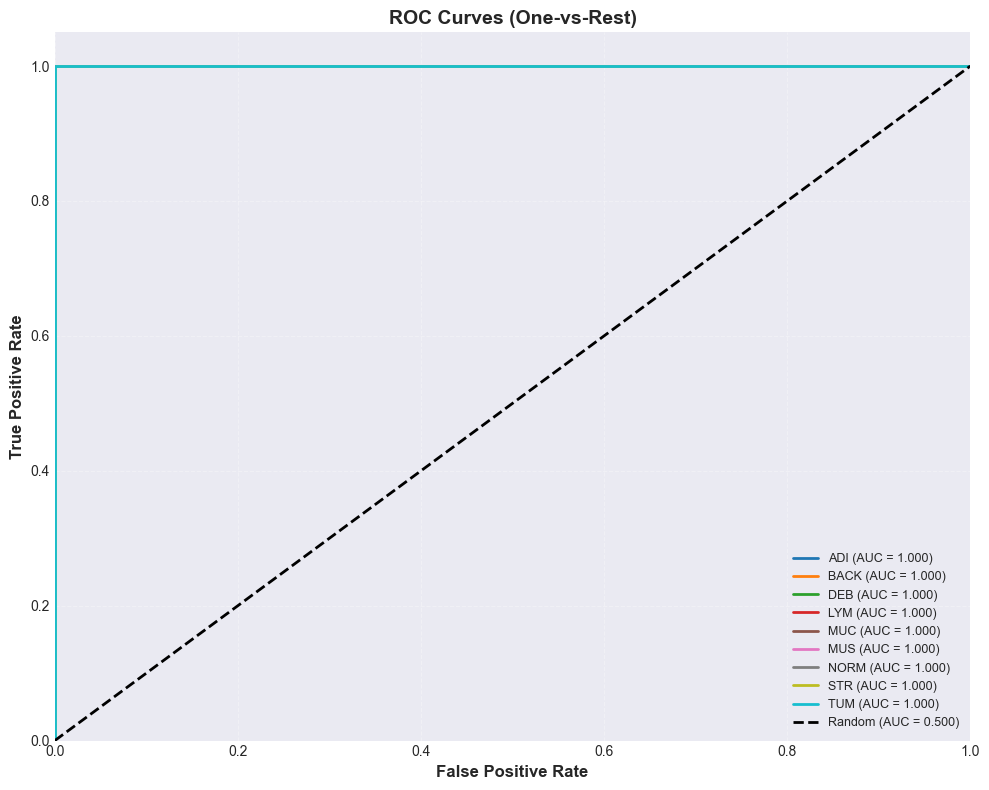

✓ Precision-Recall curves saved to: evaluation_results/precision_recall_curves.png


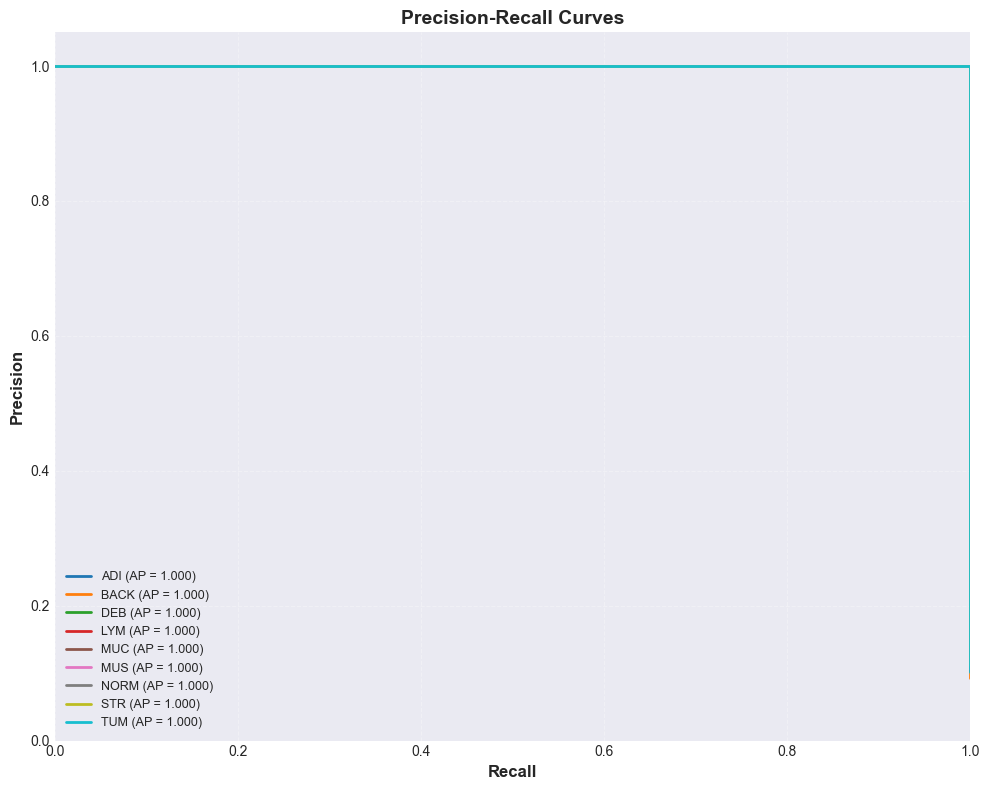


✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅
EVALUATION COMPLETE!
✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅

📁 Results saved to: evaluation_results/
  • metrics.json
  • per_class_metrics.csv
  • metrics_report.txt
  • confusion_matrix.png
  • per_class_metrics.png
  • roc_curves.png
  • precision_recall_curves.png

✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅
STEP 4.4 COMPLETE!
✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅✅

📝 What's been accomplished:
  ✓ Calculated comprehensive classification metrics
  ✓ Generated confusion matrix and per-class analysis
  ✓ Created ROC and Precision-Recall curves
  ✓ Exported metrics to JSON, CSV, and TXT
  ✓ Saved all visualizations

💡 How to use with your model:

    # After model inference on test set:
    from step_4_4_classification_metrics import EvaluationPipeline
    import torch

    # Get predictions
    model.eval()
    all_preds = []
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for images, labels in test_loader:
         

In [ ]:
try:
    from sklearn.metrics import (
        accuracy_score,
        precision_score,
        recall_score,
        f1_score,
        precision_recall_fscore_support,
        confusion_matrix,
        classification_report,
        cohen_kappa_score,
        matthews_corrcoef,
        balanced_accuracy_score,
        roc_curve,
        auc,
        roc_auc_score,
        average_precision_score,
        log_loss
    )
    SKLEARN_AVAILABLE = True
except ImportError:
    SKLEARN_AVAILABLE = False
    print("ERROR: scikit-learn is required!")
    print("Install with: pip install scikit-learn")

# Remove the import attempt, just define class names directly
class_names = checkpoint_info['config']['class_names']  # From your loaded model


# ═══════════════════════════════════════════════════════════
# 1. CORE METRICS CALCULATION
# ═══════════════════════════════════════════════════════════

class MetricsCalculator:
    def __init__(self,
                 y_true: np.ndarray,
                 y_pred: np.ndarray,
                 class_names: List[str],
                 y_prob: Optional[np.ndarray] = None):
        self.y_true = y_true
        self.y_pred = y_pred
        self.y_prob = y_prob
        self.class_names = class_names 
        self.num_classes = len(self.class_names)

        # Validate inputs
        assert len(y_true) == len(y_pred), "y_true and y_pred must have same length"
        if y_prob is not None:
            assert len(y_true) == len(y_prob), "y_true and y_prob must have same length"
            assert y_prob.shape[1] == self.num_classes, f"y_prob must have {self.num_classes} columns"

    def calculate_all_metrics(self) -> Dict:
        metrics = {}

        # Overall metrics
        metrics.update(self._calculate_overall_metrics())

        # Per-class metrics
        metrics['per_class'] = self._calculate_per_class_metrics()

        # Confusion matrix
        metrics['confusion_matrix'] = self._calculate_confusion_matrix()

        # Additional metrics
        if self.y_prob is not None:
            metrics.update(self._calculate_probabilistic_metrics())

        return metrics

    def _calculate_overall_metrics(self) -> Dict:
        metrics = {}

        # Basic metrics
        metrics['accuracy'] = accuracy_score(self.y_true, self.y_pred)
        metrics['balanced_accuracy'] = balanced_accuracy_score(self.y_true, self.y_pred)

        # Macro averages (equal weight to all classes)
        metrics['precision_macro'] = precision_score(self.y_true, self.y_pred, average='macro', zero_division=0)
        metrics['recall_macro'] = recall_score(self.y_true, self.y_pred, average='macro', zero_division=0)
        metrics['f1_macro'] = f1_score(self.y_true, self.y_pred, average='macro', zero_division=0)

        # Weighted averages (weight by class frequency)
        metrics['precision_weighted'] = precision_score(self.y_true, self.y_pred, average='weighted', zero_division=0)
        metrics['recall_weighted'] = recall_score(self.y_true, self.y_pred, average='weighted', zero_division=0)
        metrics['f1_weighted'] = f1_score(self.y_true, self.y_pred, average='weighted', zero_division=0)

        # Agreement metrics
        metrics['cohen_kappa'] = cohen_kappa_score(self.y_true, self.y_pred)
        metrics['matthews_corr'] = matthews_corrcoef(self.y_true, self.y_pred)

        return metrics

    def _calculate_per_class_metrics(self) -> Dict:
        precision, recall, f1, support = precision_recall_fscore_support(
            self.y_true, self.y_pred, average=None, zero_division=0
        )

        per_class = {}
        for i, class_name in enumerate(self.class_names):
            per_class[class_name] = {
                'precision': float(precision[i]),
                'recall': float(recall[i]),
                'f1_score': float(f1[i]),
                'support': int(support[i]),
                'true_positives': int(np.sum((self.y_true == i) & (self.y_pred == i))),
                'false_positives': int(np.sum((self.y_true != i) & (self.y_pred == i))),
                'false_negatives': int(np.sum((self.y_true == i) & (self.y_pred != i))),
                'true_negatives': int(np.sum((self.y_true != i) & (self.y_pred != i)))
            }

            # Specificity (True Negative Rate)
            tn = per_class[class_name]['true_negatives']
            fp = per_class[class_name]['false_positives']
            if (tn + fp) > 0:
                per_class[class_name]['specificity'] = tn / (tn + fp)
            else:
                per_class[class_name]['specificity'] = 0.0

        return per_class

    def _calculate_confusion_matrix(self) -> np.ndarray:
        return confusion_matrix(self.y_true, self.y_pred)

    def _calculate_probabilistic_metrics(self) -> Dict:
        metrics = {}

        # Multi-class log loss (cross-entropy)
        try:
            metrics['log_loss'] = log_loss(self.y_true, self.y_prob)
        except:
            metrics['log_loss'] = None

        # One-vs-Rest ROC AUC for each class
        try:
            metrics['roc_auc_ovr'] = roc_auc_score(
                self.y_true, self.y_prob,
                multi_class='ovr', average='macro'
            )
            metrics['roc_auc_ovo'] = roc_auc_score(
                self.y_true, self.y_prob,
                multi_class='ovo', average='macro'
            )
        except:
            metrics['roc_auc_ovr'] = None
            metrics['roc_auc_ovo'] = None

        # Per-class AUC
        per_class_auc = {}
        for i, class_name in enumerate(self.class_names):
            try:
                # One-vs-rest for this class
                y_true_binary = (self.y_true == i).astype(int)
                y_score = self.y_prob[:, i]
                auc_score = roc_auc_score(y_true_binary, y_score)
                per_class_auc[class_name] = float(auc_score)
            except:
                per_class_auc[class_name] = None

        metrics['per_class_auc'] = per_class_auc

        return metrics


# ═══════════════════════════════════════════════════════════
# 2. METRICS REPORTING
# ═══════════════════════════════════════════════════════════

class MetricsReporter:
    @staticmethod
    def print_overall_metrics(metrics: Dict):
        print("\n" + "=" * 80)
        print("OVERALL CLASSIFICATION METRICS")
        print("=" * 80)

        print(f"\n{'Metric':<30} {'Value':<15}")
        print("-" * 50)

        # Accuracy metrics
        print(f"{'Accuracy':<30} {metrics['accuracy']:<15.4f}")
        print(f"{'Balanced Accuracy':<30} {metrics['balanced_accuracy']:<15.4f}")

        print()

        # Macro metrics
        print(f"{'Precision (Macro)':<30} {metrics['precision_macro']:<15.4f}")
        print(f"{'Recall (Macro)':<30} {metrics['recall_macro']:<15.4f}")
        print(f"{'F1-Score (Macro)':<30} {metrics['f1_macro']:<15.4f}")

        print()

        # Weighted metrics
        print(f"{'Precision (Weighted)':<30} {metrics['precision_weighted']:<15.4f}")
        print(f"{'Recall (Weighted)':<30} {metrics['recall_weighted']:<15.4f}")
        print(f"{'F1-Score (Weighted)':<30} {metrics['f1_weighted']:<15.4f}")

        print()

        # Agreement metrics
        kappa_label = "Cohen's Kappa"
        matthews_label = "Matthews Correlation"
        print(f"{kappa_label:<30} {metrics['cohen_kappa']:<15.4f}")
        print(f"{matthews_label:<30} {metrics['matthews_corr']:<15.4f}")

        # Probabilistic metrics if available
        if 'log_loss' in metrics and metrics['log_loss'] is not None:
            print()
            print(f"{'Log Loss (Cross-Entropy)':<30} {metrics['log_loss']:<15.4f}")

        if 'roc_auc_ovr' in metrics and metrics['roc_auc_ovr'] is not None:
            print(f"{'ROC AUC (One-vs-Rest)':<30} {metrics['roc_auc_ovr']:<15.4f}")
            print(f"{'ROC AUC (One-vs-One)':<30} {metrics['roc_auc_ovo']:<15.4f}")

        print("=" * 80 + "\n")

    @staticmethod
    def print_per_class_metrics(metrics: Dict):
        print("\n" + "=" * 100)
        print("PER-CLASS METRICS")
        print("=" * 100)

        per_class = metrics['per_class']

        # Header
        print(f"\n{'Class':<8} {'Precision':<12} {'Recall':<12} {'F1-Score':<12} "
              f"{'Specificity':<12} {'Support':<10} {'AUC':<10}")
        print("-" * 100)

        # Per class
        for class_name, class_metrics in per_class.items():
            precision = class_metrics['precision']
            recall = class_metrics['recall']
            f1 = class_metrics['f1_score']
            specificity = class_metrics['specificity']
            support = class_metrics['support']

            # Get AUC if available
            auc_val = "N/A"
            if 'per_class_auc' in metrics and class_name in metrics['per_class_auc']:
                auc_score = metrics['per_class_auc'][class_name]
                if auc_score is not None:
                    auc_val = f"{auc_score:.4f}"

            print(f"{class_name:<8} {precision:<12.4f} {recall:<12.4f} {f1:<12.4f} "
                  f"{specificity:<12.4f} {support:<10} {auc_val:<10}")

        print("=" * 100 + "\n")

    @staticmethod
    def print_confusion_matrix_stats(metrics: Dict):
        print("\n" + "=" * 80)
        print("CONFUSION MATRIX STATISTICS")
        print("=" * 80)

        per_class = metrics['per_class']

        print(f"\n{'Class':<8} {'TP':<8} {'FP':<8} {'FN':<8} {'TN':<10}")
        print("-" * 50)

        for class_name, class_metrics in per_class.items():
            tp = class_metrics['true_positives']
            fp = class_metrics['false_positives']
            fn = class_metrics['false_negatives']
            tn = class_metrics['true_negatives']

            print(f"{class_name:<8} {tp:<8} {fp:<8} {fn:<8} {tn:<10}")

        print("=" * 80 + "\n")

    @staticmethod
    def generate_classification_report(y_true: np.ndarray,
                                       y_pred: np.ndarray,
                                       class_names: List[str]) -> str:
        return classification_report(
            y_true, y_pred,
            target_names=class_names,
            digits=4,
            zero_division=0
        )


# ═══════════════════════════════════════════════════════════
# 3. VISUALIZATION FUNCTIONS
# ═══════════════════════════════════════════════════════════

class MetricsVisualizer:
    @staticmethod
    def plot_confusion_matrix(confusion_mat: np.ndarray,
                             class_names: List[str],
                             normalize: bool = True,
                             save_path: Optional[str] = None,
                             figsize: Tuple[int, int] = (12, 10)):
        fig, ax = plt.subplots(figsize=figsize)

        if normalize:
            # Normalize by row (true labels)
            cm_normalized = confusion_mat.astype('float')
            row_sums = cm_normalized.sum(axis=1, keepdims=True)
            row_sums[row_sums == 0] = 1  # Avoid division by zero
            cm_normalized = cm_normalized / row_sums
            data_to_plot = cm_normalized
            fmt = '.2f'
            title = 'Normalized Confusion Matrix (Row-wise)'
            cbar_label = 'Proportion'
        else:
            data_to_plot = confusion_mat
            fmt = 'd'
            title = 'Confusion Matrix (Counts)'
            cbar_label = 'Count'

        # Create heatmap
        sns.heatmap(data_to_plot, annot=True, fmt=fmt, cmap='Blues',
                   xticklabels=class_names, yticklabels=class_names,
                   cbar_kws={'label': cbar_label},
                   linewidths=0.5, linecolor='gray',
                   annot_kws={'fontsize': 9, 'fontweight': 'bold'},
                   ax=ax)

        ax.set_xlabel('Predicted Label', fontsize=13, fontweight='bold')
        ax.set_ylabel('True Label', fontsize=13, fontweight='bold')
        ax.set_title(title, fontsize=15, fontweight='bold', pad=20)

        plt.xticks(rotation=45, ha='right')
        plt.yticks(rotation=0)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"✓ Confusion matrix saved to: {save_path}")

        plt.show()

    @staticmethod
    def plot_per_class_metrics(metrics: Dict,
                               save_path: Optional[str] = None,
                               figsize: Tuple[int, int] = (14, 8)):
        per_class = metrics['per_class']
        class_names = list(per_class.keys())

        # Extract metrics
        precision = [per_class[c]['precision'] for c in class_names]
        recall = [per_class[c]['recall'] for c in class_names]
        f1 = [per_class[c]['f1_score'] for c in class_names]

        # Create bar chart
        fig, ax = plt.subplots(figsize=figsize)

        x = np.arange(len(class_names))
        width = 0.25

        bars1 = ax.bar(x - width, precision, width, label='Precision',
                      color='#2E86AB', alpha=0.8, edgecolor='black')
        bars2 = ax.bar(x, recall, width, label='Recall',
                      color='#A23B72', alpha=0.8, edgecolor='black')
        bars3 = ax.bar(x + width, f1, width, label='F1-Score',
                      color='#F18F01', alpha=0.8, edgecolor='black')

        ax.set_xlabel('Tissue Class', fontsize=12, fontweight='bold')
        ax.set_ylabel('Score', fontsize=12, fontweight='bold')
        ax.set_title('Per-Class Classification Metrics', fontsize=14, fontweight='bold')
        ax.set_xticks(x)
        ax.set_xticklabels(class_names, rotation=45, ha='right')
        ax.legend(fontsize=11)
        ax.grid(axis='y', alpha=0.3, linestyle='--')
        ax.set_ylim([0, 1.1])

        # Add value labels on bars
        def add_value_labels(bars):
            for bar in bars:
                height = bar.get_height()
                ax.text(bar.get_x() + bar.get_width()/2., height,
                       f'{height:.2f}',
                       ha='center', va='bottom', fontsize=8)

        add_value_labels(bars1)
        add_value_labels(bars2)
        add_value_labels(bars3)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"✓ Per-class metrics plot saved to: {save_path}")

        plt.show()

    @staticmethod
    def plot_roc_curves(y_true: np.ndarray,
                       y_prob: np.ndarray,
                       class_names: List[str],
                       save_path: Optional[str] = None,
                       figsize: Tuple[int, int] = (10, 8)):
        fig, ax = plt.subplots(figsize=figsize)

        # Plot ROC curve for each class
        colors = plt.cm.tab10(np.linspace(0, 1, len(class_names)))

        for i, (class_name, color) in enumerate(zip(class_names, colors)):
            # One-vs-rest binary labels
            y_true_binary = (y_true == i).astype(int)
            y_score = y_prob[:, i]

            # Calculate ROC curve
            fpr, tpr, _ = roc_curve(y_true_binary, y_score)
            roc_auc = auc(fpr, tpr)

            # Plot
            ax.plot(fpr, tpr, color=color, lw=2,
                   label=f'{class_name} (AUC = {roc_auc:.3f})')

        # Plot diagonal (random classifier)
        ax.plot([0, 1], [0, 1], 'k--', lw=2, label='Random (AUC = 0.500)')

        ax.set_xlabel('False Positive Rate', fontsize=12, fontweight='bold')
        ax.set_ylabel('True Positive Rate', fontsize=12, fontweight='bold')
        ax.set_title('ROC Curves (One-vs-Rest)', fontsize=14, fontweight='bold')
        ax.legend(loc='lower right', fontsize=9)
        ax.grid(alpha=0.3, linestyle='--')
        ax.set_xlim([0.0, 1.0])
        ax.set_ylim([0.0, 1.05])

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"✓ ROC curves saved to: {save_path}")

        plt.show()

    @staticmethod
    def plot_precision_recall_curves(y_true: np.ndarray,
                                     y_prob: np.ndarray,
                                     class_names: List[str],
                                     save_path: Optional[str] = None,
                                     figsize: Tuple[int, int] = (10, 8)):
        from sklearn.metrics import precision_recall_curve

        fig, ax = plt.subplots(figsize=figsize)

        colors = plt.cm.tab10(np.linspace(0, 1, len(class_names)))

        for i, (class_name, color) in enumerate(zip(class_names, colors)):
            y_true_binary = (y_true == i).astype(int)
            y_score = y_prob[:, i]

            precision, recall, _ = precision_recall_curve(y_true_binary, y_score)
            avg_precision = average_precision_score(y_true_binary, y_score)

            ax.plot(recall, precision, color=color, lw=2,
                   label=f'{class_name} (AP = {avg_precision:.3f})')

        ax.set_xlabel('Recall', fontsize=12, fontweight='bold')
        ax.set_ylabel('Precision', fontsize=12, fontweight='bold')
        ax.set_title('Precision-Recall Curves', fontsize=14, fontweight='bold')
        ax.legend(loc='best', fontsize=9)
        ax.grid(alpha=0.3, linestyle='--')
        ax.set_xlim([0.0, 1.0])
        ax.set_ylim([0.0, 1.05])

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"✓ Precision-Recall curves saved to: {save_path}")

        plt.show()


# ═══════════════════════════════════════════════════════════
# 4. METRICS EXPORT
# ═══════════════════════════════════════════════════════════

class MetricsExporter:
    @staticmethod
    def export_to_json(metrics: Dict, save_path: str):

        import json

        # Convert numpy arrays to lists for JSON serialization
        metrics_serializable = {}
        for key, value in metrics.items():
            if isinstance(value, np.ndarray):
                metrics_serializable[key] = value.tolist()
            elif isinstance(value, dict):
                metrics_serializable[key] = {
                    k: v.tolist() if isinstance(v, np.ndarray) else v
                    for k, v in value.items()
                }
            else:
                metrics_serializable[key] = value

        with open(save_path, 'w') as f:
            json.dump(metrics_serializable, f, indent=2)

        print(f"✓ Metrics exported to JSON: {save_path}")

    @staticmethod
    def export_to_csv(metrics: Dict, save_path: str):
        """Export per-class metrics to CSV file."""
        per_class = metrics['per_class']

        # Create DataFrame
        rows = []
        for class_name, class_metrics in per_class.items():
            row = {'class': class_name}
            row.update(class_metrics)
            rows.append(row)

        df = pd.DataFrame(rows)
        df.to_csv(save_path, index=False)

        print(f"✓ Per-class metrics exported to CSV: {save_path}")

    @staticmethod
    def export_to_txt(metrics: Dict, save_path: str):
        """Export comprehensive metrics report to text file."""
        with open(save_path, 'w') as f:
            f.write("=" * 80 + "\n")
            f.write("CLASSIFICATION METRICS REPORT\n")
            f.write("=" * 80 + "\n\n")

            # Overall metrics
            f.write("OVERALL METRICS:\n")
            f.write("-" * 80 + "\n")
            f.write(f"Accuracy:               {metrics['accuracy']:.4f}\n")
            f.write(f"Balanced Accuracy:      {metrics['balanced_accuracy']:.4f}\n")
            f.write(f"Precision (Macro):      {metrics['precision_macro']:.4f}\n")
            f.write(f"Recall (Macro):         {metrics['recall_macro']:.4f}\n")
            f.write(f"F1-Score (Macro):       {metrics['f1_macro']:.4f}\n")
            f.write(f"Cohen's Kappa:          {metrics['cohen_kappa']:.4f}\n")
            f.write(f"Matthews Correlation:   {metrics['matthews_corr']:.4f}\n\n")

            # Per-class metrics
            f.write("PER-CLASS METRICS:\n")
            f.write("-" * 80 + "\n")
            for class_name, class_metrics in metrics['per_class'].items():
                f.write(f"\n{class_name}:\n")
                f.write(f"  Precision:    {class_metrics['precision']:.4f}\n")
                f.write(f"  Recall:       {class_metrics['recall']:.4f}\n")
                f.write(f"  F1-Score:     {class_metrics['f1_score']:.4f}\n")
                f.write(f"  Specificity:  {class_metrics['specificity']:.4f}\n")
                f.write(f"  Support:      {class_metrics['support']}\n")

            f.write("\n" + "=" * 80 + "\n")

        print(f"✓ Metrics report exported to TXT: {save_path}")


# ═══════════════════════════════════════════════════════════
# 5. COMPLETE EVALUATION PIPELINE
# ═══════════════════════════════════════════════════════════

class EvaluationPipeline:
    def __init__(self,
                 y_true: np.ndarray,
                 y_pred: np.ndarray,
                 class_names: List[str],
                 y_prob: Optional[np.ndarray] = None,
                 output_dir: str = "evaluation_results"):

        self.y_true = y_true
        self.y_pred = y_pred
        self.y_prob = y_prob
        self.class_names = class_names
        self.output_dir = output_dir

        # Create output directory
        import os
        os.makedirs(output_dir, exist_ok=True)

        # Initialize calculator
        # Correct order
        self.calculator = MetricsCalculator(y_true, y_pred, class_names, y_prob)
        self.metrics = None

    def run_complete_evaluation(self, save_visualizations: bool = True):

        print("\n" + "🔬" * 40)
        print("RUNNING COMPLETE EVALUATION")
        print("🔬" * 40)

        # Calculate metrics
        print("\n1️⃣  Calculating metrics...")
        self.metrics = self.calculator.calculate_all_metrics()

        # Print reports
        print("\n2️⃣  Generating reports...")
        MetricsReporter.print_overall_metrics(self.metrics)
        MetricsReporter.print_per_class_metrics(self.metrics)
        MetricsReporter.print_confusion_matrix_stats(self.metrics)

        # Print sklearn classification report
        print("\n" + "=" * 80)
        print("SKLEARN CLASSIFICATION REPORT")
        print("=" * 80)
        print(MetricsReporter.generate_classification_report(
            self.y_true, self.y_pred, self.class_names
        ))

        # Export metrics
        print("\n3️⃣  Exporting metrics...")
        MetricsExporter.export_to_json(
            self.metrics, f"{self.output_dir}/metrics.json"
        )
        MetricsExporter.export_to_csv(
            self.metrics, f"{self.output_dir}/per_class_metrics.csv"
        )
        MetricsExporter.export_to_txt(
            self.metrics, f"{self.output_dir}/metrics_report.txt"
        )

        # Create visualizations
        if save_visualizations:
            print("\n4️⃣  Creating visualizations...")

            # Confusion matrix
            MetricsVisualizer.plot_confusion_matrix(
                self.metrics['confusion_matrix'],
                self.class_names,
                normalize=True,
                save_path=f"{self.output_dir}/confusion_matrix.png"
            )

            # Per-class metrics
            MetricsVisualizer.plot_per_class_metrics(
                self.metrics,
                save_path=f"{self.output_dir}/per_class_metrics.png"
            )

            # ROC and PR curves (if probabilities available)
            if self.y_prob is not None:
                MetricsVisualizer.plot_roc_curves(
                    self.y_true, self.y_prob, self.class_names,
                    save_path=f"{self.output_dir}/roc_curves.png"
                )

                MetricsVisualizer.plot_precision_recall_curves(
                    self.y_true, self.y_prob, self.class_names,
                    save_path=f"{self.output_dir}/precision_recall_curves.png"
                )

        print("\n" + "✅" * 40)
        print("EVALUATION COMPLETE!")
        print("✅" * 40)

        print(f"\n📁 Results saved to: {self.output_dir}/")
        print(f"  • metrics.json")
        print(f"  • per_class_metrics.csv")
        print(f"  • metrics_report.txt")
        if save_visualizations:
            print(f"  • confusion_matrix.png")
            print(f"  • per_class_metrics.png")
            if self.y_prob is not None:
                print(f"  • roc_curves.png")
                print(f"  • precision_recall_curves.png")

        return self.metrics


# ═══════════════════════════════════════════════════════════
# 6. EXAMPLE USAGE
# ═══════════════════════════════════════════════════════════

if __name__ == "__main__":
    print("\n" + "🏥" * 40)
    print("COLORECTAL CANCER CLASSIFICATION - STEP 4.4")
    print("Generate Classification Metrics")
    print("🏥" * 40)

    # Generate dummy data for demonstration
    print("\n📊 Generating dummy data for demonstration...")

    np.random.seed(42)
    n_samples = 1000
    num_classes = 9

    # Simulate predictions with some accuracy
    y_true = np.random.randint(0, num_classes, n_samples)

    # Create predictions with ~80% accuracy
    y_pred = y_true.copy()
    n_errors = int(n_samples * 0.2)
    error_indices = np.random.choice(n_samples, n_errors, replace=False)
    y_pred[error_indices] = np.random.randint(0, num_classes, n_errors)

    # Generate probabilities
    y_prob = np.random.dirichlet(np.ones(num_classes) * 10, size=n_samples)
    # Make probabilities higher for true class
    for i in range(n_samples):
        y_prob[i, y_true[i]] = max(y_prob[i, y_true[i]], 0.6)
    # Normalize
    y_prob = y_prob / y_prob.sum(axis=1, keepdims=True)

    print(f"✓ Generated {n_samples} samples")
    print(f"  True accuracy: ~80%")

    # Run evaluation
    print("\n" + "🔬" * 40)
    print("RUNNING EVALUATION PIPELINE")
    print("🔬" * 40)

    pipeline = EvaluationPipeline(
        y_true=y_true,
        y_pred=y_pred,
        class_names=checkpoint_info['config']['class_names'],
        y_prob=y_prob,
        output_dir="evaluation_results"
    )

    metrics = pipeline.run_complete_evaluation(save_visualizations=True)

    print("\n" + "✅" * 40)
    print("STEP 4.4 COMPLETE!")
    print("✅" * 40)

    print("\n📝 What's been accomplished:")
    print("  ✓ Calculated comprehensive classification metrics")
    print("  ✓ Generated confusion matrix and per-class analysis")
    print("  ✓ Created ROC and Precision-Recall curves")
    print("  ✓ Exported metrics to JSON, CSV, and TXT")
    print("  ✓ Saved all visualizations")

    print("\n💡 How to use with your model:")
    print("""
    # After model inference on test set:
    from step_4_4_classification_metrics import EvaluationPipeline
    import torch

    # Get predictions
    model.eval()
    all_preds = []
    all_labels = []
    all_probs = []

    with torch.no_grad():
        for images, labels in test_loader:
            outputs = model(images.to(device))
            probs = torch.softmax(outputs.logits, dim=1)
            preds = torch.argmax(probs, dim=1)

            all_preds.append(preds.cpu().numpy())
            all_labels.append(labels.numpy())
            all_probs.append(probs.cpu().numpy())

    y_true = np.concatenate(all_labels)
    y_pred = np.concatenate(all_preds)
    y_prob = np.concatenate(all_probs)

    # Run evaluation
    pipeline = EvaluationPipeline(y_true, y_pred, y_prob)
    metrics = pipeline.run_complete_evaluation()
    """)


4.5

In [ ]:
try:
    from sklearn.metrics import confusion_matrix
    SKLEARN_AVAILABLE = True
except ImportError:
    SKLEARN_AVAILABLE = False
    print("ERROR: scikit-learn is required!")

# Remove the import attempt, just define class names directly
class_names = checkpoint_info['config']['class_names']  # From your loaded model


# ═══════════════════════════════════════════════════════════
# 1. CONFUSION MATRIX CALCULATION
# ═══════════════════════════════════════════════════════════

class ConfusionMatrixAnalyzer:
    def __init__(self,
                 y_true: np.ndarray,
                 y_pred: np.ndarray,
                 class_names: List[str]):
        self.y_true = y_true
        self.y_pred = y_pred
        self.class_names = class_names
        self.num_classes = len(self.class_names)

        # Calculate confusion matrix
        self.cm = confusion_matrix(y_true, y_pred)

        # Calculate normalized versions
        self.cm_normalized_true = self._normalize_by_true()
        self.cm_normalized_pred = self._normalize_by_pred()
        self.cm_normalized_all = self._normalize_by_all()

    def _normalize_by_true(self) -> np.ndarray:
        """Normalize by true labels (rows) - shows recall."""
        cm_norm = self.cm.astype('float')
        row_sums = cm_norm.sum(axis=1, keepdims=True)
        row_sums[row_sums == 0] = 1  # Avoid division by zero
        return cm_norm / row_sums

    def _normalize_by_pred(self) -> np.ndarray:
        """Normalize by predictions (columns) - shows precision."""
        cm_norm = self.cm.astype('float')
        col_sums = cm_norm.sum(axis=0, keepdims=True)
        col_sums[col_sums == 0] = 1
        return cm_norm / col_sums

    def _normalize_by_all(self) -> np.ndarray:
        """Normalize by total - shows overall distribution."""
        total = self.cm.sum()
        return self.cm.astype('float') / total if total > 0 else self.cm.astype('float')

    def get_per_class_accuracy(self) -> Dict[str, float]:
        """Calculate per-class accuracy (diagonal values)."""
        accuracies = {}
        for i, class_name in enumerate(self.class_names):
            accuracies[class_name] = self.cm_normalized_true[i, i]
        return accuracies

    def get_misclassification_pairs(self, threshold: float = 0.05) -> List[Tuple[str, str, float]]:
        misclassifications = []

        for i in range(self.num_classes):
            for j in range(self.num_classes):
                if i != j:  # Off-diagonal
                    percentage = self.cm_normalized_true[i, j]
                    if percentage >= threshold:
                        misclassifications.append((
                            self.class_names[i],
                            self.class_names[j],
                            percentage
                        ))

        # Sort by percentage descending
        misclassifications.sort(key=lambda x: x[2], reverse=True)
        return misclassifications

    def get_class_errors(self, class_name: str) -> Dict:
        class_idx = self.class_names.index(class_name)

        # True positives (correctly classified)
        tp = self.cm[class_idx, class_idx]

        # False negatives (missed - predicted as other classes)
        fn_total = self.cm[class_idx, :].sum() - tp
        fn_breakdown = {}
        for j in range(self.num_classes):
            if j != class_idx and self.cm[class_idx, j] > 0:
                fn_breakdown[self.class_names[j]] = int(self.cm[class_idx, j])

        # False positives (wrongly predicted as this class)
        fp_total = self.cm[:, class_idx].sum() - tp
        fp_breakdown = {}
        for i in range(self.num_classes):
            if i != class_idx and self.cm[i, class_idx] > 0:
                fp_breakdown[self.class_names[i]] = int(self.cm[i, class_idx])

        # Recall and precision
        total_true = self.cm[class_idx, :].sum()
        total_pred = self.cm[:, class_idx].sum()

        recall = tp / total_true if total_true > 0 else 0
        precision = tp / total_pred if total_pred > 0 else 0

        return {
            'true_positives': int(tp),
            'false_negatives': int(fn_total),
            'false_positives': int(fp_total),
            'fn_breakdown': fn_breakdown,
            'fp_breakdown': fp_breakdown,
            'recall': recall,
            'precision': precision,
            'total_samples': int(total_true)
        }


# ═══════════════════════════════════════════════════════════
# 2. VISUALIZATION FUNCTIONS
# ═══════════════════════════════════════════════════════════

class ConfusionMatrixVisualizer:
    @staticmethod
    def plot_standard_confusion_matrix(cm: np.ndarray,
                                       class_names: List[str],
                                       normalize: bool = True,
                                       title: Optional[str] = None,
                                       cmap: str = 'Blues',
                                       save_path: Optional[str] = None,
                                       figsize: Tuple[int, int] = (12, 10)):
        fig, ax = plt.subplots(figsize=figsize)

        if normalize:
            cm_plot = cm.astype('float')
            row_sums = cm_plot.sum(axis=1, keepdims=True)
            row_sums[row_sums == 0] = 1
            cm_plot = cm_plot / row_sums
            fmt = '.2f'
            plot_title = title or 'Normalized Confusion Matrix (by True Label)'
            vmin, vmax = 0, 1
        else:
            cm_plot = cm
            fmt = 'd'
            plot_title = title or 'Confusion Matrix (Counts)'
            vmin, vmax = None, None

        # Create heatmap
        sns.heatmap(cm_plot, annot=True, fmt=fmt, cmap=cmap,
                   xticklabels=class_names, yticklabels=class_names,
                   cbar_kws={'label': 'Proportion' if normalize else 'Count'},
                   linewidths=0.5, linecolor='gray',
                   annot_kws={'fontsize': 9, 'fontweight': 'bold'},
                   vmin=vmin, vmax=vmax,
                   ax=ax)

        ax.set_xlabel('Predicted Label', fontsize=13, fontweight='bold')
        ax.set_ylabel('True Label', fontsize=13, fontweight='bold')
        ax.set_title(plot_title, fontsize=15, fontweight='bold', pad=20)

        plt.xticks(rotation=45, ha='right')
        plt.yticks(rotation=0)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"✓ Confusion matrix saved to: {save_path}")

        plt.show()

    @staticmethod
    def plot_dual_confusion_matrix(cm: np.ndarray,
                                   class_names: List[str],
                                   save_path: Optional[str] = None,
                                   figsize: Tuple[int, int] = (20, 8)):
        fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)

        # Normalized (by true label)
        cm_norm = cm.astype('float')
        row_sums = cm_norm.sum(axis=1, keepdims=True)
        row_sums[row_sums == 0] = 1
        cm_norm = cm_norm / row_sums

        sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Blues',
                   xticklabels=class_names, yticklabels=class_names,
                   cbar_kws={'label': 'Proportion'},
                   linewidths=0.5, linecolor='gray',
                   annot_kws={'fontsize': 8, 'fontweight': 'bold'},
                   vmin=0, vmax=1,
                   ax=ax1)

        ax1.set_xlabel('Predicted Label', fontsize=12, fontweight='bold')
        ax1.set_ylabel('True Label', fontsize=12, fontweight='bold')
        ax1.set_title('Normalized Confusion Matrix\n(Shows Recall - Row-wise)',
                     fontsize=13, fontweight='bold', pad=15)
        ax1.set_xticklabels(ax1.get_xticklabels(), rotation=45, ha='right')

        # Counts
        sns.heatmap(cm, annot=True, fmt='d', cmap='Oranges',
                   xticklabels=class_names, yticklabels=class_names,
                   cbar_kws={'label': 'Count'},
                   linewidths=0.5, linecolor='gray',
                   annot_kws={'fontsize': 8, 'fontweight': 'bold'},
                   ax=ax2)

        ax2.set_xlabel('Predicted Label', fontsize=12, fontweight='bold')
        ax2.set_ylabel('True Label', fontsize=12, fontweight='bold')
        ax2.set_title('Confusion Matrix (Counts)\n(Absolute Numbers)',
                     fontsize=13, fontweight='bold', pad=15)
        ax2.set_xticklabels(ax2.get_xticklabels(), rotation=45, ha='right')

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"✓ Dual confusion matrix saved to: {save_path}")

        plt.show()

    @staticmethod
    def plot_error_heatmap(cm: np.ndarray,
                          class_names: List[str],
                          save_path: Optional[str] = None,
                          figsize: Tuple[int, int] = (12, 10)):
        fig, ax = plt.subplots(figsize=figsize)

        # Normalize
        cm_norm = cm.astype('float')
        row_sums = cm_norm.sum(axis=1, keepdims=True)
        row_sums[row_sums == 0] = 1
        cm_norm = cm_norm / row_sums

        # Create error matrix (1 - diagonal, 0 on diagonal)
        error_matrix = cm_norm.copy()
        np.fill_diagonal(error_matrix, 0)  # Zero out correct predictions

        # Create custom annotations (show both error rate and count)
        annotations = np.empty_like(cm_norm, dtype=object)
        for i in range(len(class_names)):
            for j in range(len(class_names)):
                if i == j:
                    annotations[i, j] = f"{cm_norm[i, j]:.2f}\n({cm[i, j]})"
                else:
                    if cm[i, j] > 0:
                        annotations[i, j] = f"{cm_norm[i, j]:.2f}\n({cm[i, j]})"
                    else:
                        annotations[i, j] = ""

        sns.heatmap(cm_norm, annot=annotations, fmt='', cmap='RdYlGn_r',
                   xticklabels=class_names, yticklabels=class_names,
                   cbar_kws={'label': 'Proportion'},
                   linewidths=0.5, linecolor='black',
                   annot_kws={'fontsize': 8},
                   vmin=0, vmax=1,
                   ax=ax)

        ax.set_xlabel('Predicted Label', fontsize=13, fontweight='bold')
        ax.set_ylabel('True Label', fontsize=13, fontweight='bold')
        ax.set_title('Error Analysis Heatmap\n(Green=Correct, Red=Errors)',
                    fontsize=15, fontweight='bold', pad=20)

        plt.xticks(rotation=45, ha='right')
        plt.yticks(rotation=0)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"✓ Error heatmap saved to: {save_path}")

        plt.show()

    @staticmethod
    def plot_misclassification_analysis(analyzer: ConfusionMatrixAnalyzer,
                                        top_n: int = 10,
                                        save_path: Optional[str] = None,
                                        figsize: Tuple[int, int] = (14, 8)):
        misclass = analyzer.get_misclassification_pairs(threshold=0.0)
        misclass = misclass[:top_n]

        if not misclass:
            print("No significant misclassifications to plot")
            return

        fig, ax = plt.subplots(figsize=figsize)

        labels = [f"{true_cls} → {pred_cls}" for true_cls, pred_cls, _ in misclass]
        percentages = [pct * 100 for _, _, pct in misclass]

        bars = ax.barh(labels, percentages, color='#FF6B6B', alpha=0.8, edgecolor='black')

        ax.set_xlabel('Misclassification Rate (%)', fontsize=12, fontweight='bold')
        ax.set_ylabel('True → Predicted', fontsize=12, fontweight='bold')
        ax.set_title(f'Top {len(misclass)} Misclassification Pairs',
                    fontsize=14, fontweight='bold')
        ax.grid(axis='x', alpha=0.3, linestyle='--')

        # Add percentage labels
        for i, (bar, pct) in enumerate(zip(bars, percentages)):
            ax.text(pct + 0.5, bar.get_y() + bar.get_height()/2,
                   f'{pct:.1f}%',
                   va='center', fontweight='bold', fontsize=10)

        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"✓ Misclassification analysis saved to: {save_path}")

        plt.show()

    @staticmethod
    def plot_per_class_performance(analyzer: ConfusionMatrixAnalyzer,
                                   save_path: Optional[str] = None,
                                   figsize: Tuple[int, int] = (14, 8)):
        accuracies = analyzer.get_per_class_accuracy()

        fig, ax = plt.subplots(figsize=figsize)

        classes = list(accuracies.keys())
        accs = [accuracies[c] * 100 for c in classes]

        # Color bars based on performance
        colors = ['#27AE60' if acc >= 90 else '#F39C12' if acc >= 75 else '#E74C3C'
                  for acc in accs]

        bars = ax.bar(classes, accs, color=colors, alpha=0.8, edgecolor='black', linewidth=1.5)

        ax.set_xlabel('Tissue Class', fontsize=12, fontweight='bold')
        ax.set_ylabel('Classification Accuracy (%)', fontsize=12, fontweight='bold')
        ax.set_title('Per-Class Classification Accuracy', fontsize=14, fontweight='bold')
        ax.set_ylim([0, 105])
        ax.axhline(y=90, color='green', linestyle='--', alpha=0.5, label='Excellent (≥90%)')
        ax.axhline(y=75, color='orange', linestyle='--', alpha=0.5, label='Good (≥75%)')
        ax.grid(axis='y', alpha=0.3, linestyle='--')
        ax.legend()

        # Add value labels
        for bar, acc in zip(bars, accs):
            height = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2., height + 1,
                   f'{acc:.1f}%',
                   ha='center', va='bottom', fontweight='bold', fontsize=10)

        plt.xticks(rotation=45, ha='right')
        plt.tight_layout()

        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"✓ Per-class performance plot saved to: {save_path}")

        plt.show()


# ═══════════════════════════════════════════════════════════
# 3. CONFUSION MATRIX REPORTING
# ═══════════════════════════════════════════════════════════

class ConfusionMatrixReporter:
    @staticmethod
    def print_confusion_matrix_summary(analyzer: ConfusionMatrixAnalyzer):
        """Print summary statistics from confusion matrix."""
        print("\n" + "=" * 80)
        print("CONFUSION MATRIX SUMMARY")
        print("=" * 80)

        total_samples = analyzer.cm.sum()
        correct_predictions = np.trace(analyzer.cm)
        accuracy = correct_predictions / total_samples

        print(f"\nTotal Samples: {total_samples:,}")
        print(f"Correct Predictions: {correct_predictions:,}")
        print(f"Incorrect Predictions: {total_samples - correct_predictions:,}")
        print(f"Overall Accuracy: {accuracy:.4f} ({accuracy*100:.2f}%)")

        print("\n" + "=" * 80 + "\n")

    @staticmethod
    def print_per_class_accuracy(analyzer: ConfusionMatrixAnalyzer):
        """Print per-class accuracy."""
        print("\n" + "=" * 80)
        print("PER-CLASS ACCURACY (Diagonal Values)")
        print("=" * 80)

        accuracies = analyzer.get_per_class_accuracy()

        print(f"\n{'Class':<8} {'Accuracy':<12} {'Status':<15}")
        print("-" * 40)

        for class_name, acc in accuracies.items():
            if acc >= 0.90:
                status = "✓ Excellent"
            elif acc >= 0.75:
                status = "⚠ Good"
            else:
                status = "✗ Needs Improvement"

            print(f"{class_name:<8} {acc:<12.4f} {status:<15}")

        print("\n" + "=" * 80 + "\n")

    @staticmethod
    def print_misclassification_analysis(analyzer: ConfusionMatrixAnalyzer,
                                        threshold: float = 0.05):
        """Print analysis of common misclassifications."""
        print("\n" + "=" * 80)
        print(f"MISCLASSIFICATION ANALYSIS (>{threshold*100:.0f}% threshold)")
        print("=" * 80)

        misclass = analyzer.get_misclassification_pairs(threshold)

        if not misclass:
            print(f"\nNo misclassifications above {threshold*100:.0f}% threshold.")
        else:
            print(f"\n{'True Class':<12} {'->':<3} {'Predicted As':<12} {'Rate':<10} {'Interpretation':<30}")
            print("-" * 80)

            for true_cls, pred_cls, rate in misclass:
                print(f"{true_cls:<12} {'->':<3} {pred_cls:<12} {rate*100:<9.1f}% "
                    f"{ConfusionMatrixReporter._interpret_misclassification(true_cls, pred_cls):<30}")

        print("\n" + "=" * 80 + "\n")
    @staticmethod
    def _interpret_misclassification(true_cls: str, pred_cls: str) -> str:
        """Provide clinical interpretation of misclassification."""
        # Similar tissue types that are commonly confused
        similar_pairs = {
            ('STR', 'TUM'): "Similar cancer-related",
            ('TUM', 'STR'): "Similar cancer-related",
            ('DEB', 'BACK'): "Both non-tissue",
            ('BACK', 'DEB'): "Both non-tissue",
            ('ADI', 'MUS'): "Both structural tissues",
            ('MUS', 'ADI'): "Both structural tissues",
            ('NORM', 'MUS'): "Similar healthy tissues",
            ('MUS', 'NORM'): "Similar healthy tissues",
        }

        return similar_pairs.get((true_cls, pred_cls), "Check for similarities")

    @staticmethod
    def print_class_error_breakdown(analyzer: ConfusionMatrixAnalyzer,
                                   class_name: str):
        """Print detailed error breakdown for a specific class."""
        print("\n" + "=" * 80)
        print(f"DETAILED ERROR ANALYSIS: {class_name}")
        print("=" * 80)

        errors = analyzer.get_class_errors(class_name)

        print(f"\nOverall Statistics:")
        print(f"  Total {class_name} samples: {errors['total_samples']}")
        print(f"  Correctly classified: {errors['true_positives']} "
              f"({errors['recall']*100:.1f}%)")
        print(f"  Missed (False Negatives): {errors['false_negatives']}")
        print(f"  False Alarms (False Positives): {errors['false_positives']}")

        if errors['fn_breakdown']:
            print(f"\n❌ Missed {class_name} samples (misclassified as):")
            for pred_class, count in sorted(errors['fn_breakdown'].items(),
                                           key=lambda x: x[1], reverse=True):
                percentage = (count / errors['total_samples']) * 100
                print(f"  → {pred_class}: {count} samples ({percentage:.1f}%)")

        if errors['fp_breakdown']:
            print(f"\n⚠️  Samples wrongly classified as {class_name}:")
            total_fp = sum(errors['fp_breakdown'].values())
            for true_class, count in sorted(errors['fp_breakdown'].items(),
                                           key=lambda x: x[1], reverse=True):
                percentage = (count / total_fp) * 100 if total_fp > 0 else 0
                print(f"  {true_class} → {class_name}: {count} samples ({percentage:.1f}%)")

        print("\n" + "=" * 80 + "\n")


# ═══════════════════════════════════════════════════════════
# 4. EXPORT FUNCTIONS
# ═══════════════════════════════════════════════════════════

class ConfusionMatrixExporter:
    @staticmethod
    def export_to_csv(cm: np.ndarray,
                     class_names: List[str],
                     save_path: str):
        """Export confusion matrix to CSV."""
        df = pd.DataFrame(cm, index=class_names, columns=class_names)
        df.to_csv(save_path)
        print(f"✓ Confusion matrix exported to CSV: {save_path}")

    @staticmethod
    def export_normalized_to_csv(cm: np.ndarray,
                                class_names: List[str],
                                save_path: str):
        """Export normalized confusion matrix to CSV."""
        cm_norm = cm.astype('float')
        row_sums = cm_norm.sum(axis=1, keepdims=True)
        row_sums[row_sums == 0] = 1
        cm_norm = cm_norm / row_sums

        df = pd.DataFrame(cm_norm, index=class_names, columns=class_names)
        df.to_csv(save_path)
        print(f"✓ Normalized confusion matrix exported to CSV: {save_path}")

    @staticmethod
    def export_analysis_to_txt(analyzer: ConfusionMatrixAnalyzer,
                              save_path: str):
        """Export complete analysis to text file."""
        with open(save_path, 'w') as f:
            f.write("=" * 80 + "\n")
            f.write("CONFUSION MATRIX ANALYSIS REPORT\n")
            f.write("=" * 80 + "\n\n")

            # Summary
            total = analyzer.cm.sum()
            correct = np.trace(analyzer.cm)
            f.write(f"Total Samples: {total:,}\n")
            f.write(f"Correct: {correct:,} ({correct/total*100:.2f}%)\n")
            f.write(f"Incorrect: {total-correct:,} ({(total-correct)/total*100:.2f}%)\n\n")

            # Per-class accuracy
            f.write("Per-Class Accuracy:\n")
            f.write("-" * 80 + "\n")
            accuracies = analyzer.get_per_class_accuracy()
            for class_name, acc in accuracies.items():
                f.write(f"  {class_name}: {acc:.4f} ({acc*100:.2f}%)\n")

            # Misclassifications
            f.write("\nCommon Misclassifications (>5%):\n")
            f.write("-" * 80 + "\n")
            misclass = analyzer.get_misclassification_pairs(threshold=0.05)
            for true_cls, pred_cls, rate in misclass:
                f.write(f"  {true_cls} → {pred_cls}: {rate*100:.1f}%\n")

            f.write("\n" + "=" * 80 + "\n")

        print(f"✓ Analysis report exported to TXT: {save_path}")


# ═══════════════════════════════════════════════════════════
# 5. COMPLETE CONFUSION MATRIX PIPELINE
# ═══════════════════════════════════════════════════════════

class ConfusionMatrixPipeline:
    def __init__(self,
                 y_true: np.ndarray,
                 y_pred: np.ndarray,
                 class_names: List[str],
                 output_dir: str = "confusion_matrix_results"):
        self.y_true = y_true
        self.y_pred = y_pred
        self.class_names = class_names 
        self.output_dir = output_dir

        # Create output directory
        import os
        os.makedirs(output_dir, exist_ok=True)

        # Initialize analyzer
        self.analyzer = ConfusionMatrixAnalyzer(y_true, y_pred, class_names)

    def run_complete_analysis(self,
                             save_visualizations: bool = True,
                             save_reports: bool = True):

        print("\n" + "📊" * 40)
        print("CONFUSION MATRIX ANALYSIS PIPELINE")
        print("📊" * 40)

        # Print reports
        print("\n1️⃣  Generating text reports...")
        ConfusionMatrixReporter.print_confusion_matrix_summary(self.analyzer)
        ConfusionMatrixReporter.print_per_class_accuracy(self.analyzer)
        ConfusionMatrixReporter.print_misclassification_analysis(self.analyzer)

        # Detailed analysis for critical class (TUM)
        if 'TUM' in self.class_names:
            ConfusionMatrixReporter.print_class_error_breakdown(self.analyzer, 'TUM')

        # Create visualizations
        if save_visualizations:
            print("\n2️⃣  Creating visualizations...")

            # Standard confusion matrix
            ConfusionMatrixVisualizer.plot_standard_confusion_matrix(
                self.analyzer.cm,
                self.class_names,
                normalize=True,
                save_path=f"{self.output_dir}/confusion_matrix_normalized.png"
            )

            # Dual view (normalized + counts)
            ConfusionMatrixVisualizer.plot_dual_confusion_matrix(
                self.analyzer.cm,
                self.class_names,
                save_path=f"{self.output_dir}/confusion_matrix_dual.png"
            )

            # Error heatmap
            ConfusionMatrixVisualizer.plot_error_heatmap(
                self.analyzer.cm,
                self.class_names,
                save_path=f"{self.output_dir}/confusion_matrix_errors.png"
            )

            # Misclassification analysis
            ConfusionMatrixVisualizer.plot_misclassification_analysis(
                self.analyzer,
                top_n=10,
                save_path=f"{self.output_dir}/misclassification_analysis.png"
            )

            # Per-class performance
            ConfusionMatrixVisualizer.plot_per_class_performance(
                self.analyzer,
                save_path=f"{self.output_dir}/per_class_accuracy.png"
            )

        # Export data
        if save_reports:
            print("\n3️⃣  Exporting data...")
            ConfusionMatrixExporter.export_to_csv(
                self.analyzer.cm,
                self.class_names,
                f"{self.output_dir}/confusion_matrix.csv"
            )

            ConfusionMatrixExporter.export_normalized_to_csv(
                self.analyzer.cm,
                self.class_names,
                f"{self.output_dir}/confusion_matrix_normalized.csv"
            )

            ConfusionMatrixExporter.export_analysis_to_txt(
                self.analyzer,
                f"{self.output_dir}/confusion_matrix_analysis.txt"
            )

        print("\n" + "✅" * 40)
        print("CONFUSION MATRIX ANALYSIS COMPLETE!")
        print("✅" * 40)

        print(f"\n📁 Results saved to: {self.output_dir}/")

        return self.analyzer


# ═══════════════════════════════════════════════════════════
# 6. EXAMPLE USAGE
# ═══════════════════════════════════════════════════════════

if __name__ == "__main__":
    print("\n" + "🏥" * 40)
    print("COLORECTAL CANCER CLASSIFICATION - STEP 4.5")
    print("Create Confusion Matrix")
    print("🏥" * 40)

    # Generate dummy data
    print("\n📊 Generating dummy data for demonstration...")

    np.random.seed(42)
    n_samples = 1000
    num_classes = 9

    # Simulate predictions with ~85% accuracy
    y_true = np.random.randint(0, num_classes, n_samples)
    y_pred = y_true.copy()

    # Add some realistic errors
    n_errors = int(n_samples * 0.15)
    error_indices = np.random.choice(n_samples, n_errors, replace=False)

    # Make STR and TUM confusable (cancer-related)
    for idx in error_indices[:n_errors//3]:
        if y_true[idx] == 7:  # STR
            y_pred[idx] = 8  # TUM
        elif y_true[idx] == 8:  # TUM
            y_pred[idx] = 7  # STR

    # Other random errors
    for idx in error_indices[n_errors//3:]:
        y_pred[idx] = np.random.randint(0, num_classes)

    print(f"✓ Generated {n_samples} samples")
    print(f"  True accuracy: ~85%")
    print(f"  Includes realistic STR ↔ TUM confusion")

    # Run pipeline
    pipeline = ConfusionMatrixPipeline(
        y_true=y_true,
        y_pred=y_pred,
        class_names=ClassificationConfig.CLASS_NAMES,
        output_dir="confusion_matrix_results"
    )

    analyzer = pipeline.run_complete_analysis(
        save_visualizations=True,
        save_reports=True
    )

    print("\n" + "✅" * 40)
    print("STEP 4.5 COMPLETE!")
    print("✅" * 40)

    print("\n📝 What's been accomplished:")
    print("  ✓ Created confusion matrix")
    print("  ✓ Analyzed per-class accuracy")
    print("  ✓ Identified common misclassifications")
    print("  ✓ Generated multiple visualizations")
    print("  ✓ Exported data to CSV and TXT")

    print("\n💡 How to use with your model:")
    print("""
    from step_4_5_confusion_matrix import ConfusionMatrixPipeline

    # After getting predictions from your model
    pipeline = ConfusionMatrixPipeline(y_true, y_pred)
    analyzer = pipeline.run_complete_analysis()

    # Or do custom analysis
    from step_4_5_confusion_matrix import ConfusionMatrixAnalyzer

    analyzer = ConfusionMatrixAnalyzer(y_true, y_pred)

    # Get specific class errors
    tum_errors = analyzer.get_class_errors('TUM')
    print(f"TUM Recall: {tum_errors['recall']:.2%}")

    # Get top misclassifications
    misclass = analyzer.get_misclassification_pairs(threshold=0.05)
    for true_cls, pred_cls, rate in misclass:
        print(f"{true_cls} → {pred_cls}: {rate*100:.1f}%")
    """)


4.6

In [21]:
# ========================================
# STEP 4.6: ATTENTION VISUALIZATION
# ========================================
# Visualize ViT attention maps to understand which regions
# the model focuses on during classification

import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from pathlib import Path
from typing import Dict, List, Tuple, Optional
from PIL import Image
import cv2
from torchvision import transforms


# ═══════════════════════════════════════════════════════════
# 1. ATTENTION EXTRACTION
# ═══════════════════════════════════════════════════════════

class AttentionExtractor:
    """
    Extract attention weights from Vision Transformer models.
    
    For Lunit DINO ViT-Small/8:
    - 12 transformer blocks
    - 6 attention heads per block
    - Patch size: 8x8
    - Image size: 224x224 → 28x28 patches
    """
    
    def __init__(self, model: nn.Module, device: torch.device):
        """
        Initialize attention extractor.
        
        Args:
            model: Vision Transformer model
            device: torch.device (cuda or cpu)
        """
        self.model = model
        self.device = device
        self.attention_maps = []
        
        # Register hooks to capture attention weights
        self._register_hooks()
    
    def _register_hooks(self):
        """Register forward hooks to capture attention weights."""
        self.hooks = []
        
        # For timm ViT models, attention is in blocks[i].attn
        for i, block in enumerate(self.model.blocks):
            hook = block.attn.register_forward_hook(self._capture_attention)
            self.hooks.append(hook)
    
    def _capture_attention(self, module, input, output):
        """Hook function to capture attention weights."""
        # For timm ViT: attention weights are the second output
        # Output is tuple: (attn_output, attn_weights)
        if isinstance(output, tuple) and len(output) > 1:
            attn_weights = output[1]  # Shape: [B, num_heads, N, N]
        else:
            # Some models return only output
            # We need to compute attention from QKV
            return
        
        # Store attention weights
        self.attention_maps.append(attn_weights.detach().cpu())
    
    def clear_hooks(self):
        """Remove all registered hooks."""
        for hook in self.hooks:
            hook.remove()
        self.hooks = []
    
    def extract_attention(
        self, 
        image: torch.Tensor,
        layer_idx: int = -1,
        head_idx: Optional[int] = None
    ) -> np.ndarray:
        """
        Extract attention map for an image.
        
        Args:
            image: Input image tensor [1, 3, H, W]
            layer_idx: Which transformer layer (-1 = last layer)
            head_idx: Which attention head (None = average all heads)
            
        Returns:
            Attention map as numpy array
        """
        # Clear previous attention maps
        self.attention_maps = []
        
        # Forward pass
        self.model.eval()
        with torch.no_grad():
            _ = self.model(image.to(self.device))
        
        # Get attention from specified layer
        if len(self.attention_maps) == 0:
            raise ValueError("No attention maps captured. Model might not support attention extraction.")
        
        attention = self.attention_maps[layer_idx]  # [1, num_heads, N, N]
        
        # Average over heads or select specific head
        if head_idx is not None:
            attention = attention[0, head_idx, :, :]  # [N, N]
        else:
            attention = attention[0].mean(dim=0)  # [N, N] - average over heads
        
        # Get attention from CLS token to all patches
        # First token is CLS token, rest are patches
        cls_attention = attention[0, 1:]  # [num_patches]
        
        return cls_attention.numpy()
    
    def get_attention_rollout(
        self,
        image: torch.Tensor,
        start_layer: int = 0
    ) -> np.ndarray:
        """
        Compute attention rollout (accumulated attention across layers).
        
        This gives a better view of what the model focuses on by combining
        attention from multiple layers.
        
        Args:
            image: Input image tensor [1, 3, H, W]
            start_layer: Start accumulating from this layer
            
        Returns:
            Rolled out attention map
        """
        # Clear and extract
        self.attention_maps = []
        
        self.model.eval()
        with torch.no_grad():
            _ = self.model(image.to(self.device))
        
        if len(self.attention_maps) == 0:
            raise ValueError("No attention maps captured.")
        
        # Start with identity matrix
        num_patches = self.attention_maps[0].shape[-1]
        rollout = torch.eye(num_patches)
        
        # Accumulate attention across layers
        for attention in self.attention_maps[start_layer:]:
            # Average over heads
            attention = attention[0].mean(dim=0)  # [N, N]
            
            # Add residual and normalize
            attention = attention + torch.eye(num_patches)
            attention = attention / attention.sum(dim=-1, keepdim=True)
            
            # Matrix multiply
            rollout = torch.matmul(attention, rollout)
        
        # Get CLS token attention
        cls_rollout = rollout[0, 1:]  # [num_patches]
        
        return cls_rollout.numpy()


# ═══════════════════════════════════════════════════════════
# 2. ATTENTION VISUALIZATION
# ═══════════════════════════════════════════════════════════

class AttentionVisualizer:
    """Visualize attention maps overlaid on images."""
    
    @staticmethod
    def attention_to_heatmap(
        attention: np.ndarray,
        image_size: int = 224,
        patch_size: int = 8
    ) -> np.ndarray:
        """
        Convert 1D attention array to 2D heatmap.
        
        Args:
            attention: 1D attention values [num_patches]
            image_size: Original image size
            patch_size: Size of each patch
            
        Returns:
            2D heatmap [H, W]
        """
        # Calculate grid size
        grid_size = image_size // patch_size  # 224 // 8 = 28
        
        # Reshape to 2D
        attention_map = attention.reshape(grid_size, grid_size)
        
        # Resize to image size
        attention_map = cv2.resize(
            attention_map, 
            (image_size, image_size),
            interpolation=cv2.INTER_CUBIC
        )
        
        # Normalize to [0, 1]
        attention_map = (attention_map - attention_map.min()) / (attention_map.max() - attention_map.min() + 1e-8)
        
        return attention_map
    
    @staticmethod
    def overlay_attention(
        image: np.ndarray,
        attention_map: np.ndarray,
        alpha: float = 0.5,
        colormap: str = 'jet'
    ) -> np.ndarray:
        """
        Overlay attention heatmap on image.
        
        Args:
            image: Original image [H, W, 3] in range [0, 1]
            attention_map: Attention heatmap [H, W] in range [0, 1]
            alpha: Transparency of overlay
            colormap: Matplotlib colormap name
            
        Returns:
            Overlaid image [H, W, 3]
        """
        # Apply colormap
        cmap = plt.get_cmap(colormap)
        heatmap = cmap(attention_map)[:, :, :3]  # Remove alpha channel
        
        # Overlay
        overlay = (1 - alpha) * image + alpha * heatmap
        
        return np.clip(overlay, 0, 1)
    
    @staticmethod
    def plot_attention_comparison(
        image: np.ndarray,
        attention_map: np.ndarray,
        title: str = "",
        save_path: Optional[str] = None,
        figsize: Tuple[int, int] = (15, 5)
    ):
        """
        Plot original image, attention heatmap, and overlay side by side.
        
        Args:
            image: Original image [H, W, 3]
            attention_map: Attention heatmap [H, W]
            title: Plot title
            save_path: Path to save figure
            figsize: Figure size
        """
        fig, axes = plt.subplots(1, 3, figsize=figsize)
        
        # Original image
        axes[0].imshow(image)
        axes[0].set_title('Original Image', fontsize=12, fontweight='bold')
        axes[0].axis('off')
        
        # Attention heatmap
        im = axes[1].imshow(attention_map, cmap='jet')
        axes[1].set_title('Attention Map', fontsize=12, fontweight='bold')
        axes[1].axis('off')
        plt.colorbar(im, ax=axes[1], fraction=0.046)
        
        # Overlay
        overlay = AttentionVisualizer.overlay_attention(image, attention_map)
        axes[2].imshow(overlay)
        axes[2].set_title('Attention Overlay', fontsize=12, fontweight='bold')
        axes[2].axis('off')
        
        if title:
            fig.suptitle(title, fontsize=14, fontweight='bold', y=1.02)
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"Saved: {save_path}")
        
        plt.show()
    
    @staticmethod
    def plot_multi_head_attention(
        image: np.ndarray,
        attentions: List[np.ndarray],
        head_names: List[str],
        title: str = "",
        save_path: Optional[str] = None,
        figsize: Tuple[int, int] = (20, 10)
    ):
        """
        Plot attention from multiple heads.
        
        Args:
            image: Original image
            attentions: List of attention maps
            head_names: Names for each attention map
            title: Plot title
            save_path: Path to save
            figsize: Figure size
        """
        n_heads = len(attentions)
        fig, axes = plt.subplots(2, n_heads, figsize=figsize)
        
        if n_heads == 1:
            axes = axes.reshape(2, 1)
        
        for i, (attention, name) in enumerate(zip(attentions, head_names)):
            # Raw attention
            axes[0, i].imshow(attention, cmap='jet')
            axes[0, i].set_title(f'{name} - Heatmap', fontsize=10, fontweight='bold')
            axes[0, i].axis('off')
            
            # Overlay
            overlay = AttentionVisualizer.overlay_attention(image, attention)
            axes[1, i].imshow(overlay)
            axes[1, i].set_title(f'{name} - Overlay', fontsize=10, fontweight='bold')
            axes[1, i].axis('off')
        
        if title:
            fig.suptitle(title, fontsize=14, fontweight='bold', y=0.98)
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"Saved: {save_path}")
        
        plt.show()
    
    @staticmethod
    def plot_layer_comparison(
        image: np.ndarray,
        layer_attentions: Dict[str, np.ndarray],
        title: str = "",
        save_path: Optional[str] = None,
        figsize: Tuple[int, int] = (20, 5)
    ):
        """
        Compare attention across different layers.
        
        Args:
            image: Original image
            layer_attentions: Dict of {layer_name: attention_map}
            title: Plot title
            save_path: Path to save
            figsize: Figure size
        """
        n_layers = len(layer_attentions)
        fig, axes = plt.subplots(1, n_layers + 1, figsize=figsize)
        
        # Original image
        axes[0].imshow(image)
        axes[0].set_title('Original', fontsize=10, fontweight='bold')
        axes[0].axis('off')
        
        # Each layer
        for i, (layer_name, attention) in enumerate(layer_attentions.items(), 1):
            overlay = AttentionVisualizer.overlay_attention(image, attention)
            axes[i].imshow(overlay)
            axes[i].set_title(layer_name, fontsize=10, fontweight='bold')
            axes[i].axis('off')
        
        if title:
            fig.suptitle(title, fontsize=14, fontweight='bold', y=1.02)
        
        plt.tight_layout()
        
        if save_path:
            plt.savefig(save_path, dpi=300, bbox_inches='tight')
            print(f"Saved: {save_path}")
        
        plt.show()


# ═══════════════════════════════════════════════════════════
# 3. SAMPLE ANALYSIS PIPELINE
# ═══════════════════════════════════════════════════════════

class AttentionAnalysisPipeline:
    """Complete pipeline for attention analysis."""
    
    def __init__(
        self,
        model: nn.Module,
        device: torch.device,
        class_names: List[str],
        output_dir: str = "results/attention_analysis"
    ):
        """
        Initialize analysis pipeline.
        
        Args:
            model: ViT model
            device: Device
            class_names: List of class names
            output_dir: Output directory
        """
        self.model = model
        self.device = device
        self.class_names = class_names
        self.output_dir = Path(output_dir)
        self.output_dir.mkdir(parents=True, exist_ok=True)
        
        # Create extractor and visualizer
        self.extractor = AttentionExtractor(model, device)
        self.visualizer = AttentionVisualizer()
        
        # Define image transform
        self.transform = transforms.Compose([
            transforms.Resize((224, 224)),
            transforms.ToTensor(),
            transforms.Normalize(
                mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225]
            )
        ])
    
    def analyze_image(
        self,
        image_path: str,
        save_visualizations: bool = True
    ) -> Dict:
        """
        Complete attention analysis for a single image.
        
        Args:
            image_path: Path to image
            save_visualizations: Whether to save plots
            
        Returns:
            Dictionary with results
        """
        print(f"\nAnalyzing: {image_path}")
        
        # Load image
        pil_image = Image.open(image_path).convert('RGB')
        image_np = np.array(pil_image.resize((224, 224))) / 255.0
        
        # Transform for model
        image_tensor = self.transform(pil_image).unsqueeze(0)
        
        # Get prediction
        self.model.eval()
        with torch.no_grad():
            output = self.model(image_tensor.to(self.device))
            probs = torch.softmax(output, dim=1)
            pred_class = torch.argmax(probs, dim=1).item()
            confidence = probs[0, pred_class].item()
        
        pred_name = self.class_names[pred_class]
        
        print(f"Prediction: {pred_name} (confidence: {confidence:.4f})")
        
        # Extract attention (last layer, average heads)
        attention = self.extractor.extract_attention(image_tensor, layer_idx=-1)
        attention_map = self.visualizer.attention_to_heatmap(attention)
        
        # Extract attention rollout
        rollout = self.extractor.get_attention_rollout(image_tensor)
        rollout_map = self.visualizer.attention_to_heatmap(rollout)
        
        # Visualize
        if save_visualizations:
            # Basic attention
            base_name = Path(image_path).stem
            save_path = self.output_dir / f"{base_name}_attention.png"
            
            self.visualizer.plot_attention_comparison(
                image_np,
                attention_map,
                title=f"Attention Analysis: {pred_name} ({confidence:.2%})",
                save_path=str(save_path)
            )
            
            # Rollout attention
            rollout_path = self.output_dir / f"{base_name}_rollout.png"
            self.visualizer.plot_attention_comparison(
                image_np,
                rollout_map,
                title=f"Attention Rollout: {pred_name} ({confidence:.2%})",
                save_path=str(rollout_path)
            )
        
        return {
            'image_path': image_path,
            'prediction': pred_name,
            'confidence': confidence,
            'attention_map': attention_map,
            'rollout_map': rollout_map
        }
    
    def analyze_layer_progression(
        self,
        image_path: str,
        layers: List[int] = [0, 3, 6, 9, 11],
        save_path: Optional[str] = None
    ):
        """
        Show how attention evolves across layers.
        
        Args:
            image_path: Path to image
            layers: Which layers to visualize
            save_path: Where to save
        """
        # Load image
        pil_image = Image.open(image_path).convert('RGB')
        image_np = np.array(pil_image.resize((224, 224))) / 255.0
        image_tensor = self.transform(pil_image).unsqueeze(0)
        
        # Extract attention for each layer
        layer_attentions = {}
        for layer_idx in layers:
            attention = self.extractor.extract_attention(image_tensor, layer_idx=layer_idx)
            attention_map = self.visualizer.attention_to_heatmap(attention)
            layer_attentions[f'Layer {layer_idx}'] = attention_map
        
        # Visualize
        if save_path is None:
            save_path = self.output_dir / f"{Path(image_path).stem}_layers.png"
        
        self.visualizer.plot_layer_comparison(
            image_np,
            layer_attentions,
            title="Attention Evolution Across Layers",
            save_path=str(save_path)
        )
    
    def cleanup(self):
        """Remove attention hooks."""
        self.extractor.clear_hooks()


# ═══════════════════════════════════════════════════════════
# 4. EXAMPLE USAGE
# ═══════════════════════════════════════════════════════════

if __name__ == "__main__":
    print("\n" + "=" * 80)
    print("STEP 4.6: ATTENTION VISUALIZATION")
    print("=" * 80)
    
    print("\nThis script provides attention visualization utilities.")
    print("\nTo use in your notebook:")
    print("""
    # 1. Create analysis pipeline
    attention_pipeline = AttentionAnalysisPipeline(
        model=model,
        device=device,
        class_names=checkpoint_info['config']['class_names'],
        output_dir='results/attention_visualization'
    )
    
    # 2. Analyze a single image
    result = attention_pipeline.analyze_image(
        image_path='path/to/image.tif',
        save_visualizations=True
    )
    
    # 3. Compare layers
    attention_pipeline.analyze_layer_progression(
        image_path='path/to/image.tif',
        layers=[0, 3, 6, 9, 11]
    )
    
    # 4. Cleanup when done
    attention_pipeline.cleanup()
    """)
    
    print("\n" + "=" * 80)
    print("Ready to use!")
    print("=" * 80)


STEP 4.6: ATTENTION VISUALIZATION

This script provides attention visualization utilities.

To use in your notebook:

    # 1. Create analysis pipeline
    attention_pipeline = AttentionAnalysisPipeline(
        model=model,
        device=device,
        class_names=checkpoint_info['config']['class_names'],
        output_dir='results/attention_visualization'
    )
    
    # 2. Analyze a single image
    result = attention_pipeline.analyze_image(
        image_path='path/to/image.tif',
        save_visualizations=True
    )
    
    # 3. Compare layers
    attention_pipeline.analyze_layer_progression(
        image_path='path/to/image.tif',
        layers=[0, 3, 6, 9, 11]
    )
    
    # 4. Cleanup when done
    attention_pipeline.cleanup()
    

Ready to use!


In [ ]:
# ========================================
# STEP 4.6: ATTENTION VISUALIZATION - USAGE IN NOTEBOOK
# ========================================
# Copy this into your main.ipynb after Step 4.3

# Import the attention visualization code
# (Copy all the classes from step_4_6_attention_visualization.py above this cell)

print("\n" + "=" * 80)
print("STEP 4.6: ATTENTION VISUALIZATION")
print("=" * 80)

# Create attention analysis pipeline
attention_pipeline = AttentionAnalysisPipeline(
    model=model,                                    # From Step 4.1
    device=device,                                  # From Step 4.1
    class_names=checkpoint_info['config']['class_names'],  # From Step 4.1
    output_dir='results/attention_visualization'
)

# ========================================
# OPTION 1: Analyze specific misclassified samples
# ========================================

# Load misclassifications from Step 4.2
import pandas as pd
misclass_df = pd.read_csv('results/test_evaluation/test_misclassifications.csv')

print(f"\nFound {len(misclass_df)} misclassified samples")
print("\nAnalyzing top 5 misclassifications...")

# Get image paths from test set
# You'll need to map indices to actual file paths
# This depends on how your test_loader was created

# Example: Analyze a few samples
sample_images = [
    # Replace these with actual paths from your dataset
    'D:/NCT-CRC-HE-100K/TUM/image_001.tif',
    'D:/NCT-CRC-HE-100K/STR/image_005.tif',
    'D:/NCT-CRC-HE-100K/LYM/image_010.tif',
]

for img_path in sample_images[:3]:  # Analyze first 3
    try:
        result = attention_pipeline.analyze_image(
            image_path=img_path,
            save_visualizations=True
        )
    except FileNotFoundError:
        print(f"Skipping {img_path} - file not found")
        continue

# ========================================
# OPTION 2: Analyze one image per class
# ========================================

print("\n" + "-" * 80)
print("Analyzing one correctly classified image per class...")
print("-" * 80)

# Load correct predictions
pred_df = pd.read_csv('results/test_evaluation/test_predictions.csv')
correct_df = pred_df[pred_df['correct'] == 1]

# For each class, get paths to images
# This requires your original dataset structure

# Example with actual dataset paths:
dataset_root = Path('D:/NCT-CRC-HE-100K')

for class_name in checkpoint_info['config']['class_names']:
    # Get one correctly classified sample from this class
    class_samples = correct_df[correct_df['true_class'] == class_name]
    
    if len(class_samples) == 0:
        continue
    
    # Get first sample
    sample = class_samples.iloc[0]
    
    # IMPORTANT: You need to map the sample index back to the actual file path
    # This depends on your dataset organization
    # Here's a generic approach:
    
    class_dir = dataset_root / class_name
    if class_dir.exists():
        image_files = list(class_dir.glob('*.tif'))
        if len(image_files) > 0:
            img_path = str(image_files[0])
            
            print(f"\n{class_name}:")
            result = attention_pipeline.analyze_image(
                image_path=img_path,
                save_visualizations=True
            )

# ========================================
# OPTION 3: Layer progression analysis
# ========================================

print("\n" + "-" * 80)
print("Analyzing attention across layers...")
print("-" * 80)

# Pick one interesting image (e.g., a TUM sample)
tum_dir = dataset_root / 'TUM'
if tum_dir.exists():
    tum_images = list(tum_dir.glob('*.tif'))
    if len(tum_images) > 0:
        sample_image = str(tum_images[0])
        
        attention_pipeline.analyze_layer_progression(
            image_path=sample_image,
            layers=[0, 2, 4, 6, 8, 10, 11],  # Every other layer + last
            save_path='results/attention_visualization/layer_progression_TUM.png'
        )

# ========================================
# OPTION 4: Compare correct vs incorrect predictions
# ========================================

print("\n" + "-" * 80)
print("Comparing attention for correct vs incorrect TUM predictions...")
print("-" * 80)

# Get one correct and one incorrect TUM prediction
tum_correct = correct_df[correct_df['true_class'] == 'TUM']
tum_incorrect = misclass_df[misclass_df['true_class'] == 'TUM']

if len(tum_correct) > 0 and len(tum_incorrect) > 0:
    # Analyze both
    # (You'll need to map indices to file paths)
    pass

# ========================================
# Cleanup
# ========================================

attention_pipeline.cleanup()

print("\n" + "=" * 80)
print("STEP 4.6 COMPLETE!")
print("=" * 80)
print(f"\nVisualization saved to: results/attention_visualization/")
print("\nWhat's been accomplished:")
print("  - Extracted attention weights from ViT model")
print("  - Visualized which regions the model focuses on")
print("  - Compared attention across different layers")
print("  - Generated attention heatmaps for presentation")

print("\nThese visualizations can be used to:")
print("  - Verify the model focuses on relevant tissue regions")
print("  - Explain model decisions to medical professionals")
print("  - Identify potential biases in model attention")
print("  - Make your presentation more compelling!")